In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
pip install SimpleITK monai[all] Nilearn nibabel torch torchvision pydicom torchio


Utill

In [ ]:
from nilearn.image import resample_to_img
from nilearn import plotting
from itertools import count

def resampleToImage(mask, image):

    # Resample using the image's affine
    resampledImage = resample_to_img(mask, image, interpolation="nearest")
    return resampledImage



def overlay_mask( image, mask):
  plotting.plot_roi(
    mask, bg_img=image, title="plot_roi"
 )


def visualize_side_by_side( image_slice, mask_slice):
        """
        Visualizes the image and mask side by side using matplotlib.
        """
        fig, axes = plt.subplots(1, 2, figsize=(12, 6))

        # Image plot
        axes[0].imshow(image_slice, cmap='gray')
        axes[0].set_title('Image')
        axes[0].axis('off')

        # Mask plot
        axes[1].imshow(mask_slice, cmap='gray')
        axes[1].set_title('Mask')
        axes[1].axis('off')

        plt.tight_layout()
        plt.show()


def display_all_slices(mask_tensor):

    mask_array = mask_tensor

    # Get the number of slices (depth)
    num_slices = mask_array.shape[0]

    # Create a figure with subplots: two columns for image and mask
    # We'll have two rows: one for image and one for mask
    for i in range(num_slices):
        fig, axes = plt.subplots(1, 2, figsize=(12, 6))
        # Plot the mask slice
        axes[0].imshow(mask_array[i], cmap='gray')  # Use 'jet' for mask with transparency
        axes[0].set_title(f'Mask Slice {i}')
        axes[0].axis('off')

        plt.tight_layout()
        plt.show()

def display_all_slices2(mask_tensor,image_tensor):

    mask_array = mask_tensor
    image_array = image_tensor
    # Get the number of slices (depth)
    num_slices = mask_array.shape[0]

    # Create a figure with subplots: two columns for image and mask
    # We'll have two rows: one for image and one for mask
    for i in range(num_slices):
        visualize_side_by_side(image_array[i], mask_array[i])
        #fig, axes = plt.subplots(1, 2, figsize=(12, 6))
        # Plot the mask slice
        #axes[0].imshow(mask_array[i], cmap='gray')  # Use 'jet' for mask with transparency
        #axes[0].set_title(f'Mask Slice {i}')
        #axes[0].axis('off')

        #plt.tight_layout()
        #plt.show()


def displayImages( dataFile,  startSlice,numImages):
        fig, ax = plt.subplots(1, numImages, figsize=[18, 6])

        imageData = dataFile.get_fdata()

        # Loop through the parameter range.
        for i in range(numImages):
            ax[i].imshow(imageData[startSlice, :, :], 'gray')
            ax[i].set_xticks([])
            ax[i].set_yticks([])
            ax[i].set_title('Slice number: {}'.format(startSlice), color='r')
            startSlice += 1


def count_black_slices(volume):
    """
    Count and return indices of slices that are completely black in a 3D volume.

    Args:
        volume (numpy.ndarray): 3D image volume (shape: Z, Y, X).

    Returns:
        int: Number of completely black slices.
        list: Indices of black slices.
    """
    black_slice_indices = []
    for i in range(volume.shape[0]):  # Iterate over slices along the Z-axis
        if np.all(volume[i] == 0):   # Check if all pixels in the slice are zero
            black_slice_indices.append(i)

    return black_slice_indices



def display_all_slices2(mask_tensor, image_tensor, black_slice_indices):
    mask_array = mask_tensor
    image_array = image_tensor

    # Get the number of slices (depth)
    num_slices = mask_array.shape[0]

    count = 0
    if len(black_slice_indices) > 0:
        for i in range(num_slices):
          if i not in black_slice_indices:
            visualize_side_by_side(image_array[i], mask_array[i])
            count += 1
        print("count:",count)

    else:
        for i in range(num_slices):
            visualize_side_by_side(image_array[i], mask_array[i])
            count += 1
        print("count:",count)


New Data with filter,crop,

In [ ]:
import os
import numpy as np
import torch
import monai
from torch.utils.data import DataLoader, random_split
from monai.transforms import Compose, ScaleIntensity, EnsureChannelFirst, Resize, ToTensor, Activations, AsDiscrete
from monai.networks.nets import DynUNet
from monai.losses import DiceCELoss
from monai.metrics import DiceMetric
from monai.data import decollate_batch
from monai.inferers import sliding_window_inference
from tqdm import tqdm
import glob
import nibabel as nib
from scipy.ndimage import zoom
from scipy.ndimage import binary_dilation


def filter_small_tumors(mask, min_voxels=50):
    if np.sum(mask) < min_voxels:
        return np.zeros_like(mask)

    # Dilation to avoid disappearing small tumors
    dilated_mask = binary_dilation(mask, iterations=3)
    return dilated_mask


class TumorSegmentationDataset(torch.utils.data.Dataset):
    def __init__(self, root_dir, target_size=(128, 128, 128), transform=None):
        self.root_dir = root_dir
        self.target_size = target_size
        self.transform = transform
        self.case_list = self._get_case_list()

    def __len__(self):
        # Return the number of samples in the dataset (i.e., the number of cases)
        return len(self.case_list)

    def _get_case_list(self):
        case_folders = glob.glob(os.path.join(self.root_dir, 'ReMIND-*'))
        case_numbers = [os.path.basename(case) for case in case_folders]
        # Exclude specific cases
        return [case for case in case_numbers if case not in ["ReMIND-052", "ReMIND-057"]]

    def filter_tumor_slices(self, image, mask):
        """
        Keep slices that have tumor (non-zero in mask) and discard fully black slices.
        :param image: 3D Image array.
        :param mask: 3D Mask array.
        :return: Filtered image and mask.
        """
        keep_slices = []

        # Loop through Z-axis slices
        for i in range(image.shape[2]):

            if not np.all(image[:, :, i] == 0) and np.any(mask[:, :, i] > 0):
                keep_slices.append(i)

        # Retain only selected slices
        image_filtered = image[:, :, keep_slices]
        mask_filtered = mask[:, :, keep_slices]

        return image_filtered, mask_filtered

    def _get_paths(self, case):

            image_path = os.path.join(self.root_dir, case, 't1_nii', f"{case}_t1.nii.gz")

            mask_path = os.path.join(self.root_dir, case, 'label_nii_resampled',
                                    f"{case}-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz")

            print(f"Mask get path: {mask_path}")
            return image_path, mask_path

    def crop_to_tumor2(self, image, mask, padding=20):
        nonzero_coords = np.where(mask > 0)
        if len(nonzero_coords[0]) == 0:
            return image, mask  # Return original if no tumor is found

        minz, maxz = np.min(nonzero_coords[2]), np.max(nonzero_coords[2])
        miny, maxy = np.min(nonzero_coords[1]), np.max(nonzero_coords[1])
        minx, maxx = np.min(nonzero_coords[0]), np.max(nonzero_coords[0])

        # Apply padding with boundary checks
        minz = max(minz - padding, 0)
        maxz = min(maxz + padding, mask.shape[2])
        miny = max(miny - padding, 0)
        maxy = min(maxy + padding, mask.shape[1])
        minx = max(minx - padding, 0)
        maxx = min(maxx + padding, mask.shape[0])

        # Crop the image and mask
        cropped_image = image[minx:maxx, miny:maxy, minz:maxz, ...]  # Preserve channel
        cropped_mask = mask[minx:maxx, miny:maxy, minz:maxz]

        # Calculate padding
        pad_z = self.target_size[2] - cropped_image.shape[2]
        pad_y = self.target_size[1] - cropped_image.shape[1]
        pad_x = self.target_size[0] - cropped_image.shape[0]

        # Create padding for spatial dimensions only
        padding = [(max(pad_x // 2, 0), max(pad_x - pad_x // 2, 0)),  # D
                  (max(pad_y // 2, 0), max(pad_y - pad_y // 2, 0)),  # H
                  (max(pad_z // 2, 0), max(pad_z - pad_z // 2, 0))]  # W

        # Pad the image (4D)
        cropped_image = np.pad(cropped_image,
                              padding + [(0, 0)],  # Add (0, 0) for channel
                              mode='constant', constant_values=0)

        # Pad the mask (3D)
        cropped_mask = np.pad(cropped_mask,
                              padding,
                              mode='constant', constant_values=0)

        # Resize if necessary
        cropped_image = self.resize_3d(cropped_image, self.target_size)
        cropped_mask = self.resize_3d(cropped_mask, self.target_size, is_mask=True)

        return cropped_image, cropped_mask


    def crop_to_tumor(self, image, mask):

        nonzero_coords = np.where(mask > 0)
        minz, maxz = np.min(nonzero_coords[2]), np.max(nonzero_coords[2])
        miny, maxy = np.min(nonzero_coords[1]), np.max(nonzero_coords[1])
        minx, maxx = np.min(nonzero_coords[0]), np.max(nonzero_coords[0])

        # Crop and pad to ensure target_size is achieved
        image = image[minx:maxx, miny:maxy, minz:maxz]
        mask = mask[minx:maxx, miny:maxy, minz:maxz]

        image = self.resize_3d(image, self.target_size)
        mask = self.resize_3d(mask, self.target_size, is_mask=True)
        return image, mask

    def resize_3d(self, img, target_size, is_mask=False):
        """
        Resize a 3D image or mask to a target size using zoom.
        If the image is 4D and the last dimension is 1, it will remove that singleton dimension.
        """
        # Check if the image has 4 dimensions and remove the singleton dimension (if applicable)
        if img.ndim == 4 and img.shape[-1] == 1:
            img = img.squeeze(-1)  # Remove the last dimension if it is 1

        current_size = img.shape
        factors = (target_size[0] / current_size[0],
                   target_size[1] / current_size[1],
                   target_size[2] / current_size[2])

        # Apply zoom with appropriate interpolation
        if is_mask:
            return zoom(img, factors, order=0)  # Nearest neighbor for masks
        else:
            return zoom(img, factors, order=1)  # Linear interpolation for images

    def __getitem__(self, idx):
        case = self.case_list[idx]
        image_path, mask_path = self._get_paths(case)


        # Load the image and mask
        image = nib.load(image_path).get_fdata()
        mask = nib.load(mask_path).get_fdata()

        # Normalize image (optional)
        image = (image - image.min()) / (image.max() - image.min())


        # Crop to tumor with padding
        image, mask = self.crop_to_tumor(image, mask)

        # Convert to tensors
        image = torch.tensor(image, dtype=torch.float32).unsqueeze(0)  # Add channel dim
        mask = torch.tensor(mask, dtype=torch.float32).unsqueeze(0)    # Add channel dim

        # Apply thresholding to binarize the mask
        mask = (mask > 0.5).float()

        return image, mask

# UNet

Epoch 1/100


  0%|          | 0/7 [00:00<?, ?it/s]

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-031/label_nii_resampled/ReMIND-031-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gzMask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-082/label_nii_resampled/ReMIND-082-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-036/label_nii_resampled/ReMIND-036-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-043/label_nii_resampled/ReMIND-043-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-102/label_nii_resampled/ReMIND-102-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-022/label_nii_resampled/ReMIND-022-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-0

 14%|█▍        | 1/7 [00:17<01:42, 17.07s/it]

training loss : 0.6650643348693848


 29%|██▊       | 2/7 [00:17<00:36,  7.21s/it]

training loss : 0.6264599561691284
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-015/label_nii_resampled/ReMIND-015-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-037/label_nii_resampled/ReMIND-037-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-064/label_nii_resampled/ReMIND-064-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-077/label_nii_resampled/ReMIND-077-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-063/label_nii_resampled/ReMIND-063-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-109/label_nii_resampled/ReMIND-109-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive

 43%|████▎     | 3/7 [00:33<00:45, 11.47s/it]

training loss : 0.6484988927841187
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-089/label_nii_resampled/ReMIND-089-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-071/label_nii_resampled/ReMIND-071-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-061/label_nii_resampled/ReMIND-061-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-017/label_nii_resampled/ReMIND-017-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


 57%|█████▋    | 4/7 [00:41<00:29,  9.76s/it]

training loss : 0.6033271551132202
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-059/label_nii_resampled/ReMIND-059-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-008/label_nii_resampled/ReMIND-008-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-030/label_nii_resampled/ReMIND-030-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-103/label_nii_resampled/ReMIND-103-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-025/label_nii_resampled/ReMIND-025-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-090/label_nii_resampled/ReMIND-090-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive

 71%|███████▏  | 5/7 [00:55<00:22, 11.31s/it]

training loss : 0.6028006672859192
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-062/label_nii_resampled/ReMIND-062-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-007/label_nii_resampled/ReMIND-007-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-034/label_nii_resampled/ReMIND-034-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-081/label_nii_resampled/ReMIND-081-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-068/label_nii_resampled/ReMIND-068-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-072/label_nii_resampled/ReMIND-072-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


 86%|████████▌ | 6/7 [01:03<00:10, 10.24s/it]

training loss : 0.6680227518081665
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-105/label_nii_resampled/ReMIND-105-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-083/label_nii_resampled/ReMIND-083-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


100%|██████████| 7/7 [01:10<00:00, 10.13s/it]


training loss : 0.591187059879303
Epoch 1 average loss: 0.6293
Epoch 2/100


  0%|          | 0/7 [00:00<?, ?it/s]

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-013/label_nii_resampled/ReMIND-013-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-015/label_nii_resampled/ReMIND-015-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-062/label_nii_resampled/ReMIND-062-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-077/label_nii_resampled/ReMIND-077-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-025/label_nii_resampled/ReMIND-025-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-090/label_nii_resampled/ReMIND-090-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-1

 14%|█▍        | 1/7 [00:10<01:01, 10.19s/it]

training loss : 0.6229052543640137


 29%|██▊       | 2/7 [00:10<00:22,  4.45s/it]

training loss : 0.5880215764045715
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-110/label_nii_resampled/ReMIND-110-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-063/label_nii_resampled/ReMIND-063-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-068/label_nii_resampled/ReMIND-068-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-008/label_nii_resampled/ReMIND-008-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-072/label_nii_resampled/ReMIND-072-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-109/label_nii_resampled/ReMIND-109-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive

 43%|████▎     | 3/7 [00:17<00:22,  5.55s/it]

training loss : 0.6497523188591003
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-105/label_nii_resampled/ReMIND-105-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-007/label_nii_resampled/ReMIND-007-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-031/label_nii_resampled/ReMIND-031-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-043/label_nii_resampled/ReMIND-043-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-093/label_nii_resampled/ReMIND-093-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-103/label_nii_resampled/ReMIND-103-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive

 57%|█████▋    | 4/7 [00:29<00:24,  8.20s/it]

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-064/label_nii_resampled/ReMIND-064-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
training loss : 0.6540251970291138
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-017/label_nii_resampled/ReMIND-017-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-036/label_nii_resampled/ReMIND-036-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-060/label_nii_resampled/ReMIND-060-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


 71%|███████▏  | 5/7 [00:31<00:11,  5.81s/it]

training loss : 0.6770178079605103
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-083/label_nii_resampled/ReMIND-083-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-097/label_nii_resampled/ReMIND-097-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-034/label_nii_resampled/ReMIND-034-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-059/label_nii_resampled/ReMIND-059-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-037/label_nii_resampled/ReMIND-037-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-035/label_nii_resampled/ReMIND-035-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive

 86%|████████▌ | 6/7 [00:35<00:05,  5.10s/it]

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-022/label_nii_resampled/ReMIND-022-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
training loss : 0.56266850233078


100%|██████████| 7/7 [00:36<00:00,  5.15s/it]

training loss : 0.5741775631904602
Epoch 2 average loss: 0.6184


Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-104/label_nii_resampled/ReMIND-104-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-016/label_nii_resampled/ReMIND-016-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-038/label_nii_resampled/ReMIND-038-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-084/label_nii_resampled/ReMIND-084-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-113/label_nii_resampled/ReMIND-113-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-029/label_nii_resampled/ReMIND-029-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-0

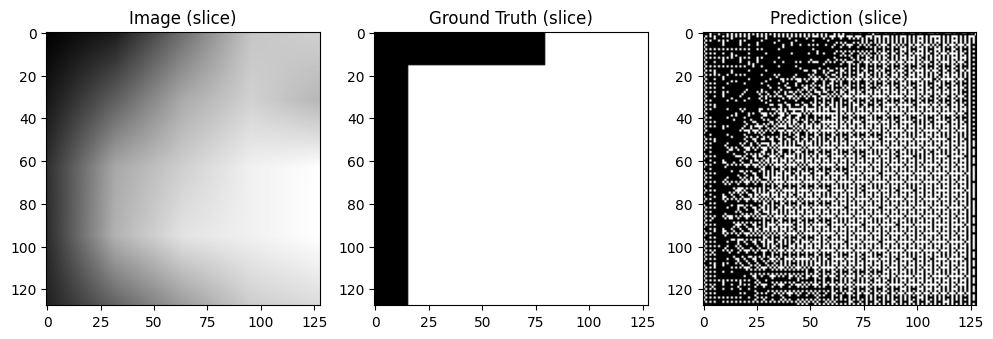

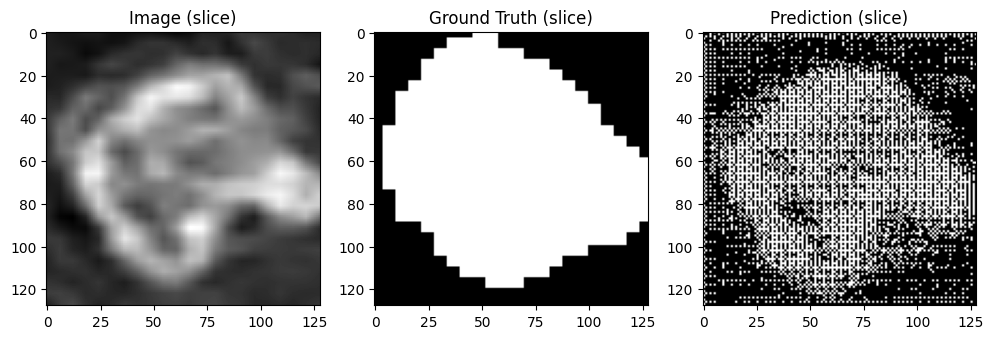

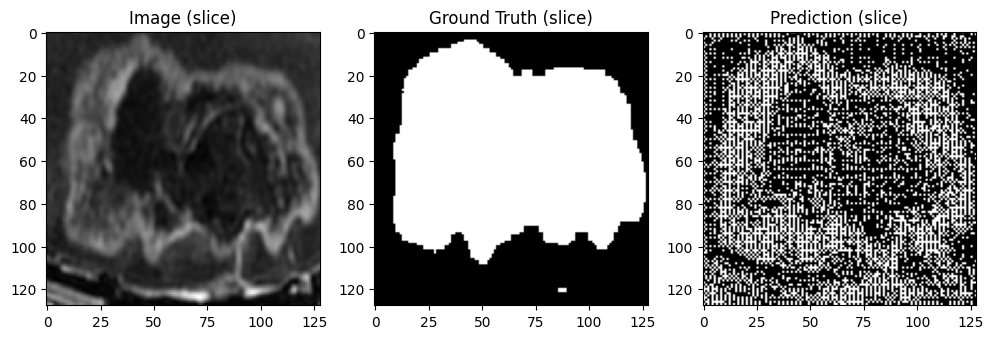

Validation Dice: 0.5383
Saved new best model!
Epoch 3/100


  0%|          | 0/7 [00:00<?, ?it/s]

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-061/label_nii_resampled/ReMIND-061-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-020/label_nii_resampled/ReMIND-020-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-037/label_nii_resampled/ReMIND-037-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-110/label_nii_resampled/ReMIND-110-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-059/label_nii_resampled/ReMIND-059-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-035/label_nii_resampled/ReMIND-035-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-0

 14%|█▍        | 1/7 [00:07<00:42,  7.16s/it]

training loss : 0.5697802305221558


 29%|██▊       | 2/7 [00:07<00:15,  3.17s/it]

training loss : 0.5460547804832458
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-014/label_nii_resampled/ReMIND-014-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-063/label_nii_resampled/ReMIND-063-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-050/label_nii_resampled/ReMIND-050-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-043/label_nii_resampled/ReMIND-043-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-025/label_nii_resampled/ReMIND-025-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-074/label_nii_resampled/ReMIND-074-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive

 43%|████▎     | 3/7 [00:12<00:16,  4.18s/it]

training loss : 0.5850693583488464
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-060/label_nii_resampled/ReMIND-060-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-008/label_nii_resampled/ReMIND-008-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-013/label_nii_resampled/ReMIND-013-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-109/label_nii_resampled/ReMIND-109-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


 57%|█████▋    | 4/7 [00:17<00:12,  4.31s/it]

training loss : 0.6575403809547424
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-083/label_nii_resampled/ReMIND-083-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-081/label_nii_resampled/ReMIND-081-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-031/label_nii_resampled/ReMIND-031-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-105/label_nii_resampled/ReMIND-105-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-007/label_nii_resampled/ReMIND-007-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-090/label_nii_resampled/ReMIND-090-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive

 71%|███████▏  | 5/7 [00:27<00:13,  6.50s/it]

training loss : 0.6472562551498413


 86%|████████▌ | 6/7 [00:28<00:04,  4.39s/it]

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-064/label_nii_resampled/ReMIND-064-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
training loss : 0.5786808729171753
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-030/label_nii_resampled/ReMIND-030-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-071/label_nii_resampled/ReMIND-071-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-093/label_nii_resampled/ReMIND-093-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-068/label_nii_resampled/ReMIND-068-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


100%|██████████| 7/7 [00:35<00:00,  5.07s/it]


training loss : 0.6749746203422546
Epoch 3 average loss: 0.6085
Epoch 4/100


  0%|          | 0/7 [00:00<?, ?it/s]

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-068/label_nii_resampled/ReMIND-068-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-061/label_nii_resampled/ReMIND-061-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-015/label_nii_resampled/ReMIND-015-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-063/label_nii_resampled/ReMIND-063-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-043/label_nii_resampled/ReMIND-043-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-072/label_nii_resampled/ReMIND-072-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-0

 14%|█▍        | 1/7 [00:06<00:40,  6.69s/it]

training loss : 0.5819371938705444
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-050/label_nii_resampled/ReMIND-050-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-007/label_nii_resampled/ReMIND-007-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gzMask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-022/label_nii_resampled/ReMIND-022-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-037/label_nii_resampled/ReMIND-037-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-081/label_nii_resampled/ReMIND-081-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


 29%|██▊       | 2/7 [00:09<00:22,  4.54s/it]

training loss : 0.5552453994750977
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-082/label_nii_resampled/ReMIND-082-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-008/label_nii_resampled/ReMIND-008-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-025/label_nii_resampled/ReMIND-025-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-103/label_nii_resampled/ReMIND-103-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


 43%|████▎     | 3/7 [00:13<00:16,  4.12s/it]

training loss : 0.5555063486099243
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-110/label_nii_resampled/ReMIND-110-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-089/label_nii_resampled/ReMIND-089-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-071/label_nii_resampled/ReMIND-071-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-062/label_nii_resampled/ReMIND-062-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-074/label_nii_resampled/ReMIND-074-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-083/label_nii_resampled/ReMIND-083-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive

 57%|█████▋    | 4/7 [00:25<00:22,  7.40s/it]

training loss : 0.665207028388977
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-031/label_nii_resampled/ReMIND-031-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-059/label_nii_resampled/ReMIND-059-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


 71%|███████▏  | 5/7 [00:26<00:10,  5.08s/it]

training loss : 0.5708127617835999
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-064/label_nii_resampled/ReMIND-064-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-060/label_nii_resampled/ReMIND-060-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-077/label_nii_resampled/ReMIND-077-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-014/label_nii_resampled/ReMIND-014-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-109/label_nii_resampled/ReMIND-109-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-090/label_nii_resampled/ReMIND-090-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive

 86%|████████▌ | 6/7 [00:33<00:05,  5.50s/it]

training loss : 0.6152416467666626


100%|██████████| 7/7 [00:33<00:00,  4.79s/it]

training loss : 0.621558666229248
Epoch 4 average loss: 0.5951


Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-104/label_nii_resampled/ReMIND-104-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-016/label_nii_resampled/ReMIND-016-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-038/label_nii_resampled/ReMIND-038-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-113/label_nii_resampled/ReMIND-113-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-084/label_nii_resampled/ReMIND-084-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-029/label_nii_resampled/ReMIND-029-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-0

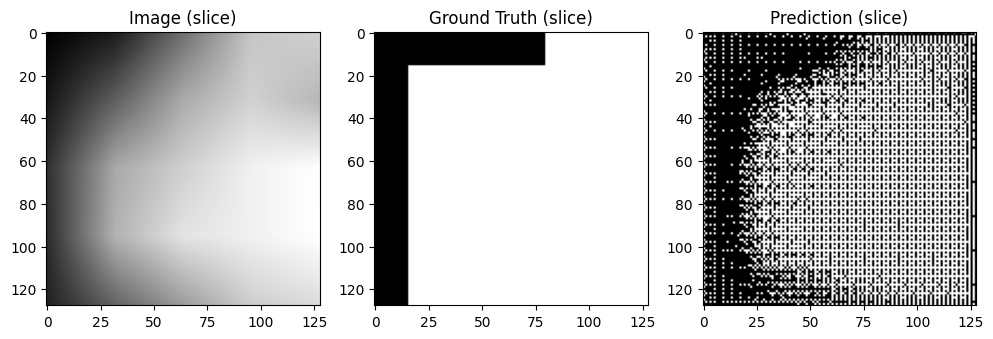

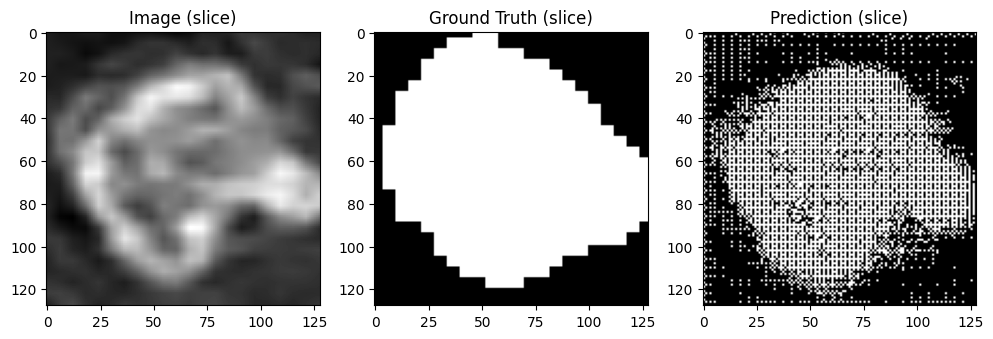

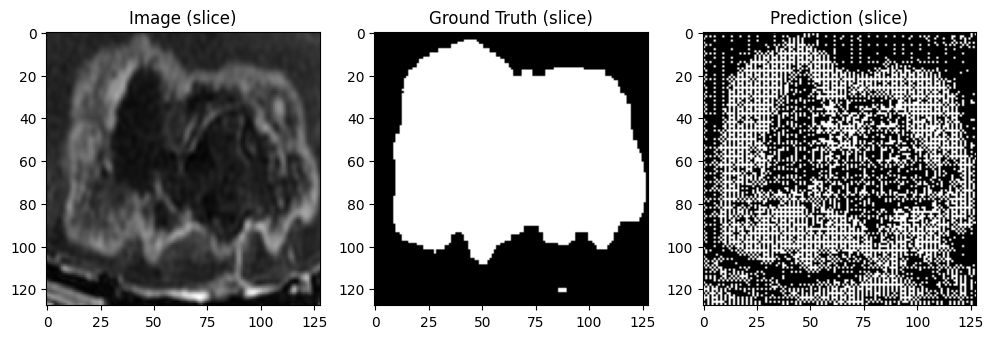

Validation Dice: 0.6035
Saved new best model!
Epoch 5/100


  0%|          | 0/7 [00:00<?, ?it/s]

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-071/label_nii_resampled/ReMIND-071-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-068/label_nii_resampled/ReMIND-068-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-036/label_nii_resampled/ReMIND-036-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-060/label_nii_resampled/ReMIND-060-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-103/label_nii_resampled/ReMIND-103-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-083/label_nii_resampled/ReMIND-083-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-1

 14%|█▍        | 1/7 [00:16<01:40, 16.69s/it]

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-063/label_nii_resampled/ReMIND-063-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
training loss : 0.5775394439697266


 29%|██▊       | 2/7 [00:17<00:35,  7.11s/it]

training loss : 0.615229606628418
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-020/label_nii_resampled/ReMIND-020-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-008/label_nii_resampled/ReMIND-008-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-022/label_nii_resampled/ReMIND-022-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-030/label_nii_resampled/ReMIND-030-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-031/label_nii_resampled/ReMIND-031-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-035/label_nii_resampled/ReMIND-035-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/

 43%|████▎     | 3/7 [00:22<00:25,  6.37s/it]

training loss : 0.5356485247612


 57%|█████▋    | 4/7 [00:22<00:11,  3.99s/it]

training loss : 0.6017555594444275
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-097/label_nii_resampled/ReMIND-097-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-007/label_nii_resampled/ReMIND-007-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-017/label_nii_resampled/ReMIND-017-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-105/label_nii_resampled/ReMIND-105-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-062/label_nii_resampled/ReMIND-062-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-045/label_nii_resampled/ReMIND-045-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive

 71%|███████▏  | 5/7 [00:28<00:09,  4.66s/it]

training loss : 0.5516373515129089
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-090/label_nii_resampled/ReMIND-090-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-109/label_nii_resampled/ReMIND-109-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


 86%|████████▌ | 6/7 [00:31<00:03,  3.91s/it]

training loss : 0.63322913646698
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-013/label_nii_resampled/ReMIND-013-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-089/label_nii_resampled/ReMIND-089-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-025/label_nii_resampled/ReMIND-025-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-014/label_nii_resampled/ReMIND-014-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


100%|██████████| 7/7 [00:36<00:00,  5.26s/it]


training loss : 0.5789695978164673
Epoch 5 average loss: 0.5849
Epoch 6/100


  0%|          | 0/7 [00:00<?, ?it/s]

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-030/label_nii_resampled/ReMIND-030-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-050/label_nii_resampled/ReMIND-050-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-077/label_nii_resampled/ReMIND-077-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-015/label_nii_resampled/ReMIND-015-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-064/label_nii_resampled/ReMIND-064-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-036/label_nii_resampled/ReMIND-036-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-0

 14%|█▍        | 1/7 [00:09<00:54,  9.03s/it]

training loss : 0.6121169328689575


 29%|██▊       | 2/7 [00:09<00:19,  3.93s/it]

training loss : 0.560722291469574
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-105/label_nii_resampled/ReMIND-105-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-097/label_nii_resampled/ReMIND-097-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-072/label_nii_resampled/ReMIND-072-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-034/label_nii_resampled/ReMIND-034-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-082/label_nii_resampled/ReMIND-082-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-062/label_nii_resampled/ReMIND-062-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/

 43%|████▎     | 3/7 [00:20<00:29,  7.34s/it]

training loss : 0.5782513618469238


 57%|█████▋    | 4/7 [00:21<00:13,  4.64s/it]

training loss : 0.6033439040184021
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-063/label_nii_resampled/ReMIND-063-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-061/label_nii_resampled/ReMIND-061-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-017/label_nii_resampled/ReMIND-017-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-022/label_nii_resampled/ReMIND-022-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-008/label_nii_resampled/ReMIND-008-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-014/label_nii_resampled/ReMIND-014-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive

 71%|███████▏  | 5/7 [00:30<00:12,  6.19s/it]

training loss : 0.6178502440452576


 86%|████████▌ | 6/7 [00:30<00:04,  4.24s/it]

training loss : 0.5015076994895935
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-074/label_nii_resampled/ReMIND-074-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-060/label_nii_resampled/ReMIND-060-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-102/label_nii_resampled/ReMIND-102-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-073/label_nii_resampled/ReMIND-073-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-035/label_nii_resampled/ReMIND-035-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


100%|██████████| 7/7 [00:35<00:00,  5.06s/it]

training loss : 0.5620569586753845
Epoch 6 average loss: 0.5765


Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-104/label_nii_resampled/ReMIND-104-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-016/label_nii_resampled/ReMIND-016-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-038/label_nii_resampled/ReMIND-038-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-113/label_nii_resampled/ReMIND-113-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-084/label_nii_resampled/ReMIND-084-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-029/label_nii_resampled/ReMIND-029-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-0

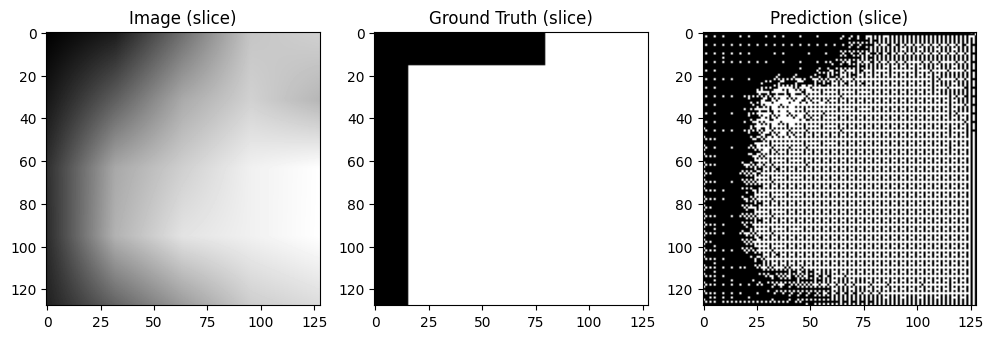

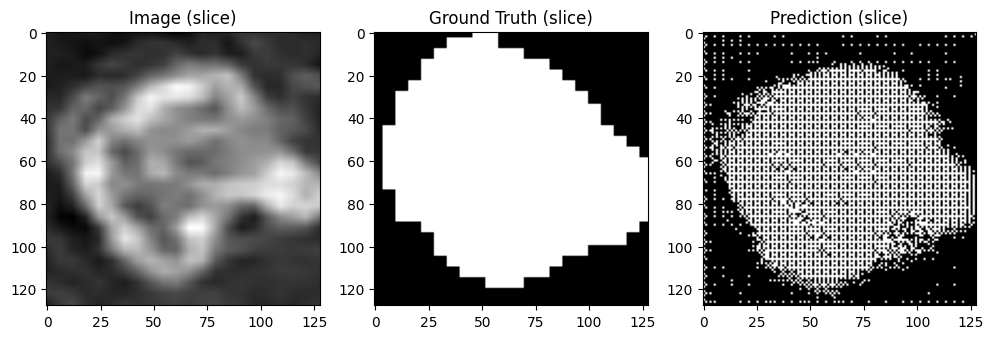

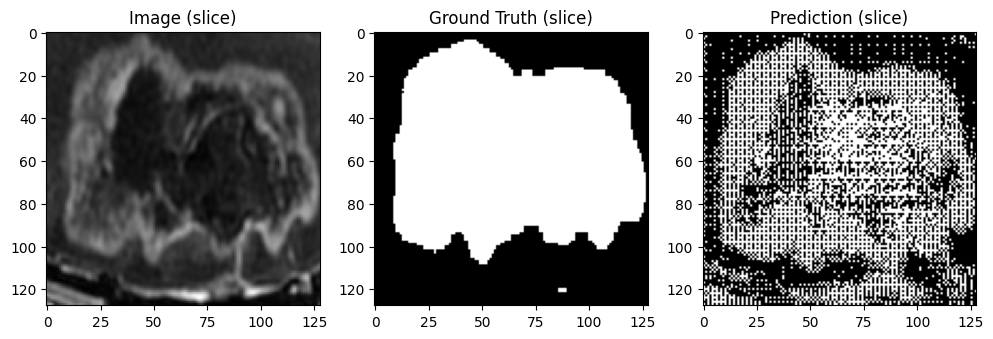

Validation Dice: 0.6331
Saved new best model!
Epoch 7/100


  0%|          | 0/7 [00:00<?, ?it/s]

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-022/label_nii_resampled/ReMIND-022-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-034/label_nii_resampled/ReMIND-034-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-103/label_nii_resampled/ReMIND-103-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-110/label_nii_resampled/ReMIND-110-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-077/label_nii_resampled/ReMIND-077-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-015/label_nii_resampled/ReMIND-015-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-0

 14%|█▍        | 1/7 [00:12<01:17, 12.91s/it]

training loss : 0.5254875421524048


 29%|██▊       | 2/7 [00:13<00:28,  5.64s/it]

training loss : 0.58925461769104
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-105/label_nii_resampled/ReMIND-105-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-060/label_nii_resampled/ReMIND-060-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-068/label_nii_resampled/ReMIND-068-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-093/label_nii_resampled/ReMIND-093-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-071/label_nii_resampled/ReMIND-071-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-014/label_nii_resampled/ReMIND-014-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/M

 43%|████▎     | 3/7 [00:21<00:26,  6.60s/it]

training loss : 0.6588832139968872
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-020/label_nii_resampled/ReMIND-020-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-073/label_nii_resampled/ReMIND-073-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-072/label_nii_resampled/ReMIND-072-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-081/label_nii_resampled/ReMIND-081-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-007/label_nii_resampled/ReMIND-007-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-025/label_nii_resampled/ReMIND-025-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


 57%|█████▋    | 4/7 [00:24<00:16,  5.47s/it]

training loss : 0.5692356824874878
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-089/label_nii_resampled/ReMIND-089-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-083/label_nii_resampled/ReMIND-083-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-030/label_nii_resampled/ReMIND-030-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-064/label_nii_resampled/ReMIND-064-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-090/label_nii_resampled/ReMIND-090-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-059/label_nii_resampled/ReMIND-059-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


 71%|███████▏  | 5/7 [00:30<00:10,  5.37s/it]

training loss : 0.5946335196495056
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-062/label_nii_resampled/ReMIND-062-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-063/label_nii_resampled/ReMIND-063-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-102/label_nii_resampled/ReMIND-102-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-037/label_nii_resampled/ReMIND-037-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-109/label_nii_resampled/ReMIND-109-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


 86%|████████▌ | 6/7 [00:34<00:05,  5.01s/it]

training loss : 0.5561482906341553
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-097/label_nii_resampled/ReMIND-097-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-061/label_nii_resampled/ReMIND-061-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


100%|██████████| 7/7 [00:37<00:00,  5.32s/it]


training loss : 0.5157167911529541
Epoch 7 average loss: 0.5728
Epoch 8/100


  0%|          | 0/7 [00:00<?, ?it/s]

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-110/label_nii_resampled/ReMIND-110-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-007/label_nii_resampled/ReMIND-007-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-072/label_nii_resampled/ReMIND-072-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-089/label_nii_resampled/ReMIND-089-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-061/label_nii_resampled/ReMIND-061-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-109/label_nii_resampled/ReMIND-109-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-0

 14%|█▍        | 1/7 [00:06<00:40,  6.75s/it]

training loss : 0.5594040155410767
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-102/label_nii_resampled/ReMIND-102-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-036/label_nii_resampled/ReMIND-036-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-045/label_nii_resampled/ReMIND-045-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-060/label_nii_resampled/ReMIND-060-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-062/label_nii_resampled/ReMIND-062-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-034/label_nii_resampled/ReMIND-034-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive

 29%|██▊       | 2/7 [00:12<00:29,  5.95s/it]

training loss : 0.5154058337211609
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-030/label_nii_resampled/ReMIND-030-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-082/label_nii_resampled/ReMIND-082-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-074/label_nii_resampled/ReMIND-074-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-037/label_nii_resampled/ReMIND-037-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


 43%|████▎     | 3/7 [00:16<00:20,  5.08s/it]

training loss : 0.5925535559654236
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-090/label_nii_resampled/ReMIND-090-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-025/label_nii_resampled/ReMIND-025-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-093/label_nii_resampled/ReMIND-093-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-064/label_nii_resampled/ReMIND-064-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-014/label_nii_resampled/ReMIND-014-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-013/label_nii_resampled/ReMIND-013-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive

 57%|█████▋    | 4/7 [00:23<00:17,  5.91s/it]

training loss : 0.6043291091918945


 71%|███████▏  | 5/7 [00:23<00:07,  3.93s/it]

training loss : 0.579353392124176
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-031/label_nii_resampled/ReMIND-031-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-081/label_nii_resampled/ReMIND-081-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-035/label_nii_resampled/ReMIND-035-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-068/label_nii_resampled/ReMIND-068-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-008/label_nii_resampled/ReMIND-008-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-083/label_nii_resampled/ReMIND-083-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/

 86%|████████▌ | 6/7 [00:36<00:06,  6.89s/it]

training loss : 0.5646384954452515


100%|██████████| 7/7 [00:36<00:00,  5.27s/it]

training loss : 0.5195832848548889
Epoch 8 average loss: 0.5622


Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-104/label_nii_resampled/ReMIND-104-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-016/label_nii_resampled/ReMIND-016-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-038/label_nii_resampled/ReMIND-038-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-113/label_nii_resampled/ReMIND-113-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-084/label_nii_resampled/ReMIND-084-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-029/label_nii_resampled/ReMIND-029-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-0

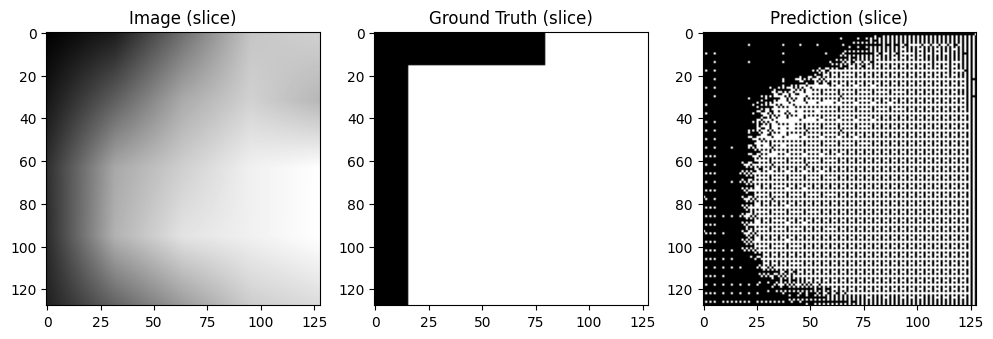

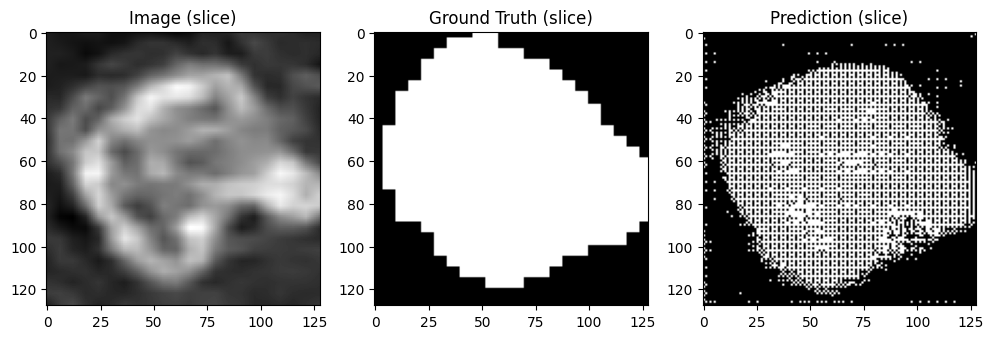

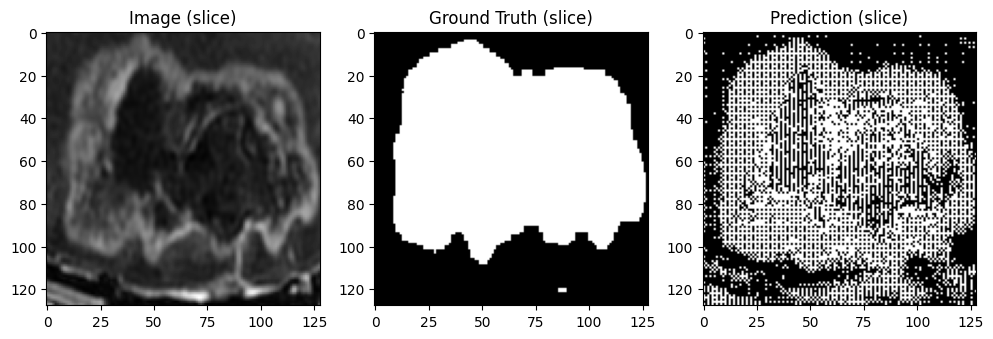

Validation Dice: 0.6778
Saved new best model!
Epoch 9/100


  0%|          | 0/7 [00:00<?, ?it/s]

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-008/label_nii_resampled/ReMIND-008-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gzMask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-071/label_nii_resampled/ReMIND-071-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-064/label_nii_resampled/ReMIND-064-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-061/label_nii_resampled/ReMIND-061-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-097/label_nii_resampled/ReMIND-097-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-035/label_nii_resampled/ReMIND-035-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-0

 14%|█▍        | 1/7 [00:17<01:42, 17.11s/it]

training loss : 0.5947394371032715


 29%|██▊       | 2/7 [00:17<00:36,  7.26s/it]

training loss : 0.5214198231697083
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-089/label_nii_resampled/ReMIND-089-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-059/label_nii_resampled/ReMIND-059-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-014/label_nii_resampled/ReMIND-014-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-036/label_nii_resampled/ReMIND-036-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-060/label_nii_resampled/ReMIND-060-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-015/label_nii_resampled/ReMIND-015-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive

 43%|████▎     | 3/7 [00:24<00:28,  7.08s/it]

training loss : 0.5432102084159851


 57%|█████▋    | 4/7 [00:24<00:13,  4.49s/it]

training loss : 0.5311998128890991
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-082/label_nii_resampled/ReMIND-082-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gzMask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-013/label_nii_resampled/ReMIND-013-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-037/label_nii_resampled/ReMIND-037-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-083/label_nii_resampled/ReMIND-083-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-103/label_nii_resampled/ReMIND-103-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-007/label_nii_resampled/ReMIND-007-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive

 71%|███████▏  | 5/7 [00:33<00:12,  6.13s/it]

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-063/label_nii_resampled/ReMIND-063-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
training loss : 0.5421658754348755
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-074/label_nii_resampled/ReMIND-074-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


 86%|████████▌ | 6/7 [00:35<00:04,  4.55s/it]

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-072/label_nii_resampled/ReMIND-072-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
training loss : 0.5794464349746704
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-077/label_nii_resampled/ReMIND-077-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-017/label_nii_resampled/ReMIND-017-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-090/label_nii_resampled/ReMIND-090-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


100%|██████████| 7/7 [00:38<00:00,  5.44s/it]


training loss : 0.5667175650596619
Epoch 9 average loss: 0.5541
Epoch 10/100


  0%|          | 0/7 [00:00<?, ?it/s]

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-090/label_nii_resampled/ReMIND-090-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-025/label_nii_resampled/ReMIND-025-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-097/label_nii_resampled/ReMIND-097-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-037/label_nii_resampled/ReMIND-037-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-008/label_nii_resampled/ReMIND-008-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-060/label_nii_resampled/ReMIND-060-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-0

 14%|█▍        | 1/7 [00:16<01:37, 16.30s/it]

training loss : 0.5797962546348572


 29%|██▊       | 2/7 [00:16<00:34,  6.96s/it]

training loss : 0.6113187074661255
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-030/label_nii_resampled/ReMIND-030-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-015/label_nii_resampled/ReMIND-015-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-043/label_nii_resampled/ReMIND-043-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-093/label_nii_resampled/ReMIND-093-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-013/label_nii_resampled/ReMIND-013-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-050/label_nii_resampled/ReMIND-050-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive

 43%|████▎     | 3/7 [00:24<00:29,  7.34s/it]

training loss : 0.6015141606330872


 57%|█████▋    | 4/7 [00:25<00:14,  4.69s/it]

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-061/label_nii_resampled/ReMIND-061-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
training loss : 0.5312759876251221
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-102/label_nii_resampled/ReMIND-102-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-082/label_nii_resampled/ReMIND-082-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-089/label_nii_resampled/ReMIND-089-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-035/label_nii_resampled/ReMIND-035-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-072/label_nii_resampled/ReMIND-072-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive

 71%|███████▏  | 5/7 [00:30<00:10,  5.06s/it]

training loss : 0.5245690941810608


 86%|████████▌ | 6/7 [00:31<00:03,  3.51s/it]

training loss : 0.5463246703147888
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-017/label_nii_resampled/ReMIND-017-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-073/label_nii_resampled/ReMIND-073-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-103/label_nii_resampled/ReMIND-103-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-007/label_nii_resampled/ReMIND-007-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-059/label_nii_resampled/ReMIND-059-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


100%|██████████| 7/7 [00:36<00:00,  5.26s/it]

training loss : 0.45221206545829773
Epoch 10 average loss: 0.5496


Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-104/label_nii_resampled/ReMIND-104-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-016/label_nii_resampled/ReMIND-016-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-038/label_nii_resampled/ReMIND-038-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-113/label_nii_resampled/ReMIND-113-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-084/label_nii_resampled/ReMIND-084-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-029/label_nii_resampled/ReMIND-029-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-0

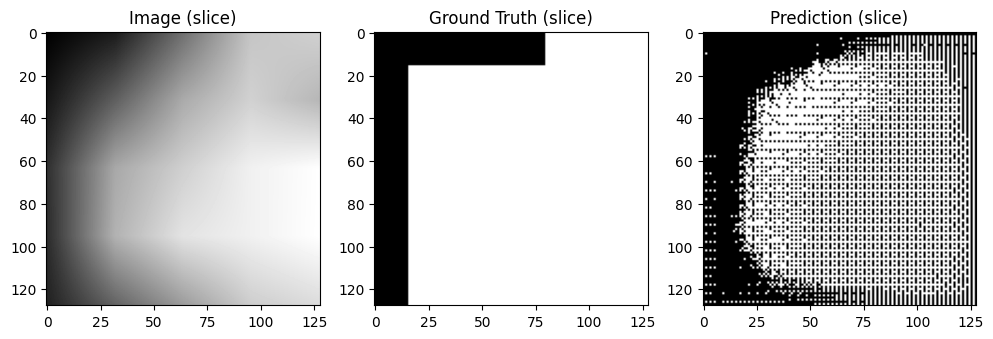

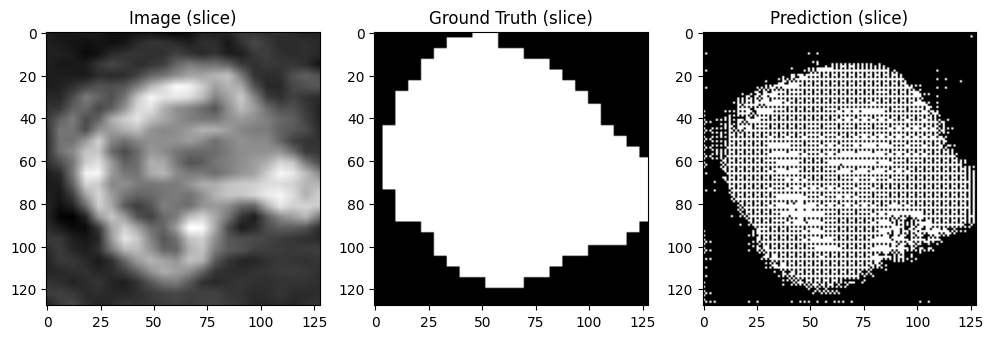

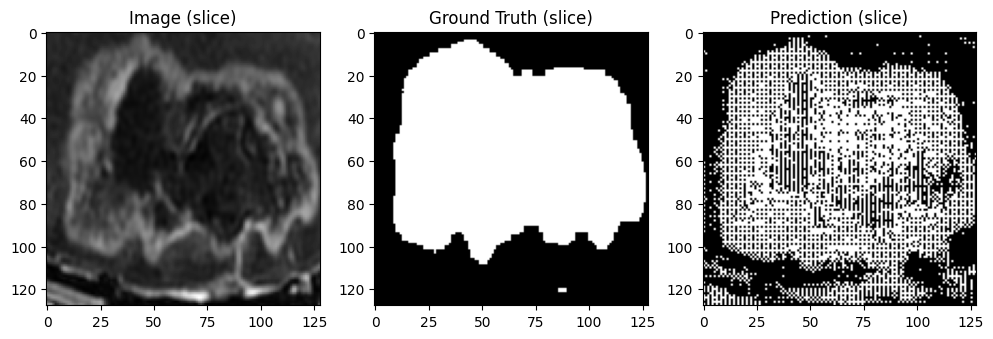

Validation Dice: 0.7041
Saved new best model!
Epoch 11/100


  0%|          | 0/7 [00:00<?, ?it/s]

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-059/label_nii_resampled/ReMIND-059-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-060/label_nii_resampled/ReMIND-060-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-043/label_nii_resampled/ReMIND-043-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-083/label_nii_resampled/ReMIND-083-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-007/label_nii_resampled/ReMIND-007-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-030/label_nii_resampled/ReMIND-030-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-1

 14%|█▍        | 1/7 [00:07<00:45,  7.54s/it]

training loss : 0.501746654510498


 29%|██▊       | 2/7 [00:07<00:16,  3.31s/it]

training loss : 0.5323063731193542
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-072/label_nii_resampled/ReMIND-072-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-031/label_nii_resampled/ReMIND-031-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-081/label_nii_resampled/ReMIND-081-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-077/label_nii_resampled/ReMIND-077-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-015/label_nii_resampled/ReMIND-015-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gzMask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-036/label_nii_resampled/ReMIND-036-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz

Mask get path: /content/drive

 43%|████▎     | 3/7 [00:14<00:19,  4.87s/it]

training loss : 0.500572144985199
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-013/label_nii_resampled/ReMIND-013-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-071/label_nii_resampled/ReMIND-071-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-063/label_nii_resampled/ReMIND-063-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-097/label_nii_resampled/ReMIND-097-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-062/label_nii_resampled/ReMIND-062-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-035/label_nii_resampled/ReMIND-035-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/

 57%|█████▋    | 4/7 [00:24<00:19,  6.66s/it]

training loss : 0.638350784778595


 71%|███████▏  | 5/7 [00:24<00:08,  4.45s/it]

training loss : 0.5101228952407837
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-014/label_nii_resampled/ReMIND-014-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-105/label_nii_resampled/ReMIND-105-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-074/label_nii_resampled/ReMIND-074-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-090/label_nii_resampled/ReMIND-090-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-103/label_nii_resampled/ReMIND-103-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-093/label_nii_resampled/ReMIND-093-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive

 86%|████████▌ | 6/7 [00:34<00:06,  6.37s/it]

training loss : 0.5096246004104614


100%|██████████| 7/7 [00:35<00:00,  5.02s/it]

training loss : 0.6050905585289001


Epoch 11 average loss: 0.5425
Epoch 12/100


  0%|          | 0/7 [00:00<?, ?it/s]

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-007/label_nii_resampled/ReMIND-007-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-037/label_nii_resampled/ReMIND-037-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-045/label_nii_resampled/ReMIND-045-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-059/label_nii_resampled/ReMIND-059-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-063/label_nii_resampled/ReMIND-063-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-089/label_nii_resampled/ReMIND-089-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-0

 14%|█▍        | 1/7 [00:07<00:46,  7.69s/it]

training loss : 0.5684499740600586
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-017/label_nii_resampled/ReMIND-017-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


 29%|██▊       | 2/7 [00:10<00:23,  4.75s/it]

training loss : 0.5273458957672119
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-025/label_nii_resampled/ReMIND-025-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-034/label_nii_resampled/ReMIND-034-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-083/label_nii_resampled/ReMIND-083-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-036/label_nii_resampled/ReMIND-036-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-013/label_nii_resampled/ReMIND-013-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-110/label_nii_resampled/ReMIND-110-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive

 43%|████▎     | 3/7 [00:24<00:35,  8.83s/it]

training loss : 0.5587153434753418


 57%|█████▋    | 4/7 [00:24<00:16,  5.52s/it]

training loss : 0.47670599818229675
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-015/label_nii_resampled/ReMIND-015-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-109/label_nii_resampled/ReMIND-109-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-043/label_nii_resampled/ReMIND-043-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-072/label_nii_resampled/ReMIND-072-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-030/label_nii_resampled/ReMIND-030-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-064/label_nii_resampled/ReMIND-064-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/driv

 71%|███████▏  | 5/7 [00:31<00:12,  6.00s/it]

training loss : 0.5801045298576355


 86%|████████▌ | 6/7 [00:31<00:04,  4.07s/it]

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-014/label_nii_resampled/ReMIND-014-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
training loss : 0.5166361331939697
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-061/label_nii_resampled/ReMIND-061-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-105/label_nii_resampled/ReMIND-105-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-050/label_nii_resampled/ReMIND-050-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-022/label_nii_resampled/ReMIND-022-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


100%|██████████| 7/7 [00:35<00:00,  5.13s/it]

training loss : 0.4959273040294647


Epoch 12 average loss: 0.5320
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-104/label_nii_resampled/ReMIND-104-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-016/label_nii_resampled/ReMIND-016-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-038/label_nii_resampled/ReMIND-038-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-113/label_nii_resampled/ReMIND-113-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-084/label_nii_resampled/ReMIND-084-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-029/label_nii_resampled/ReMIND-029-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My D

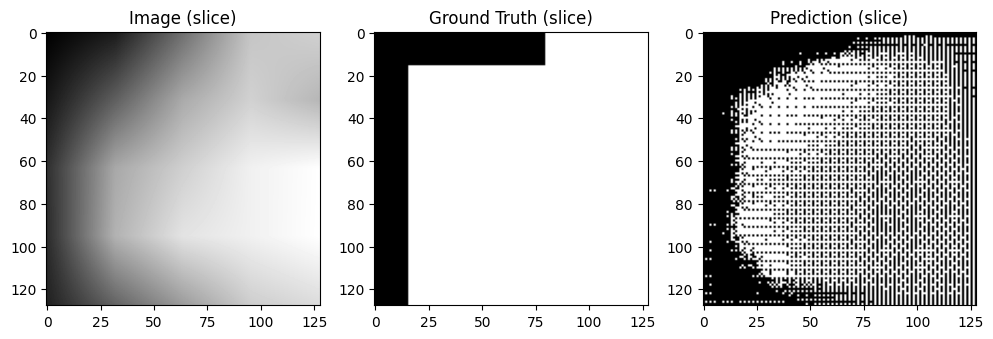

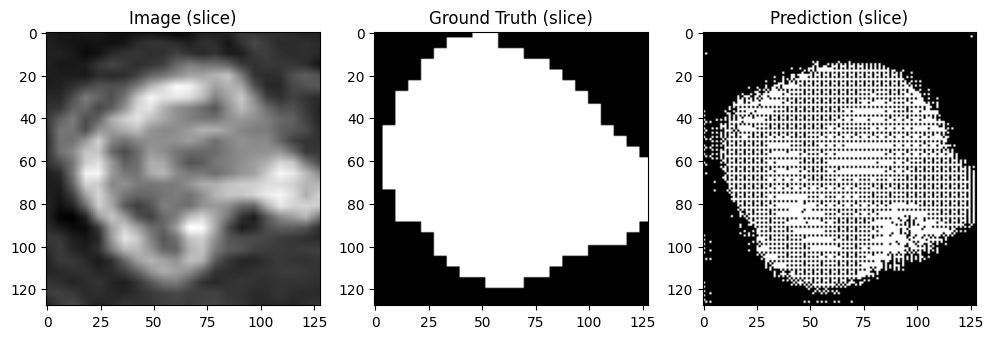

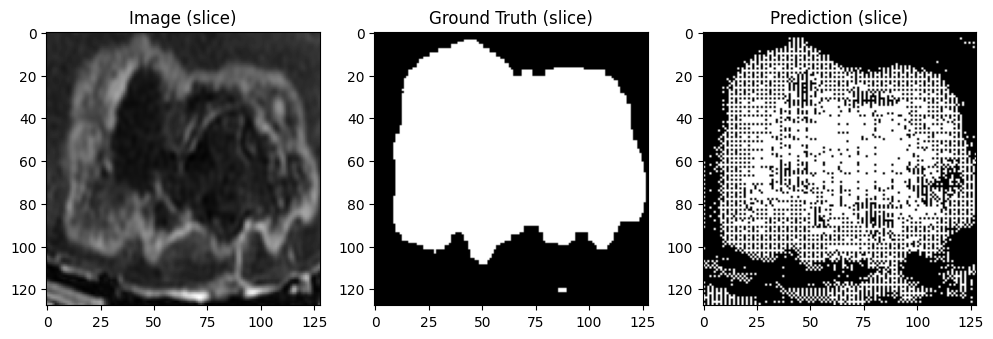

Validation Dice: 0.7119
Saved new best model!
Epoch 13/100


  0%|          | 0/7 [00:00<?, ?it/s]

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-022/label_nii_resampled/ReMIND-022-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-074/label_nii_resampled/ReMIND-074-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-059/label_nii_resampled/ReMIND-059-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-062/label_nii_resampled/ReMIND-062-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-008/label_nii_resampled/ReMIND-008-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-031/label_nii_resampled/ReMIND-031-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-0

 14%|█▍        | 1/7 [00:11<01:06, 11.12s/it]

training loss : 0.5344430804252625
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-083/label_nii_resampled/ReMIND-083-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-017/label_nii_resampled/ReMIND-017-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-060/label_nii_resampled/ReMIND-060-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-063/label_nii_resampled/ReMIND-063-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-089/label_nii_resampled/ReMIND-089-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-073/label_nii_resampled/ReMIND-073-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive

 29%|██▊       | 2/7 [00:17<00:41,  8.26s/it]

training loss : 0.5198462009429932
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-007/label_nii_resampled/ReMIND-007-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-015/label_nii_resampled/ReMIND-015-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


 43%|████▎     | 3/7 [00:18<00:20,  5.13s/it]

training loss : 0.5173914432525635
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-105/label_nii_resampled/ReMIND-105-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-014/label_nii_resampled/ReMIND-014-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-077/label_nii_resampled/ReMIND-077-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-097/label_nii_resampled/ReMIND-097-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-081/label_nii_resampled/ReMIND-081-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-020/label_nii_resampled/ReMIND-020-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive

 57%|█████▋    | 4/7 [00:24<00:15,  5.20s/it]

training loss : 0.5146780014038086
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-050/label_nii_resampled/ReMIND-050-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-068/label_nii_resampled/ReMIND-068-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-037/label_nii_resampled/ReMIND-037-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-103/label_nii_resampled/ReMIND-103-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-043/label_nii_resampled/ReMIND-043-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


 71%|███████▏  | 5/7 [00:27<00:08,  4.43s/it]

training loss : 0.5450481176376343
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-072/label_nii_resampled/ReMIND-072-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-034/label_nii_resampled/ReMIND-034-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-071/label_nii_resampled/ReMIND-071-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


 86%|████████▌ | 6/7 [00:32<00:04,  4.78s/it]

training loss : 0.579397976398468
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-045/label_nii_resampled/ReMIND-045-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-035/label_nii_resampled/ReMIND-035-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-061/label_nii_resampled/ReMIND-061-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-013/label_nii_resampled/ReMIND-013-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


100%|██████████| 7/7 [00:38<00:00,  5.43s/it]


training loss : 0.467539519071579
Epoch 13 average loss: 0.5255
Epoch 14/100


  0%|          | 0/7 [00:00<?, ?it/s]

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-060/label_nii_resampled/ReMIND-060-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-063/label_nii_resampled/ReMIND-063-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-013/label_nii_resampled/ReMIND-013-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-031/label_nii_resampled/ReMIND-031-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-074/label_nii_resampled/ReMIND-074-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-008/label_nii_resampled/ReMIND-008-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-0

 14%|█▍        | 1/7 [00:06<00:41,  6.88s/it]

training loss : 0.523345947265625
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-105/label_nii_resampled/ReMIND-105-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-082/label_nii_resampled/ReMIND-082-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-037/label_nii_resampled/ReMIND-037-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-015/label_nii_resampled/ReMIND-015-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-090/label_nii_resampled/ReMIND-090-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-035/label_nii_resampled/ReMIND-035-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/

 29%|██▊       | 2/7 [00:16<00:41,  8.29s/it]

training loss : 0.5718933939933777


 43%|████▎     | 3/7 [00:16<00:19,  4.76s/it]

training loss : 0.4799627959728241
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-102/label_nii_resampled/ReMIND-102-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-022/label_nii_resampled/ReMIND-022-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-007/label_nii_resampled/ReMIND-007-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-045/label_nii_resampled/ReMIND-045-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-068/label_nii_resampled/ReMIND-068-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-071/label_nii_resampled/ReMIND-071-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive

 57%|█████▋    | 4/7 [00:25<00:18,  6.20s/it]

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-062/label_nii_resampled/ReMIND-062-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
training loss : 0.515677273273468


 71%|███████▏  | 5/7 [00:25<00:08,  4.13s/it]

training loss : 0.520773708820343
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-110/label_nii_resampled/ReMIND-110-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-064/label_nii_resampled/ReMIND-064-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-061/label_nii_resampled/ReMIND-061-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-077/label_nii_resampled/ReMIND-077-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-093/label_nii_resampled/ReMIND-093-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-109/label_nii_resampled/ReMIND-109-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/

 86%|████████▌ | 6/7 [00:35<00:05,  5.93s/it]

training loss : 0.45926350355148315


100%|██████████| 7/7 [00:35<00:00,  5.06s/it]

training loss : 0.5463539958000183
Epoch 14 average loss: 0.5168


Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-104/label_nii_resampled/ReMIND-104-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-016/label_nii_resampled/ReMIND-016-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-038/label_nii_resampled/ReMIND-038-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-113/label_nii_resampled/ReMIND-113-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-084/label_nii_resampled/ReMIND-084-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-029/label_nii_resampled/ReMIND-029-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-0

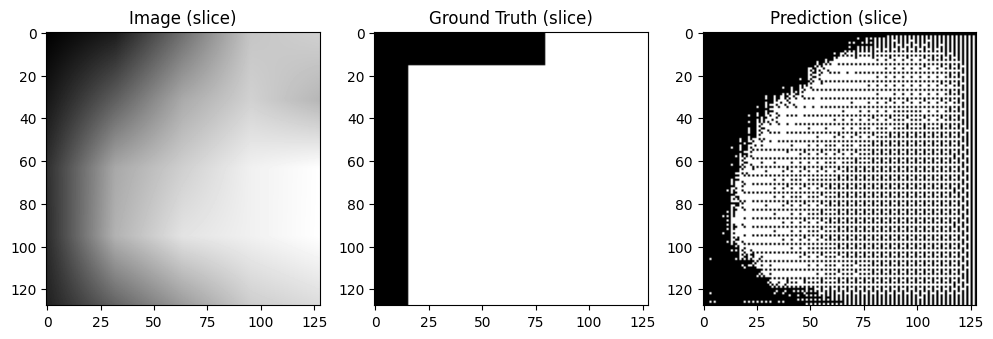

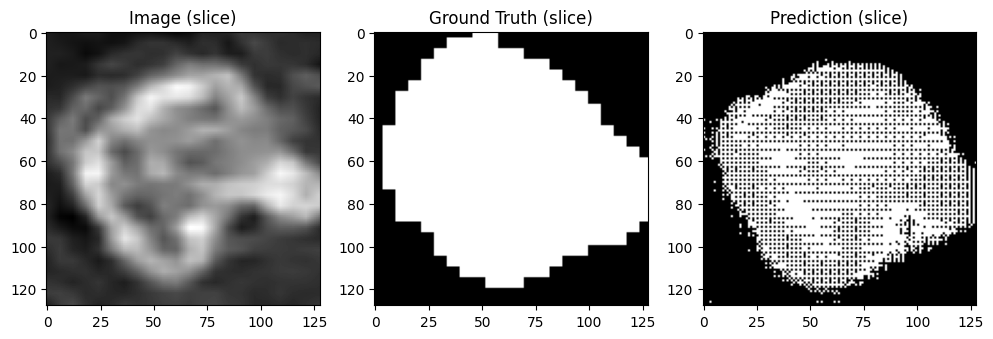

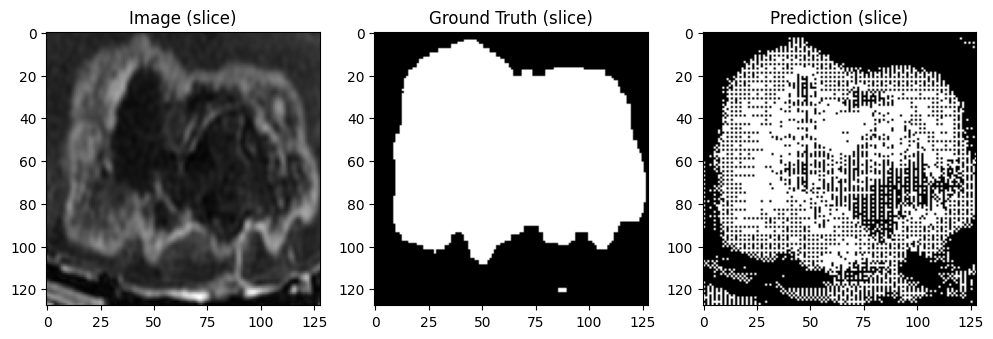

Validation Dice: 0.7465
Saved new best model!
Epoch 15/100


  0%|          | 0/7 [00:00<?, ?it/s]

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-102/label_nii_resampled/ReMIND-102-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-014/label_nii_resampled/ReMIND-014-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-030/label_nii_resampled/ReMIND-030-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-074/label_nii_resampled/ReMIND-074-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-008/label_nii_resampled/ReMIND-008-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-081/label_nii_resampled/ReMIND-081-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-1

 14%|█▍        | 1/7 [00:18<01:48, 18.16s/it]

training loss : 0.505138635635376


 29%|██▊       | 2/7 [00:18<00:38,  7.72s/it]

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-062/label_nii_resampled/ReMIND-062-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
training loss : 0.49746668338775635
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-064/label_nii_resampled/ReMIND-064-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-007/label_nii_resampled/ReMIND-007-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-089/label_nii_resampled/ReMIND-089-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-072/label_nii_resampled/ReMIND-072-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-059/label_nii_resampled/ReMIND-059-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/driv

 43%|████▎     | 3/7 [00:25<00:28,  7.18s/it]

training loss : 0.4989314377307892


 57%|█████▋    | 4/7 [00:25<00:13,  4.60s/it]

training loss : 0.5525874495506287
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-035/label_nii_resampled/ReMIND-035-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-031/label_nii_resampled/ReMIND-031-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-061/label_nii_resampled/ReMIND-061-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-015/label_nii_resampled/ReMIND-015-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-034/label_nii_resampled/ReMIND-034-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-017/label_nii_resampled/ReMIND-017-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive

 71%|███████▏  | 5/7 [00:35<00:12,  6.48s/it]

training loss : 0.483562707901001


 86%|████████▌ | 6/7 [00:35<00:04,  4.40s/it]

training loss : 0.4841389060020447
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-045/label_nii_resampled/ReMIND-045-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-083/label_nii_resampled/ReMIND-083-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-090/label_nii_resampled/ReMIND-090-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-097/label_nii_resampled/ReMIND-097-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-082/label_nii_resampled/ReMIND-082-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


100%|██████████| 7/7 [00:39<00:00,  5.65s/it]


training loss : 0.5404273867607117
Epoch 15 average loss: 0.5089
Epoch 16/100


  0%|          | 0/7 [00:00<?, ?it/s]

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-072/label_nii_resampled/ReMIND-072-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-105/label_nii_resampled/ReMIND-105-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-014/label_nii_resampled/ReMIND-014-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gzMask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-064/label_nii_resampled/ReMIND-064-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-017/label_nii_resampled/ReMIND-017-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-060/label_nii_resampled/ReMIND-060-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-0

 14%|█▍        | 1/7 [00:11<01:06, 11.11s/it]

training loss : 0.5521225929260254


 29%|██▊       | 2/7 [00:11<00:24,  4.92s/it]

training loss : 0.554904580116272
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-062/label_nii_resampled/ReMIND-062-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-063/label_nii_resampled/ReMIND-063-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-045/label_nii_resampled/ReMIND-045-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-022/label_nii_resampled/ReMIND-022-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-089/label_nii_resampled/ReMIND-089-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-036/label_nii_resampled/ReMIND-036-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/

 43%|████▎     | 3/7 [00:18<00:22,  5.63s/it]

training loss : 0.5059922933578491


 57%|█████▋    | 4/7 [00:18<00:10,  3.60s/it]

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-007/label_nii_resampled/ReMIND-007-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-013/label_nii_resampled/ReMIND-013-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
training loss : 0.4481210708618164
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-020/label_nii_resampled/ReMIND-020-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-068/label_nii_resampled/ReMIND-068-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-097/label_nii_resampled/ReMIND-097-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-077/label_nii_resampled/ReMIND-077-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive

 71%|███████▏  | 5/7 [00:33<00:15,  7.80s/it]

training loss : 0.4485306441783905


 86%|████████▌ | 6/7 [00:34<00:05,  5.26s/it]

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-073/label_nii_resampled/ReMIND-073-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
training loss : 0.519348680973053
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-030/label_nii_resampled/ReMIND-030-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-061/label_nii_resampled/ReMIND-061-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-082/label_nii_resampled/ReMIND-082-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-025/label_nii_resampled/ReMIND-025-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


100%|██████████| 7/7 [00:37<00:00,  5.38s/it]

training loss : 0.4809068739414215
Epoch 16 average loss: 0.5014


Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-104/label_nii_resampled/ReMIND-104-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gzMask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-016/label_nii_resampled/ReMIND-016-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-038/label_nii_resampled/ReMIND-038-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-113/label_nii_resampled/ReMIND-113-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-084/label_nii_resampled/ReMIND-084-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-029/label_nii_resampled/ReMIND-029-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-0

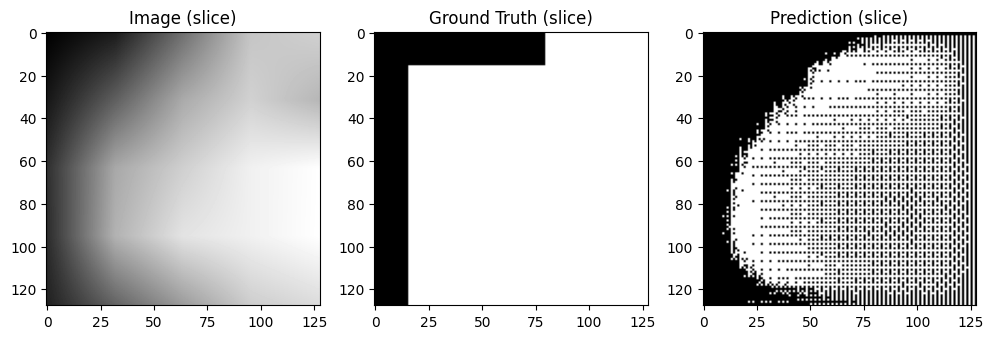

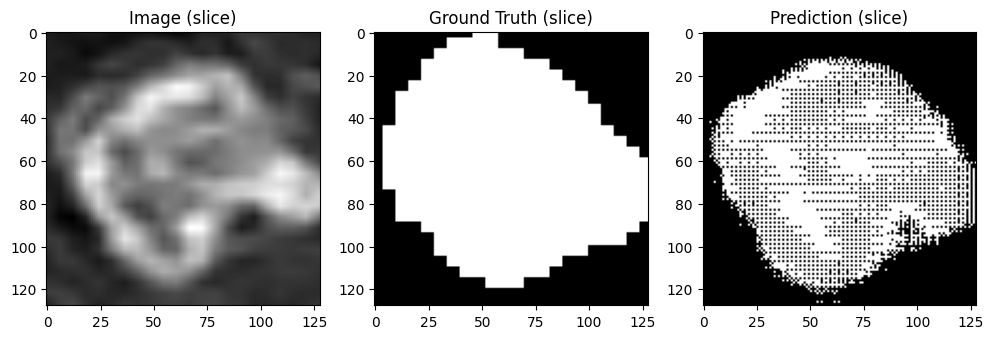

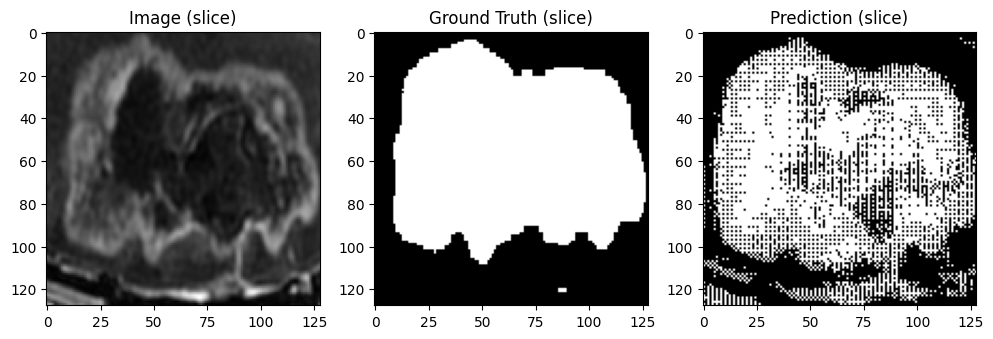

Validation Dice: 0.7568
Saved new best model!
Epoch 17/100


  0%|          | 0/7 [00:00<?, ?it/s]

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-063/label_nii_resampled/ReMIND-063-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-037/label_nii_resampled/ReMIND-037-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-082/label_nii_resampled/ReMIND-082-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-035/label_nii_resampled/ReMIND-035-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-025/label_nii_resampled/ReMIND-025-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-031/label_nii_resampled/ReMIND-031-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-0

 14%|█▍        | 1/7 [00:10<01:02, 10.40s/it]

training loss : 0.46087345480918884


 29%|██▊       | 2/7 [00:10<00:22,  4.58s/it]

training loss : 0.4873926341533661
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-030/label_nii_resampled/ReMIND-030-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-089/label_nii_resampled/ReMIND-089-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-097/label_nii_resampled/ReMIND-097-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-022/label_nii_resampled/ReMIND-022-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-059/label_nii_resampled/ReMIND-059-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-015/label_nii_resampled/ReMIND-015-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive

 43%|████▎     | 3/7 [00:20<00:26,  6.70s/it]

training loss : 0.5025882720947266
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-068/label_nii_resampled/ReMIND-068-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


 57%|█████▋    | 4/7 [00:20<00:12,  4.29s/it]

training loss : 0.47187352180480957
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-071/label_nii_resampled/ReMIND-071-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-045/label_nii_resampled/ReMIND-045-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-036/label_nii_resampled/ReMIND-036-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-008/label_nii_resampled/ReMIND-008-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-110/label_nii_resampled/ReMIND-110-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-090/label_nii_resampled/ReMIND-090-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/driv

 71%|███████▏  | 5/7 [00:29<00:11,  5.79s/it]

training loss : 0.48390987515449524
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-064/label_nii_resampled/ReMIND-064-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-103/label_nii_resampled/ReMIND-103-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


 86%|████████▌ | 6/7 [00:32<00:04,  4.85s/it]

training loss : 0.4855806827545166
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-060/label_nii_resampled/ReMIND-060-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-017/label_nii_resampled/ReMIND-017-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-077/label_nii_resampled/ReMIND-077-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


100%|██████████| 7/7 [00:36<00:00,  5.21s/it]


training loss : 0.5436013340950012
Epoch 17 average loss: 0.4908
Epoch 18/100


  0%|          | 0/7 [00:00<?, ?it/s]

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-064/label_nii_resampled/ReMIND-064-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-014/label_nii_resampled/ReMIND-014-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-072/label_nii_resampled/ReMIND-072-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-008/label_nii_resampled/ReMIND-008-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-105/label_nii_resampled/ReMIND-105-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-089/label_nii_resampled/ReMIND-089-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-0

 14%|█▍        | 1/7 [00:07<00:46,  7.80s/it]

training loss : 0.5203778743743896
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-090/label_nii_resampled/ReMIND-090-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-074/label_nii_resampled/ReMIND-074-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-031/label_nii_resampled/ReMIND-031-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-030/label_nii_resampled/ReMIND-030-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-034/label_nii_resampled/ReMIND-034-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-059/label_nii_resampled/ReMIND-059-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive

 29%|██▊       | 2/7 [00:15<00:39,  7.90s/it]

training loss : 0.46320173144340515


 43%|████▎     | 3/7 [00:16<00:18,  4.56s/it]

training loss : 0.4686433970928192
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-061/label_nii_resampled/ReMIND-061-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-082/label_nii_resampled/ReMIND-082-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-045/label_nii_resampled/ReMIND-045-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-060/label_nii_resampled/ReMIND-060-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-013/label_nii_resampled/ReMIND-013-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-071/label_nii_resampled/ReMIND-071-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive

 57%|█████▋    | 4/7 [00:25<00:18,  6.27s/it]

training loss : 0.46491876244544983
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-025/label_nii_resampled/ReMIND-025-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-043/label_nii_resampled/ReMIND-043-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


 71%|███████▏  | 5/7 [00:26<00:08,  4.45s/it]

training loss : 0.522190272808075
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-015/label_nii_resampled/ReMIND-015-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-077/label_nii_resampled/ReMIND-077-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-093/label_nii_resampled/ReMIND-093-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-035/label_nii_resampled/ReMIND-035-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-073/label_nii_resampled/ReMIND-073-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-103/label_nii_resampled/ReMIND-103-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/

 86%|████████▌ | 6/7 [00:35<00:06,  6.05s/it]

training loss : 0.43027472496032715


100%|██████████| 7/7 [00:36<00:00,  5.15s/it]

training loss : 0.5138488411903381
Epoch 18 average loss: 0.4834


Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-104/label_nii_resampled/ReMIND-104-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-016/label_nii_resampled/ReMIND-016-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-038/label_nii_resampled/ReMIND-038-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-113/label_nii_resampled/ReMIND-113-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-084/label_nii_resampled/ReMIND-084-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-029/label_nii_resampled/ReMIND-029-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-0

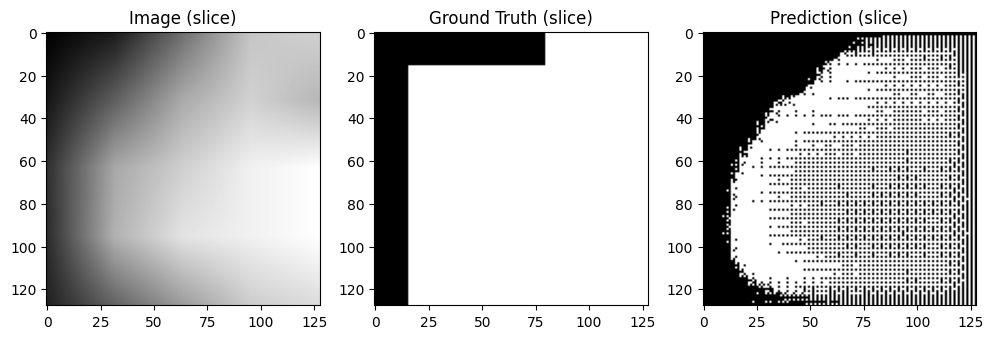

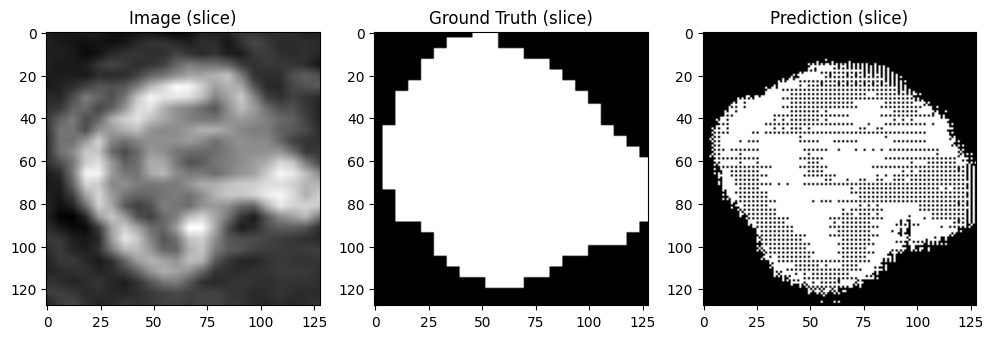

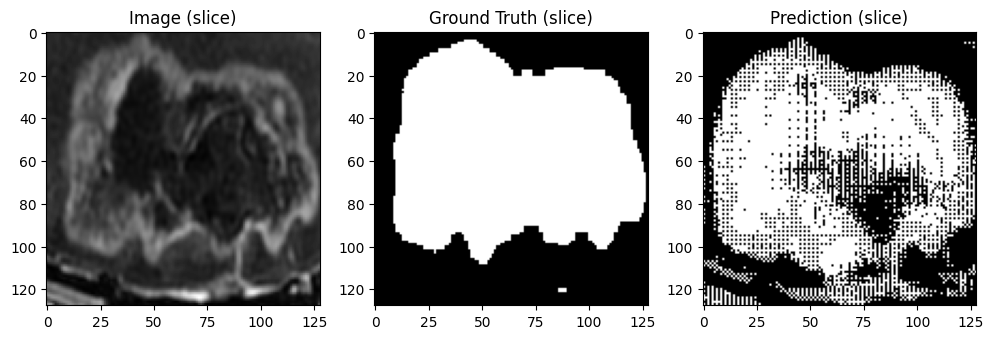

Validation Dice: 0.7658
Saved new best model!
Epoch 19/100


  0%|          | 0/7 [00:00<?, ?it/s]

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-071/label_nii_resampled/ReMIND-071-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-064/label_nii_resampled/ReMIND-064-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-110/label_nii_resampled/ReMIND-110-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-043/label_nii_resampled/ReMIND-043-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-061/label_nii_resampled/ReMIND-061-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-081/label_nii_resampled/ReMIND-081-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-0

 14%|█▍        | 1/7 [00:09<00:57,  9.59s/it]

training loss : 0.42512837052345276
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-109/label_nii_resampled/ReMIND-109-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gzMask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-025/label_nii_resampled/ReMIND-025-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz



 29%|██▊       | 2/7 [00:11<00:24,  4.91s/it]

training loss : 0.5702398419380188
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-007/label_nii_resampled/ReMIND-007-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-083/label_nii_resampled/ReMIND-083-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-030/label_nii_resampled/ReMIND-030-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-102/label_nii_resampled/ReMIND-102-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-017/label_nii_resampled/ReMIND-017-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-089/label_nii_resampled/ReMIND-089-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive

 43%|████▎     | 3/7 [00:19<00:26,  6.53s/it]

training loss : 0.4162227511405945
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-020/label_nii_resampled/ReMIND-020-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-072/label_nii_resampled/ReMIND-072-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-068/label_nii_resampled/ReMIND-068-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-103/label_nii_resampled/ReMIND-103-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-097/label_nii_resampled/ReMIND-097-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


 57%|█████▋    | 4/7 [00:22<00:15,  5.03s/it]

training loss : 0.4337669610977173
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-060/label_nii_resampled/ReMIND-060-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-015/label_nii_resampled/ReMIND-015-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-050/label_nii_resampled/ReMIND-050-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-062/label_nii_resampled/ReMIND-062-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


 71%|███████▏  | 5/7 [00:25<00:09,  4.50s/it]

training loss : 0.4564327001571655
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-031/label_nii_resampled/ReMIND-031-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-008/label_nii_resampled/ReMIND-008-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-063/label_nii_resampled/ReMIND-063-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-082/label_nii_resampled/ReMIND-082-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-077/label_nii_resampled/ReMIND-077-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-073/label_nii_resampled/ReMIND-073-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive

 86%|████████▌ | 6/7 [00:38<00:07,  7.12s/it]

training loss : 0.5062452554702759


100%|██████████| 7/7 [00:38<00:00,  5.52s/it]

training loss : 0.5755420327186584


Epoch 19 average loss: 0.4834
Epoch 20/100


  0%|          | 0/7 [00:00<?, ?it/s]

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-050/label_nii_resampled/ReMIND-050-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-013/label_nii_resampled/ReMIND-013-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-030/label_nii_resampled/ReMIND-030-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-017/label_nii_resampled/ReMIND-017-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-014/label_nii_resampled/ReMIND-014-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-045/label_nii_resampled/ReMIND-045-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-0

 14%|█▍        | 1/7 [00:10<01:00, 10.16s/it]

training loss : 0.4964294135570526


 29%|██▊       | 2/7 [00:10<00:22,  4.52s/it]

training loss : 0.42298513650894165
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-062/label_nii_resampled/ReMIND-062-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-060/label_nii_resampled/ReMIND-060-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-077/label_nii_resampled/ReMIND-077-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-043/label_nii_resampled/ReMIND-043-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-008/label_nii_resampled/ReMIND-008-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-064/label_nii_resampled/ReMIND-064-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/driv

 43%|████▎     | 3/7 [00:27<00:39,  9.92s/it]

training loss : 0.4736391603946686


 57%|█████▋    | 4/7 [00:27<00:18,  6.12s/it]

training loss : 0.5481045842170715
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-089/label_nii_resampled/ReMIND-089-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-063/label_nii_resampled/ReMIND-063-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-022/label_nii_resampled/ReMIND-022-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-007/label_nii_resampled/ReMIND-007-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-105/label_nii_resampled/ReMIND-105-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-102/label_nii_resampled/ReMIND-102-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


 71%|███████▏  | 5/7 [00:30<00:10,  5.22s/it]

training loss : 0.4179680347442627


 86%|████████▌ | 6/7 [00:31<00:03,  3.56s/it]

training loss : 0.5378791093826294
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-059/label_nii_resampled/ReMIND-059-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-073/label_nii_resampled/ReMIND-073-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-068/label_nii_resampled/ReMIND-068-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-072/label_nii_resampled/ReMIND-072-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-103/label_nii_resampled/ReMIND-103-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


100%|██████████| 7/7 [00:38<00:00,  5.49s/it]

training loss : 0.4416462182998657


Epoch 20 average loss: 0.4770
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-104/label_nii_resampled/ReMIND-104-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-016/label_nii_resampled/ReMIND-016-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-038/label_nii_resampled/ReMIND-038-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-113/label_nii_resampled/ReMIND-113-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-084/label_nii_resampled/ReMIND-084-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-029/label_nii_resampled/ReMIND-029-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My D

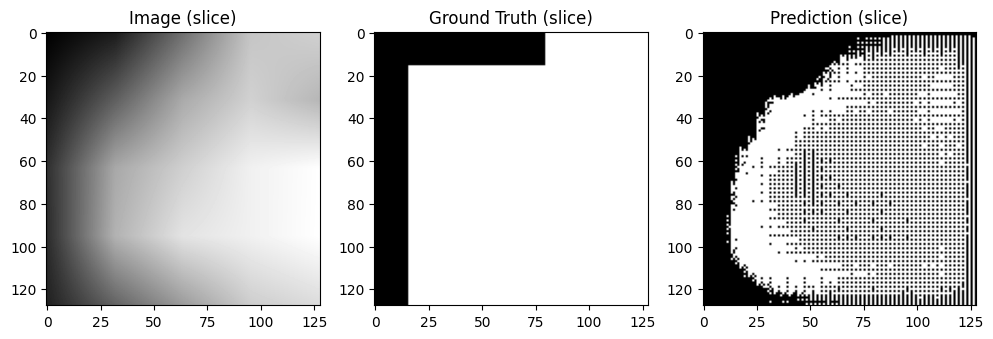

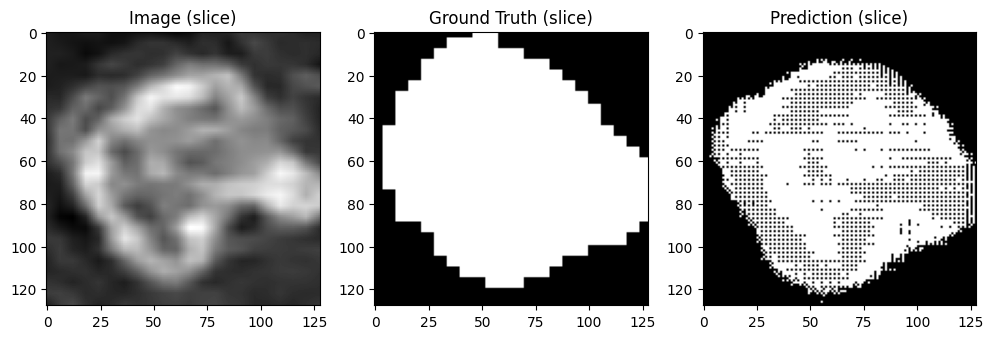

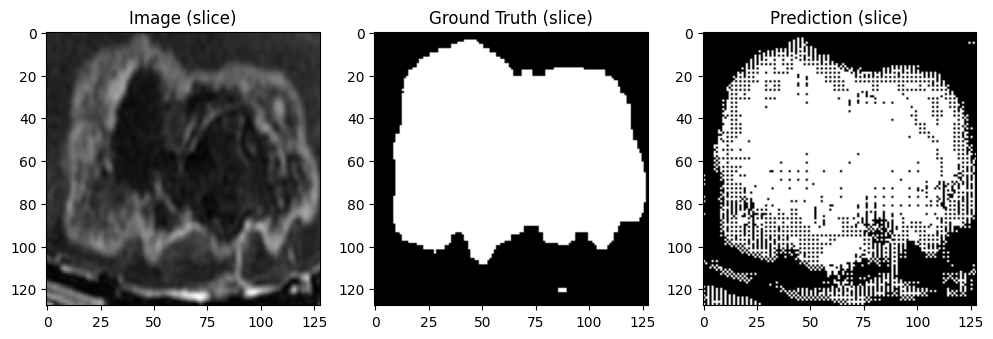

Validation Dice: 0.7692
Saved new best model!
Epoch 21/100


  0%|          | 0/7 [00:00<?, ?it/s]

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-105/label_nii_resampled/ReMIND-105-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-089/label_nii_resampled/ReMIND-089-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-014/label_nii_resampled/ReMIND-014-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-036/label_nii_resampled/ReMIND-036-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-061/label_nii_resampled/ReMIND-061-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-093/label_nii_resampled/ReMIND-093-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-0

 14%|█▍        | 1/7 [00:13<01:22, 13.80s/it]

training loss : 0.4972480833530426


 29%|██▊       | 2/7 [00:14<00:29,  5.92s/it]

training loss : 0.45575982332229614
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-082/label_nii_resampled/ReMIND-082-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-071/label_nii_resampled/ReMIND-071-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-022/label_nii_resampled/ReMIND-022-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-035/label_nii_resampled/ReMIND-035-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-110/label_nii_resampled/ReMIND-110-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-090/label_nii_resampled/ReMIND-090-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/driv

 43%|████▎     | 3/7 [00:20<00:23,  5.94s/it]

training loss : 0.4441128671169281
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-015/label_nii_resampled/ReMIND-015-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-008/label_nii_resampled/ReMIND-008-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


 57%|█████▋    | 4/7 [00:21<00:12,  4.23s/it]

training loss : 0.42949649691581726
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-050/label_nii_resampled/ReMIND-050-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-020/label_nii_resampled/ReMIND-020-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-025/label_nii_resampled/ReMIND-025-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-034/label_nii_resampled/ReMIND-034-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-043/label_nii_resampled/ReMIND-043-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


 71%|███████▏  | 5/7 [00:28<00:10,  5.29s/it]

training loss : 0.47507062554359436
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-068/label_nii_resampled/ReMIND-068-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-102/label_nii_resampled/ReMIND-102-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-109/label_nii_resampled/ReMIND-109-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-062/label_nii_resampled/ReMIND-062-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-059/label_nii_resampled/ReMIND-059-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-017/label_nii_resampled/ReMIND-017-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/driv

 86%|████████▌ | 6/7 [00:37<00:06,  6.38s/it]

training loss : 0.5087857842445374


100%|██████████| 7/7 [00:37<00:00,  5.41s/it]


training loss : 0.4811399281024933
Epoch 21 average loss: 0.4702
Epoch 22/100


  0%|          | 0/7 [00:00<?, ?it/s]

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-071/label_nii_resampled/ReMIND-071-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-082/label_nii_resampled/ReMIND-082-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-083/label_nii_resampled/ReMIND-083-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-089/label_nii_resampled/ReMIND-089-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-035/label_nii_resampled/ReMIND-035-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-074/label_nii_resampled/ReMIND-074-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-0

 14%|█▍        | 1/7 [00:11<01:10, 11.69s/it]

training loss : 0.41795629262924194
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-015/label_nii_resampled/ReMIND-015-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-022/label_nii_resampled/ReMIND-022-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-102/label_nii_resampled/ReMIND-102-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-034/label_nii_resampled/ReMIND-034-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-036/label_nii_resampled/ReMIND-036-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-020/label_nii_resampled/ReMIND-020-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


 29%|██▊       | 2/7 [00:18<00:42,  8.59s/it]

training loss : 0.4883607029914856
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-090/label_nii_resampled/ReMIND-090-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


 43%|████▎     | 3/7 [00:18<00:20,  5.03s/it]

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-073/label_nii_resampled/ReMIND-073-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
training loss : 0.4001932144165039
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-017/label_nii_resampled/ReMIND-017-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-013/label_nii_resampled/ReMIND-013-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-103/label_nii_resampled/ReMIND-103-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-045/label_nii_resampled/ReMIND-045-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-097/label_nii_resampled/ReMIND-097-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive

 57%|█████▋    | 4/7 [00:24<00:16,  5.36s/it]

training loss : 0.47403544187545776
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-064/label_nii_resampled/ReMIND-064-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-110/label_nii_resampled/ReMIND-110-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-025/label_nii_resampled/ReMIND-025-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-062/label_nii_resampled/ReMIND-062-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


 71%|███████▏  | 5/7 [00:30<00:10,  5.33s/it]

training loss : 0.4447140097618103
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-072/label_nii_resampled/ReMIND-072-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-037/label_nii_resampled/ReMIND-037-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-060/label_nii_resampled/ReMIND-060-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-081/label_nii_resampled/ReMIND-081-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-059/label_nii_resampled/ReMIND-059-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-093/label_nii_resampled/ReMIND-093-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive

 86%|████████▌ | 6/7 [00:36<00:05,  5.73s/it]

training loss : 0.4925897419452667
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-050/label_nii_resampled/ReMIND-050-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-031/label_nii_resampled/ReMIND-031-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


100%|██████████| 7/7 [00:39<00:00,  5.60s/it]

training loss : 0.5243279337882996
Epoch 22 average loss: 0.4632


Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-104/label_nii_resampled/ReMIND-104-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-016/label_nii_resampled/ReMIND-016-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-038/label_nii_resampled/ReMIND-038-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-113/label_nii_resampled/ReMIND-113-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-084/label_nii_resampled/ReMIND-084-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-029/label_nii_resampled/ReMIND-029-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-0

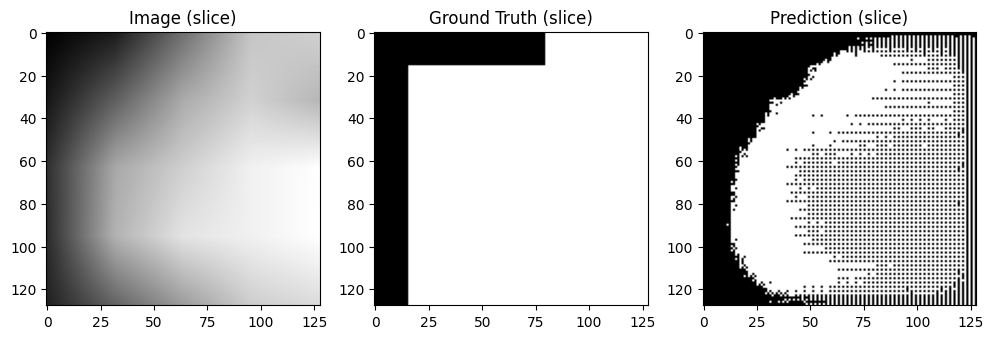

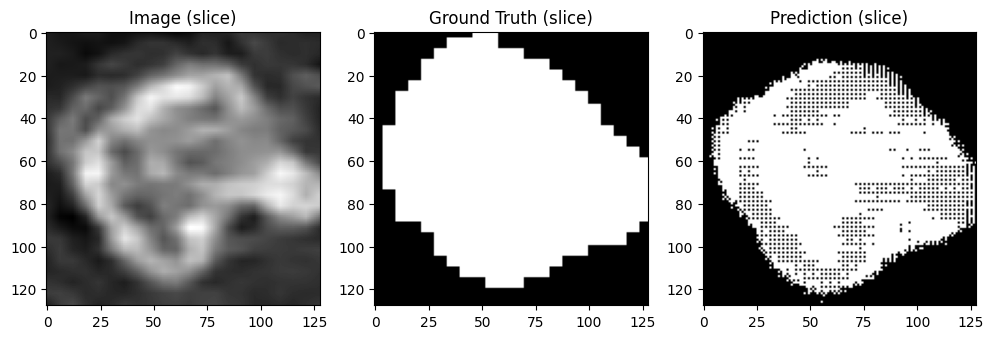

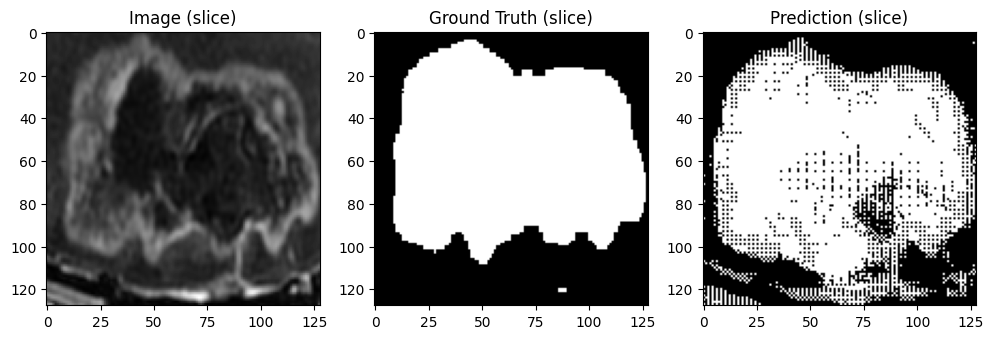

Validation Dice: 0.7856
Saved new best model!
Epoch 23/100


  0%|          | 0/7 [00:00<?, ?it/s]

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-081/label_nii_resampled/ReMIND-081-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-074/label_nii_resampled/ReMIND-074-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-089/label_nii_resampled/ReMIND-089-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-064/label_nii_resampled/ReMIND-064-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-109/label_nii_resampled/ReMIND-109-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gzMask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-072/label_nii_resampled/ReMIND-072-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-0

 14%|█▍        | 1/7 [00:15<01:34, 15.81s/it]

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-037/label_nii_resampled/ReMIND-037-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
training loss : 0.5166013240814209


 29%|██▊       | 2/7 [00:16<00:34,  6.93s/it]

training loss : 0.4383527338504791
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-022/label_nii_resampled/ReMIND-022-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gzMask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-030/label_nii_resampled/ReMIND-030-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-077/label_nii_resampled/ReMIND-077-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-007/label_nii_resampled/ReMIND-007-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-083/label_nii_resampled/ReMIND-083-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-025/label_nii_resampled/ReMIND-025-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive

 43%|████▎     | 3/7 [00:24<00:30,  7.60s/it]

training loss : 0.5310170650482178


 57%|█████▋    | 4/7 [00:25<00:14,  4.72s/it]

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-082/label_nii_resampled/ReMIND-082-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
training loss : 0.40504345297813416
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-105/label_nii_resampled/ReMIND-105-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-035/label_nii_resampled/ReMIND-035-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-093/label_nii_resampled/ReMIND-093-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-020/label_nii_resampled/ReMIND-020-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-102/label_nii_resampled/ReMIND-102-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


 71%|███████▏  | 5/7 [00:30<00:10,  5.02s/it]

training loss : 0.4184417724609375


 86%|████████▌ | 6/7 [00:31<00:03,  3.44s/it]

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-013/label_nii_resampled/ReMIND-013-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
training loss : 0.41270774602890015
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-071/label_nii_resampled/ReMIND-071-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-103/label_nii_resampled/ReMIND-103-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-060/label_nii_resampled/ReMIND-060-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-045/label_nii_resampled/ReMIND-045-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


100%|██████████| 7/7 [00:39<00:00,  5.66s/it]

training loss : 0.48217374086380005


Epoch 23 average loss: 0.4578
Epoch 24/100


  0%|          | 0/7 [00:00<?, ?it/s]

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-109/label_nii_resampled/ReMIND-109-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-022/label_nii_resampled/ReMIND-022-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-083/label_nii_resampled/ReMIND-083-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-102/label_nii_resampled/ReMIND-102-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-072/label_nii_resampled/ReMIND-072-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-105/label_nii_resampled/ReMIND-105-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-0

 14%|█▍        | 1/7 [00:09<00:58,  9.71s/it]

training loss : 0.5227856040000916


 29%|██▊       | 2/7 [00:10<00:21,  4.32s/it]

training loss : 0.4047481417655945
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-081/label_nii_resampled/ReMIND-081-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-050/label_nii_resampled/ReMIND-050-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-013/label_nii_resampled/ReMIND-013-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-017/label_nii_resampled/ReMIND-017-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-082/label_nii_resampled/ReMIND-082-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-059/label_nii_resampled/ReMIND-059-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive

 43%|████▎     | 3/7 [00:19<00:25,  6.47s/it]

training loss : 0.4763314723968506


 57%|█████▋    | 4/7 [00:19<00:12,  4.18s/it]

training loss : 0.4544001817703247
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-037/label_nii_resampled/ReMIND-037-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-077/label_nii_resampled/ReMIND-077-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-073/label_nii_resampled/ReMIND-073-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-064/label_nii_resampled/ReMIND-064-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-061/label_nii_resampled/ReMIND-061-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-089/label_nii_resampled/ReMIND-089-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive

 71%|███████▏  | 5/7 [00:29<00:12,  6.24s/it]

training loss : 0.4786624014377594


 86%|████████▌ | 6/7 [00:30<00:04,  4.23s/it]

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-031/label_nii_resampled/ReMIND-031-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
training loss : 0.39298486709594727
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-020/label_nii_resampled/ReMIND-020-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-008/label_nii_resampled/ReMIND-008-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-014/label_nii_resampled/ReMIND-014-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-007/label_nii_resampled/ReMIND-007-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


100%|██████████| 7/7 [00:39<00:00,  5.68s/it]

training loss : 0.4191267192363739
Epoch 24 average loss: 0.4499


Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-104/label_nii_resampled/ReMIND-104-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-016/label_nii_resampled/ReMIND-016-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-038/label_nii_resampled/ReMIND-038-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-113/label_nii_resampled/ReMIND-113-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-084/label_nii_resampled/ReMIND-084-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-029/label_nii_resampled/ReMIND-029-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-0

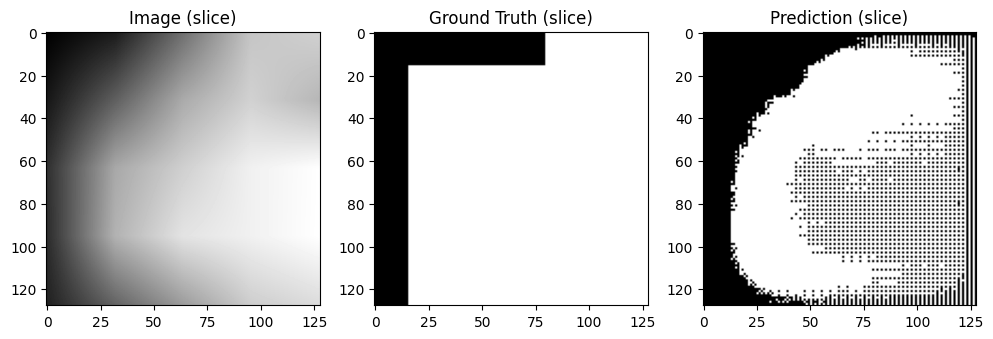

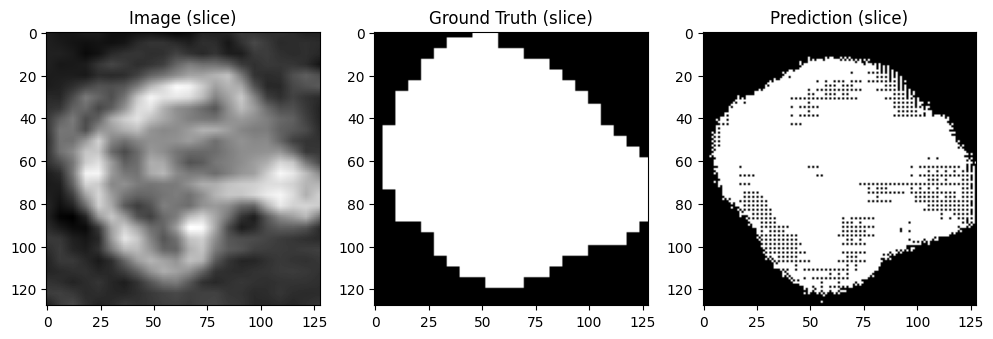

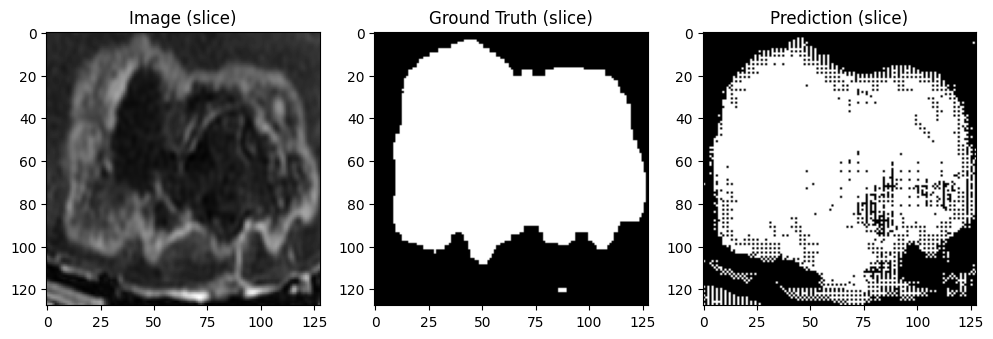

Validation Dice: 0.7928
Saved new best model!
Epoch 25/100


  0%|          | 0/7 [00:00<?, ?it/s]

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-109/label_nii_resampled/ReMIND-109-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-077/label_nii_resampled/ReMIND-077-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-008/label_nii_resampled/ReMIND-008-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-110/label_nii_resampled/ReMIND-110-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-103/label_nii_resampled/ReMIND-103-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-037/label_nii_resampled/ReMIND-037-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-0

 14%|█▍        | 1/7 [00:15<01:33, 15.59s/it]

training loss : 0.41893288493156433
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-083/label_nii_resampled/ReMIND-083-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-081/label_nii_resampled/ReMIND-081-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-063/label_nii_resampled/ReMIND-063-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-071/label_nii_resampled/ReMIND-071-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-082/label_nii_resampled/ReMIND-082-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-090/label_nii_resampled/ReMIND-090-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/driv

 29%|██▊       | 2/7 [00:24<00:57, 11.59s/it]

training loss : 0.5026603937149048


 43%|████▎     | 3/7 [00:25<00:26,  6.59s/it]

training loss : 0.471283882856369
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-068/label_nii_resampled/ReMIND-068-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-062/label_nii_resampled/ReMIND-062-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-061/label_nii_resampled/ReMIND-061-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-013/label_nii_resampled/ReMIND-013-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-015/label_nii_resampled/ReMIND-015-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-074/label_nii_resampled/ReMIND-074-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/

 57%|█████▋    | 4/7 [00:34<00:23,  7.82s/it]

training loss : 0.40367943048477173


 71%|███████▏  | 5/7 [00:35<00:10,  5.26s/it]

training loss : 0.4390523433685303
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-030/label_nii_resampled/ReMIND-030-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-020/label_nii_resampled/ReMIND-020-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-017/label_nii_resampled/ReMIND-017-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-025/label_nii_resampled/ReMIND-025-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-043/label_nii_resampled/ReMIND-043-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-072/label_nii_resampled/ReMIND-072-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive

 86%|████████▌ | 6/7 [00:43<00:06,  6.31s/it]

training loss : 0.48373377323150635


100%|██████████| 7/7 [00:44<00:00,  6.32s/it]


training loss : 0.3923289179801941
Epoch 25 average loss: 0.4445
Epoch 26/100


  0%|          | 0/7 [00:00<?, ?it/s]

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-089/label_nii_resampled/ReMIND-089-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-015/label_nii_resampled/ReMIND-015-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-025/label_nii_resampled/ReMIND-025-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-034/label_nii_resampled/ReMIND-034-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-030/label_nii_resampled/ReMIND-030-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-020/label_nii_resampled/ReMIND-020-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-0

 14%|█▍        | 1/7 [00:09<00:58,  9.79s/it]

training loss : 0.3889860212802887


 29%|██▊       | 2/7 [00:10<00:22,  4.42s/it]

training loss : 0.46159669756889343
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-073/label_nii_resampled/ReMIND-073-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-074/label_nii_resampled/ReMIND-074-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-082/label_nii_resampled/ReMIND-082-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-102/label_nii_resampled/ReMIND-102-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-007/label_nii_resampled/ReMIND-007-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-059/label_nii_resampled/ReMIND-059-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/driv

 43%|████▎     | 3/7 [00:25<00:36,  9.23s/it]

training loss : 0.5046095848083496


 57%|█████▋    | 4/7 [00:26<00:17,  5.85s/it]

training loss : 0.3893890976905823
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-037/label_nii_resampled/ReMIND-037-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-083/label_nii_resampled/ReMIND-083-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-061/label_nii_resampled/ReMIND-061-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-008/label_nii_resampled/ReMIND-008-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-072/label_nii_resampled/ReMIND-072-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-103/label_nii_resampled/ReMIND-103-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive

 71%|███████▏  | 5/7 [00:37<00:15,  7.88s/it]

training loss : 0.3772149384021759
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-109/label_nii_resampled/ReMIND-109-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


 86%|████████▌ | 6/7 [00:41<00:06,  6.57s/it]

training loss : 0.4622246026992798
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-017/label_nii_resampled/ReMIND-017-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-077/label_nii_resampled/ReMIND-077-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-110/label_nii_resampled/ReMIND-110-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-064/label_nii_resampled/ReMIND-064-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


100%|██████████| 7/7 [00:46<00:00,  6.63s/it]

training loss : 0.501164436340332
Epoch 26 average loss: 0.4407


Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-104/label_nii_resampled/ReMIND-104-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-016/label_nii_resampled/ReMIND-016-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-038/label_nii_resampled/ReMIND-038-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-113/label_nii_resampled/ReMIND-113-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-084/label_nii_resampled/ReMIND-084-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-029/label_nii_resampled/ReMIND-029-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-0

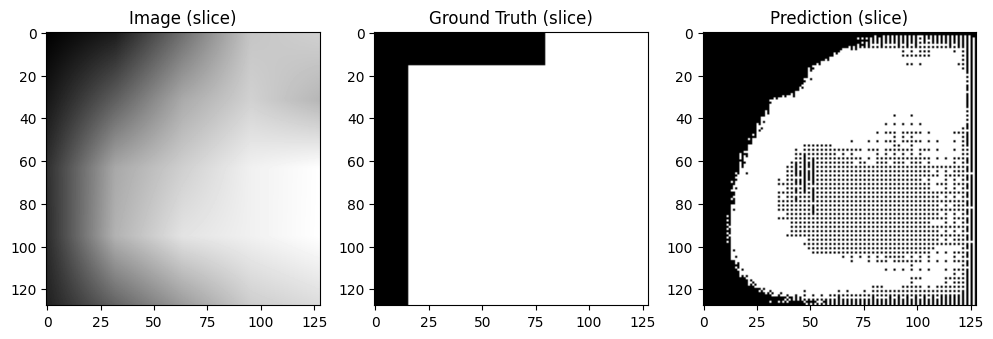

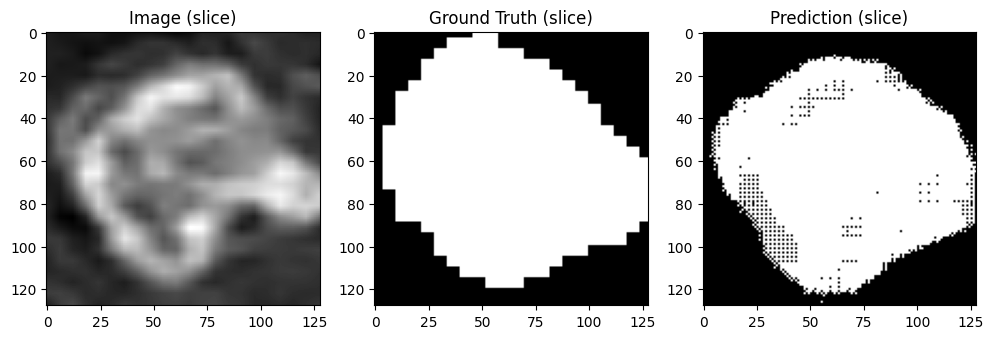

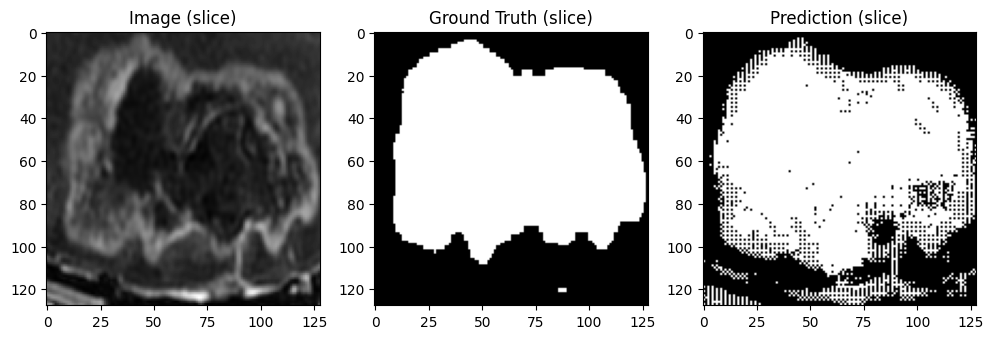

Validation Dice: 0.7903
Epoch 27/100


  0%|          | 0/7 [00:00<?, ?it/s]

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-093/label_nii_resampled/ReMIND-093-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-073/label_nii_resampled/ReMIND-073-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-082/label_nii_resampled/ReMIND-082-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-045/label_nii_resampled/ReMIND-045-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-083/label_nii_resampled/ReMIND-083-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-077/label_nii_resampled/ReMIND-077-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-0

 14%|█▍        | 1/7 [00:17<01:46, 17.83s/it]

training loss : 0.42224612832069397


 29%|██▊       | 2/7 [00:18<00:38,  7.73s/it]

training loss : 0.4853646159172058
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-064/label_nii_resampled/ReMIND-064-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-030/label_nii_resampled/ReMIND-030-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-022/label_nii_resampled/ReMIND-022-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-015/label_nii_resampled/ReMIND-015-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-013/label_nii_resampled/ReMIND-013-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-063/label_nii_resampled/ReMIND-063-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive

 43%|████▎     | 3/7 [00:25<00:30,  7.62s/it]

training loss : 0.4429360330104828


 57%|█████▋    | 4/7 [00:26<00:14,  4.85s/it]

training loss : 0.3996772766113281
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-074/label_nii_resampled/ReMIND-074-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-102/label_nii_resampled/ReMIND-102-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-008/label_nii_resampled/ReMIND-008-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-031/label_nii_resampled/ReMIND-031-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-061/label_nii_resampled/ReMIND-061-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-050/label_nii_resampled/ReMIND-050-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive

 71%|███████▏  | 5/7 [00:38<00:15,  7.53s/it]

training loss : 0.40656620264053345
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-007/label_nii_resampled/ReMIND-007-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-090/label_nii_resampled/ReMIND-090-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-062/label_nii_resampled/ReMIND-062-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-081/label_nii_resampled/ReMIND-081-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


 86%|████████▌ | 6/7 [00:42<00:06,  6.33s/it]

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-105/label_nii_resampled/ReMIND-105-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
training loss : 0.4666558802127838
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-110/label_nii_resampled/ReMIND-110-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


100%|██████████| 7/7 [00:44<00:00,  6.41s/it]


training loss : 0.41045621037483215
Epoch 27 average loss: 0.4334
Epoch 28/100


  0%|          | 0/7 [00:00<?, ?it/s]

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-081/label_nii_resampled/ReMIND-081-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-097/label_nii_resampled/ReMIND-097-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-090/label_nii_resampled/ReMIND-090-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gzMask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-015/label_nii_resampled/ReMIND-015-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-071/label_nii_resampled/ReMIND-071-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-102/label_nii_resampled/ReMIND-102-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-0

 14%|█▍        | 1/7 [00:10<01:02, 10.38s/it]

training loss : 0.45676323771476746
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-036/label_nii_resampled/ReMIND-036-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-072/label_nii_resampled/ReMIND-072-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-013/label_nii_resampled/ReMIND-013-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


 29%|██▊       | 2/7 [00:13<00:29,  5.98s/it]

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-059/label_nii_resampled/ReMIND-059-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
training loss : 0.39678755402565
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-031/label_nii_resampled/ReMIND-031-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-063/label_nii_resampled/ReMIND-063-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-017/label_nii_resampled/ReMIND-017-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-077/label_nii_resampled/ReMIND-077-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-105/label_nii_resampled/ReMIND-105-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/M

 43%|████▎     | 3/7 [00:20<00:26,  6.60s/it]

training loss : 0.4480469822883606
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-074/label_nii_resampled/ReMIND-074-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-062/label_nii_resampled/ReMIND-062-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-093/label_nii_resampled/ReMIND-093-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


 57%|█████▋    | 4/7 [00:23<00:14,  4.98s/it]

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-045/label_nii_resampled/ReMIND-045-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
training loss : 0.43907430768013
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-020/label_nii_resampled/ReMIND-020-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-110/label_nii_resampled/ReMIND-110-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-022/label_nii_resampled/ReMIND-022-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-014/label_nii_resampled/ReMIND-014-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-109/label_nii_resampled/ReMIND-109-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


 71%|███████▏  | 5/7 [00:28<00:10,  5.15s/it]

training loss : 0.43222007155418396
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-103/label_nii_resampled/ReMIND-103-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-030/label_nii_resampled/ReMIND-030-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-035/label_nii_resampled/ReMIND-035-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-025/label_nii_resampled/ReMIND-025-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-061/label_nii_resampled/ReMIND-061-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-008/label_nii_resampled/ReMIND-008-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/driv

 86%|████████▌ | 6/7 [00:45<00:09,  9.02s/it]

training loss : 0.41912412643432617


100%|██████████| 7/7 [00:45<00:00,  6.51s/it]

training loss : 0.4065585136413574


Epoch 28 average loss: 0.4284
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-104/label_nii_resampled/ReMIND-104-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-016/label_nii_resampled/ReMIND-016-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-038/label_nii_resampled/ReMIND-038-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-113/label_nii_resampled/ReMIND-113-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-084/label_nii_resampled/ReMIND-084-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-029/label_nii_resampled/ReMIND-029-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My D

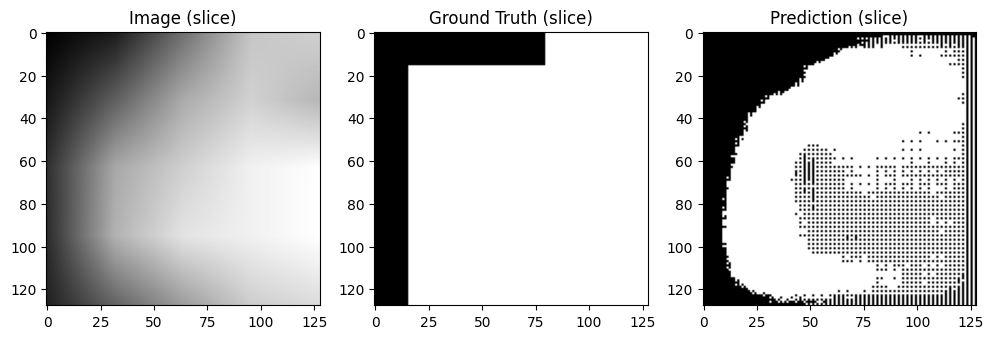

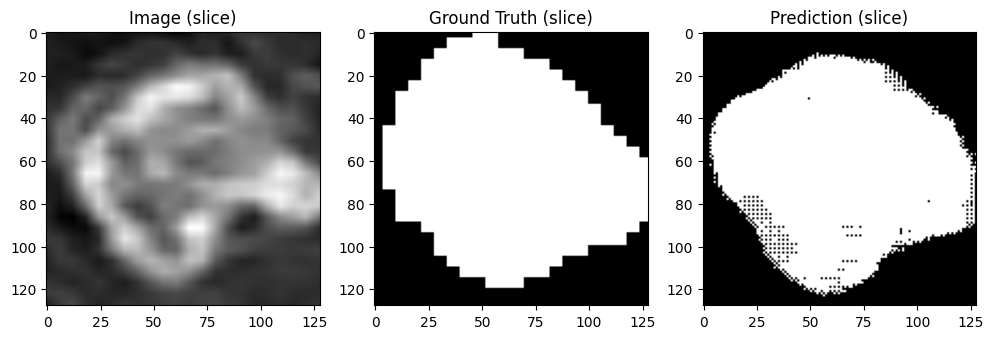

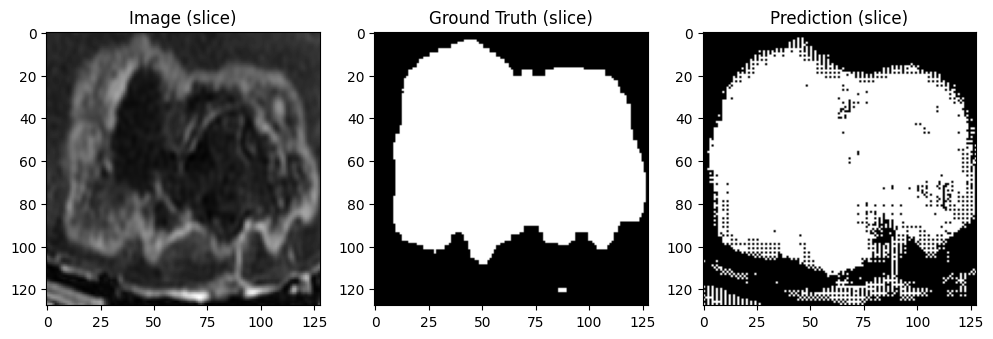

Validation Dice: 0.7936
Saved new best model!
Epoch 29/100


  0%|          | 0/7 [00:00<?, ?it/s]

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-072/label_nii_resampled/ReMIND-072-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-068/label_nii_resampled/ReMIND-068-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-097/label_nii_resampled/ReMIND-097-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-007/label_nii_resampled/ReMIND-007-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-063/label_nii_resampled/ReMIND-063-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-037/label_nii_resampled/ReMIND-037-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-0

 14%|█▍        | 1/7 [00:12<01:17, 12.97s/it]

training loss : 0.40178579092025757


 29%|██▊       | 2/7 [00:13<00:28,  5.66s/it]

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-035/label_nii_resampled/ReMIND-035-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
training loss : 0.4517273008823395
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-071/label_nii_resampled/ReMIND-071-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-109/label_nii_resampled/ReMIND-109-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-083/label_nii_resampled/ReMIND-083-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-093/label_nii_resampled/ReMIND-093-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-008/label_nii_resampled/ReMIND-008-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive

 43%|████▎     | 3/7 [00:31<00:44, 11.16s/it]

training loss : 0.44970980286598206


 57%|█████▋    | 4/7 [00:31<00:20,  6.92s/it]

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-077/label_nii_resampled/ReMIND-077-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
training loss : 0.4008093774318695
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-014/label_nii_resampled/ReMIND-014-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-022/label_nii_resampled/ReMIND-022-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-059/label_nii_resampled/ReMIND-059-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-013/label_nii_resampled/ReMIND-013-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-073/label_nii_resampled/ReMIND-073-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


 71%|███████▏  | 5/7 [00:35<00:11,  5.73s/it]

training loss : 0.4474477767944336


 86%|████████▌ | 6/7 [00:35<00:03,  3.91s/it]

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-074/label_nii_resampled/ReMIND-074-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
training loss : 0.42034459114074707
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-020/label_nii_resampled/ReMIND-020-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-015/label_nii_resampled/ReMIND-015-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-110/label_nii_resampled/ReMIND-110-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-031/label_nii_resampled/ReMIND-031-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


100%|██████████| 7/7 [00:39<00:00,  5.69s/it]

training loss : 0.39679956436157227


Epoch 29 average loss: 0.4241
Epoch 30/100


  0%|          | 0/7 [00:00<?, ?it/s]

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-014/label_nii_resampled/ReMIND-014-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-031/label_nii_resampled/ReMIND-031-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-025/label_nii_resampled/ReMIND-025-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-089/label_nii_resampled/ReMIND-089-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-030/label_nii_resampled/ReMIND-030-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-034/label_nii_resampled/ReMIND-034-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-0

 14%|█▍        | 1/7 [00:10<01:05, 10.93s/it]

training loss : 0.3552747368812561


 29%|██▊       | 2/7 [00:11<00:23,  4.79s/it]

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-071/label_nii_resampled/ReMIND-071-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
training loss : 0.47311314940452576
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-007/label_nii_resampled/ReMIND-007-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-097/label_nii_resampled/ReMIND-097-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-060/label_nii_resampled/ReMIND-060-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-008/label_nii_resampled/ReMIND-008-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-064/label_nii_resampled/ReMIND-064-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/driv

 43%|████▎     | 3/7 [00:17<00:21,  5.43s/it]

training loss : 0.44580546021461487
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-103/label_nii_resampled/ReMIND-103-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-013/label_nii_resampled/ReMIND-013-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-036/label_nii_resampled/ReMIND-036-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-022/label_nii_resampled/ReMIND-022-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-105/label_nii_resampled/ReMIND-105-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-020/label_nii_resampled/ReMIND-020-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/driv

 57%|█████▋    | 4/7 [00:29<00:23,  7.92s/it]

training loss : 0.386475145816803


 71%|███████▏  | 5/7 [00:30<00:10,  5.30s/it]

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-090/label_nii_resampled/ReMIND-090-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
training loss : 0.3934256136417389
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-077/label_nii_resampled/ReMIND-077-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-043/label_nii_resampled/ReMIND-043-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-109/label_nii_resampled/ReMIND-109-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-068/label_nii_resampled/ReMIND-068-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-072/label_nii_resampled/ReMIND-072-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive

 86%|████████▌ | 6/7 [00:38<00:06,  6.31s/it]

training loss : 0.4257383942604065


100%|██████████| 7/7 [00:39<00:00,  5.57s/it]

training loss : 0.4813818037509918
Epoch 30 average loss: 0.4230


Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-104/label_nii_resampled/ReMIND-104-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-016/label_nii_resampled/ReMIND-016-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-038/label_nii_resampled/ReMIND-038-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-113/label_nii_resampled/ReMIND-113-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-084/label_nii_resampled/ReMIND-084-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-029/label_nii_resampled/ReMIND-029-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-0

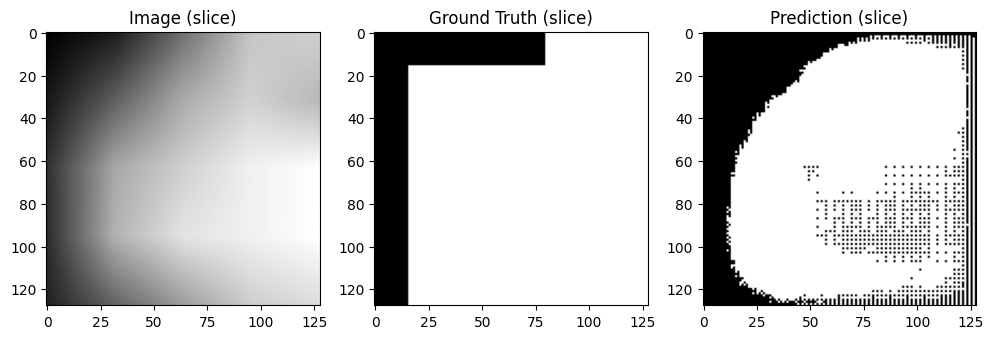

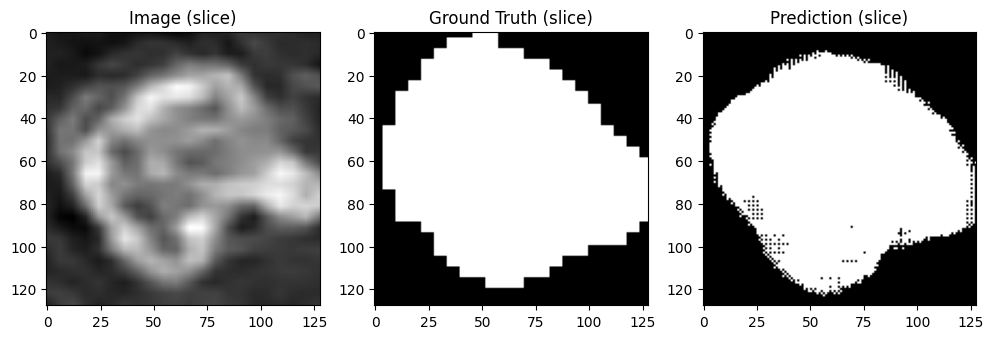

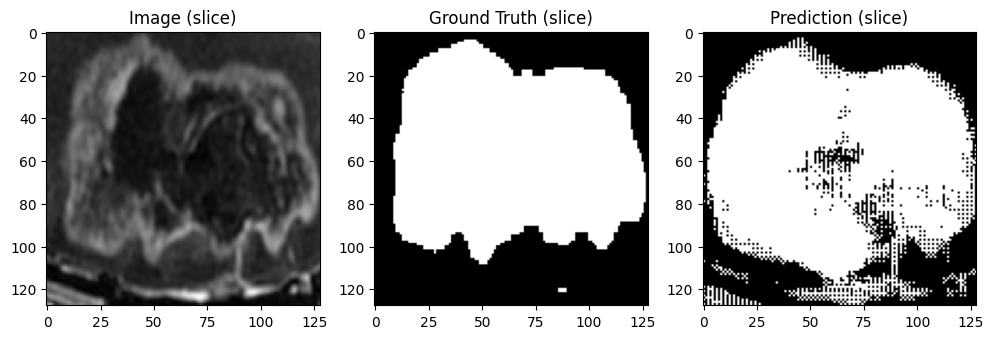

Validation Dice: 0.8108
Saved new best model!
Epoch 31/100


  0%|          | 0/7 [00:00<?, ?it/s]

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-014/label_nii_resampled/ReMIND-014-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-083/label_nii_resampled/ReMIND-083-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-020/label_nii_resampled/ReMIND-020-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-036/label_nii_resampled/ReMIND-036-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-077/label_nii_resampled/ReMIND-077-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-008/label_nii_resampled/ReMIND-008-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-0

 14%|█▍        | 1/7 [00:07<00:43,  7.28s/it]

training loss : 0.41026002168655396
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-072/label_nii_resampled/ReMIND-072-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-073/label_nii_resampled/ReMIND-073-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-090/label_nii_resampled/ReMIND-090-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-025/label_nii_resampled/ReMIND-025-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-060/label_nii_resampled/ReMIND-060-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-093/label_nii_resampled/ReMIND-093-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/driv

 29%|██▊       | 2/7 [00:21<00:57, 11.60s/it]

training loss : 0.42965763807296753


 43%|████▎     | 3/7 [00:22<00:26,  6.57s/it]

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-007/label_nii_resampled/ReMIND-007-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
training loss : 0.48553574085235596
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-074/label_nii_resampled/ReMIND-074-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-071/label_nii_resampled/ReMIND-071-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-043/label_nii_resampled/ReMIND-043-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-022/label_nii_resampled/ReMIND-022-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-064/label_nii_resampled/ReMIND-064-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/driv

 57%|█████▋    | 4/7 [00:31<00:22,  7.35s/it]

training loss : 0.4240153431892395


 71%|███████▏  | 5/7 [00:31<00:09,  4.82s/it]

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-103/label_nii_resampled/ReMIND-103-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
training loss : 0.35698384046554565
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-059/label_nii_resampled/ReMIND-059-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-062/label_nii_resampled/ReMIND-062-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-109/label_nii_resampled/ReMIND-109-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-061/label_nii_resampled/ReMIND-061-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


 86%|████████▌ | 6/7 [00:39<00:05,  5.95s/it]

training loss : 0.38691526651382446


100%|██████████| 7/7 [00:39<00:00,  5.70s/it]

training loss : 0.4420722424983978
Epoch 31 average loss: 0.4193


Epoch 32/100


  0%|          | 0/7 [00:00<?, ?it/s]

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-074/label_nii_resampled/ReMIND-074-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-025/label_nii_resampled/ReMIND-025-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-093/label_nii_resampled/ReMIND-093-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-097/label_nii_resampled/ReMIND-097-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-083/label_nii_resampled/ReMIND-083-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-007/label_nii_resampled/ReMIND-007-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-1

 14%|█▍        | 1/7 [00:07<00:46,  7.80s/it]

training loss : 0.37391796708106995
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-035/label_nii_resampled/ReMIND-035-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-102/label_nii_resampled/ReMIND-102-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-061/label_nii_resampled/ReMIND-061-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-109/label_nii_resampled/ReMIND-109-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-062/label_nii_resampled/ReMIND-062-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


 29%|██▊       | 2/7 [00:11<00:26,  5.21s/it]

training loss : 0.3878777027130127
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-030/label_nii_resampled/ReMIND-030-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-064/label_nii_resampled/ReMIND-064-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-008/label_nii_resampled/ReMIND-008-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-014/label_nii_resampled/ReMIND-014-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-060/label_nii_resampled/ReMIND-060-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-089/label_nii_resampled/ReMIND-089-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


 43%|████▎     | 3/7 [00:18<00:25,  6.35s/it]

training loss : 0.5079424977302551
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-017/label_nii_resampled/ReMIND-017-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-082/label_nii_resampled/ReMIND-082-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-034/label_nii_resampled/ReMIND-034-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-071/label_nii_resampled/ReMIND-071-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-015/label_nii_resampled/ReMIND-015-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-031/label_nii_resampled/ReMIND-031-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive

 57%|█████▋    | 4/7 [00:28<00:22,  7.60s/it]

training loss : 0.45948076248168945


 71%|███████▏  | 5/7 [00:28<00:10,  5.03s/it]

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-103/label_nii_resampled/ReMIND-103-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
training loss : 0.3812556266784668
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-050/label_nii_resampled/ReMIND-050-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-020/label_nii_resampled/ReMIND-020-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-068/label_nii_resampled/ReMIND-068-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-077/label_nii_resampled/ReMIND-077-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-036/label_nii_resampled/ReMIND-036-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive

 86%|████████▌ | 6/7 [00:36<00:05,  5.74s/it]

training loss : 0.4340643584728241
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-081/label_nii_resampled/ReMIND-081-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


100%|██████████| 7/7 [00:37<00:00,  5.41s/it]

training loss : 0.36321917176246643


Epoch 32 average loss: 0.4154
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-104/label_nii_resampled/ReMIND-104-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-016/label_nii_resampled/ReMIND-016-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-038/label_nii_resampled/ReMIND-038-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-113/label_nii_resampled/ReMIND-113-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-084/label_nii_resampled/ReMIND-084-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-029/label_nii_resampled/ReMIND-029-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My D

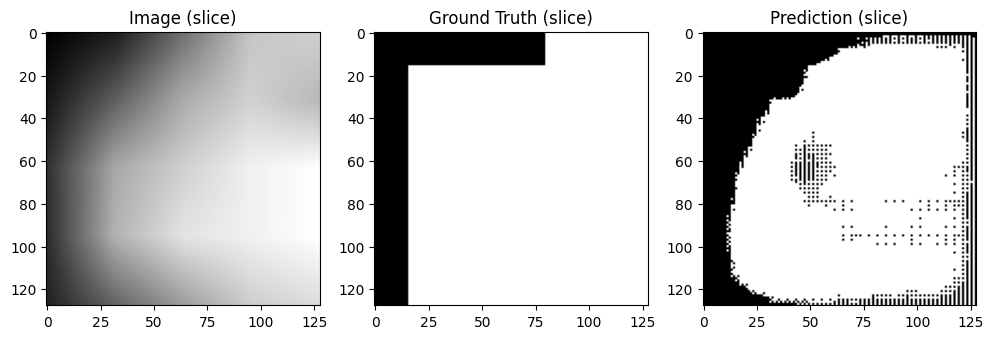

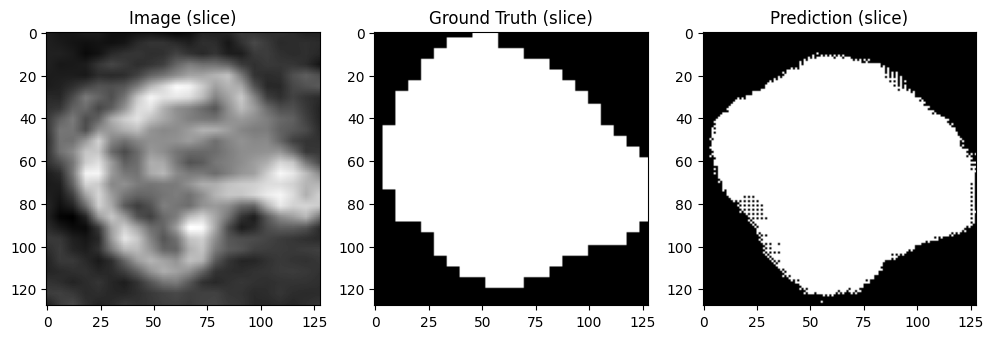

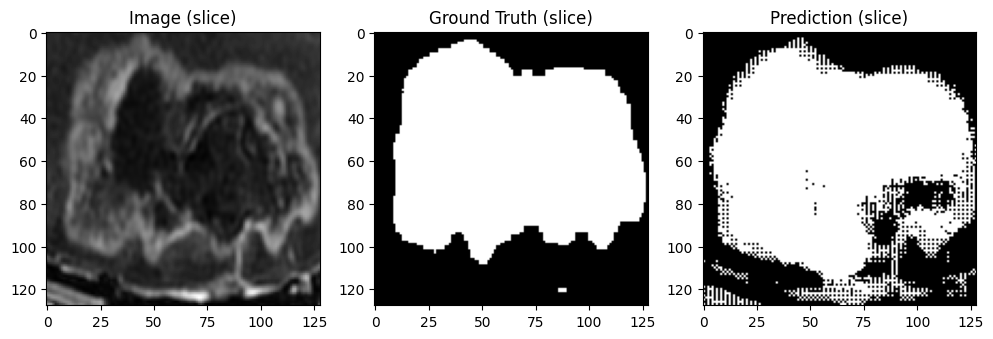

Validation Dice: 0.8045
Epoch 33/100


  0%|          | 0/7 [00:00<?, ?it/s]

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-008/label_nii_resampled/ReMIND-008-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gzMask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-031/label_nii_resampled/ReMIND-031-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-015/label_nii_resampled/ReMIND-015-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-037/label_nii_resampled/ReMIND-037-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-074/label_nii_resampled/ReMIND-074-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-014/label_nii_resampled/ReMIND-014-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-1

 14%|█▍        | 1/7 [00:16<01:41, 16.98s/it]

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-093/label_nii_resampled/ReMIND-093-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
training loss : 0.44145667552948


 29%|██▊       | 2/7 [00:17<00:36,  7.30s/it]

training loss : 0.36742857098579407
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-090/label_nii_resampled/ReMIND-090-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-073/label_nii_resampled/ReMIND-073-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-060/label_nii_resampled/ReMIND-060-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-068/label_nii_resampled/ReMIND-068-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-045/label_nii_resampled/ReMIND-045-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-071/label_nii_resampled/ReMIND-071-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/driv

 43%|████▎     | 3/7 [00:27<00:34,  8.51s/it]

training loss : 0.5273759961128235


 57%|█████▋    | 4/7 [00:28<00:16,  5.41s/it]

training loss : 0.4286414682865143
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-035/label_nii_resampled/ReMIND-035-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-034/label_nii_resampled/ReMIND-034-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-013/label_nii_resampled/ReMIND-013-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-064/label_nii_resampled/ReMIND-064-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-017/label_nii_resampled/ReMIND-017-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-030/label_nii_resampled/ReMIND-030-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive

 71%|███████▏  | 5/7 [00:34<00:11,  5.85s/it]

training loss : 0.35587844252586365


 86%|████████▌ | 6/7 [00:35<00:03,  3.99s/it]

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-103/label_nii_resampled/ReMIND-103-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
training loss : 0.4102870523929596
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-077/label_nii_resampled/ReMIND-077-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-061/label_nii_resampled/ReMIND-061-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-102/label_nii_resampled/ReMIND-102-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-036/label_nii_resampled/ReMIND-036-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


100%|██████████| 7/7 [00:40<00:00,  5.76s/it]


training loss : 0.36306512355804443
Epoch 33 average loss: 0.4134
Epoch 34/100


  0%|          | 0/7 [00:00<?, ?it/s]

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-082/label_nii_resampled/ReMIND-082-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-022/label_nii_resampled/ReMIND-022-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-059/label_nii_resampled/ReMIND-059-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-017/label_nii_resampled/ReMIND-017-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-045/label_nii_resampled/ReMIND-045-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-013/label_nii_resampled/ReMIND-013-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-0

 14%|█▍        | 1/7 [00:14<01:27, 14.53s/it]

training loss : 0.4191981554031372


 29%|██▊       | 2/7 [00:15<00:31,  6.34s/it]

training loss : 0.368062287569046
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-071/label_nii_resampled/ReMIND-071-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gzMask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-036/label_nii_resampled/ReMIND-036-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-068/label_nii_resampled/ReMIND-068-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-089/label_nii_resampled/ReMIND-089-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-031/label_nii_resampled/ReMIND-031-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-109/label_nii_resampled/ReMIND-109-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/

 43%|████▎     | 3/7 [00:26<00:34,  8.54s/it]

training loss : 0.39535027742385864


 57%|█████▋    | 4/7 [00:26<00:16,  5.36s/it]

training loss : 0.38037076592445374
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-062/label_nii_resampled/ReMIND-062-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-030/label_nii_resampled/ReMIND-030-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-060/label_nii_resampled/ReMIND-060-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-015/label_nii_resampled/ReMIND-015-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-008/label_nii_resampled/ReMIND-008-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-110/label_nii_resampled/ReMIND-110-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


 71%|███████▏  | 5/7 [00:36<00:14,  7.06s/it]

training loss : 0.49544060230255127


 86%|████████▌ | 6/7 [00:37<00:04,  4.79s/it]

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-097/label_nii_resampled/ReMIND-097-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
training loss : 0.3511095941066742
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-083/label_nii_resampled/ReMIND-083-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-043/label_nii_resampled/ReMIND-043-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-061/label_nii_resampled/ReMIND-061-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-064/label_nii_resampled/ReMIND-064-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


100%|██████████| 7/7 [00:40<00:00,  5.85s/it]

training loss : 0.4281884431838989
Epoch 34 average loss: 0.4054


Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-104/label_nii_resampled/ReMIND-104-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gzMask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-016/label_nii_resampled/ReMIND-016-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-038/label_nii_resampled/ReMIND-038-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-113/label_nii_resampled/ReMIND-113-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-084/label_nii_resampled/ReMIND-084-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-029/label_nii_resampled/ReMIND-029-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-0

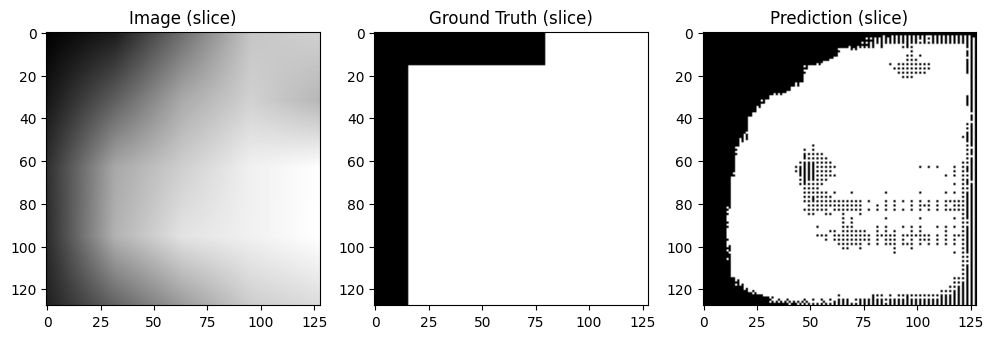

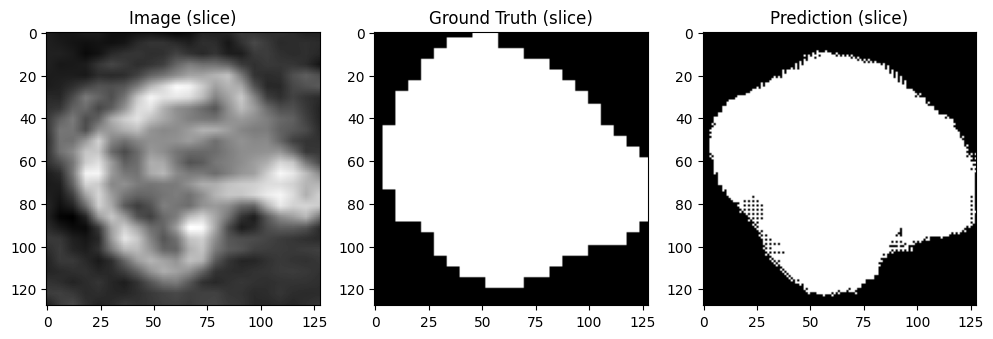

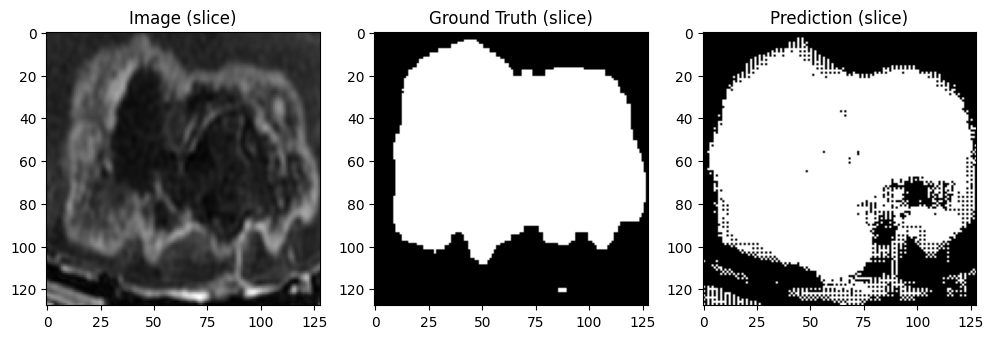

Validation Dice: 0.8037
Epoch 35/100


  0%|          | 0/7 [00:00<?, ?it/s]

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-022/label_nii_resampled/ReMIND-022-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-102/label_nii_resampled/ReMIND-102-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-090/label_nii_resampled/ReMIND-090-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-036/label_nii_resampled/ReMIND-036-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-031/label_nii_resampled/ReMIND-031-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-110/label_nii_resampled/ReMIND-110-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-0

 14%|█▍        | 1/7 [00:07<00:46,  7.70s/it]

training loss : 0.4222002625465393


 29%|██▊       | 2/7 [00:08<00:17,  3.51s/it]

training loss : 0.3737541437149048
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-061/label_nii_resampled/ReMIND-061-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-105/label_nii_resampled/ReMIND-105-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-083/label_nii_resampled/ReMIND-083-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-015/label_nii_resampled/ReMIND-015-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-007/label_nii_resampled/ReMIND-007-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-014/label_nii_resampled/ReMIND-014-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive

 43%|████▎     | 3/7 [00:17<00:24,  6.17s/it]

training loss : 0.402612566947937
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-030/label_nii_resampled/ReMIND-030-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


 57%|█████▋    | 4/7 [00:21<00:15,  5.20s/it]

training loss : 0.3716336488723755
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-059/label_nii_resampled/ReMIND-059-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-050/label_nii_resampled/ReMIND-050-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-072/label_nii_resampled/ReMIND-072-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-008/label_nii_resampled/ReMIND-008-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-077/label_nii_resampled/ReMIND-077-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-109/label_nii_resampled/ReMIND-109-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive

 71%|███████▏  | 5/7 [00:32<00:14,  7.44s/it]

training loss : 0.4141106605529785


 86%|████████▌ | 6/7 [00:33<00:05,  5.09s/it]

training loss : 0.4057585895061493
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-073/label_nii_resampled/ReMIND-073-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-034/label_nii_resampled/ReMIND-034-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-062/label_nii_resampled/ReMIND-062-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-068/label_nii_resampled/ReMIND-068-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-071/label_nii_resampled/ReMIND-071-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


100%|██████████| 7/7 [00:40<00:00,  5.75s/it]

training loss : 0.4069613218307495


Epoch 35 average loss: 0.3996
Epoch 36/100


  0%|          | 0/7 [00:00<?, ?it/s]

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-022/label_nii_resampled/ReMIND-022-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-072/label_nii_resampled/ReMIND-072-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-061/label_nii_resampled/ReMIND-061-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-043/label_nii_resampled/ReMIND-043-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-082/label_nii_resampled/ReMIND-082-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-034/label_nii_resampled/ReMIND-034-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-0

 14%|█▍        | 1/7 [00:07<00:47,  7.97s/it]

training loss : 0.44615334272384644


 29%|██▊       | 2/7 [00:08<00:18,  3.62s/it]

training loss : 0.3979165554046631
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-013/label_nii_resampled/ReMIND-013-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-045/label_nii_resampled/ReMIND-045-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-109/label_nii_resampled/ReMIND-109-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-037/label_nii_resampled/ReMIND-037-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-105/label_nii_resampled/ReMIND-105-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-014/label_nii_resampled/ReMIND-014-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive

 43%|████▎     | 3/7 [00:19<00:27,  6.93s/it]

training loss : 0.3773009181022644
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-064/label_nii_resampled/ReMIND-064-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


 57%|█████▋    | 4/7 [00:24<00:19,  6.35s/it]

training loss : 0.3482125997543335
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-031/label_nii_resampled/ReMIND-031-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-007/label_nii_resampled/ReMIND-007-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-050/label_nii_resampled/ReMIND-050-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-083/label_nii_resampled/ReMIND-083-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-015/label_nii_resampled/ReMIND-015-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-025/label_nii_resampled/ReMIND-025-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive

 71%|███████▏  | 5/7 [00:32<00:13,  6.88s/it]

training loss : 0.42334264516830444


 86%|████████▌ | 6/7 [00:33<00:04,  4.70s/it]

training loss : 0.4179064631462097
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-089/label_nii_resampled/ReMIND-089-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-036/label_nii_resampled/ReMIND-036-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-071/label_nii_resampled/ReMIND-071-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-035/label_nii_resampled/ReMIND-035-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-063/label_nii_resampled/ReMIND-063-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


100%|██████████| 7/7 [00:39<00:00,  5.66s/it]

training loss : 0.3612191081047058


Epoch 36 average loss: 0.3960
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-104/label_nii_resampled/ReMIND-104-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-016/label_nii_resampled/ReMIND-016-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-038/label_nii_resampled/ReMIND-038-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-113/label_nii_resampled/ReMIND-113-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-084/label_nii_resampled/ReMIND-084-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-029/label_nii_resampled/ReMIND-029-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My D

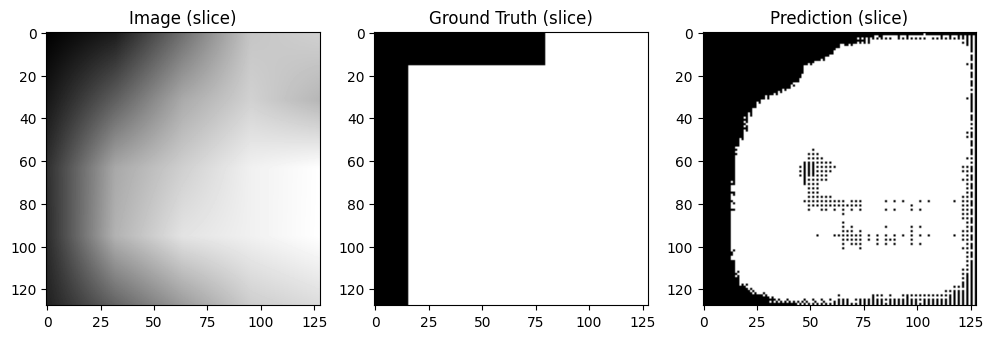

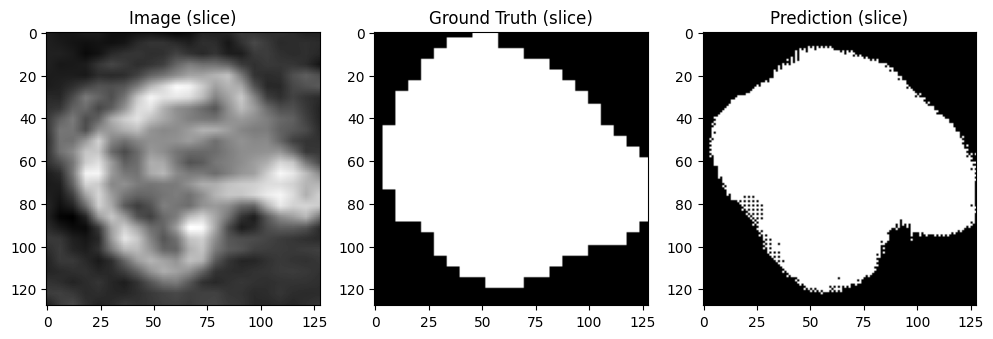

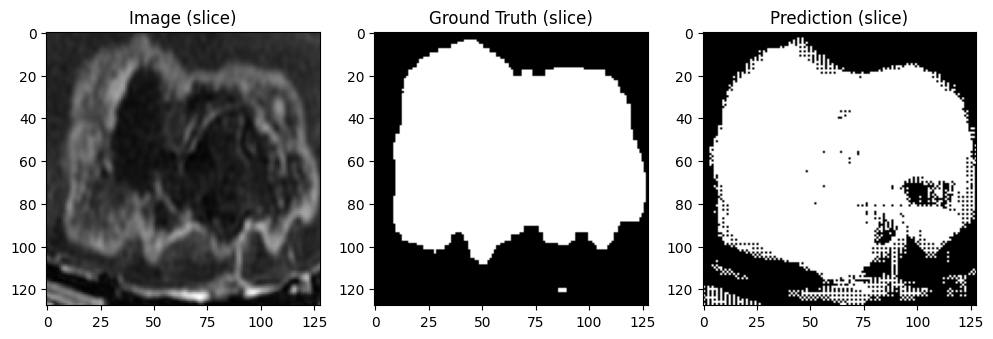

Validation Dice: 0.8081
Epoch 37/100


  0%|          | 0/7 [00:00<?, ?it/s]

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-037/label_nii_resampled/ReMIND-037-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-059/label_nii_resampled/ReMIND-059-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-045/label_nii_resampled/ReMIND-045-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-105/label_nii_resampled/ReMIND-105-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-083/label_nii_resampled/ReMIND-083-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-089/label_nii_resampled/ReMIND-089-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-0

 14%|█▍        | 1/7 [00:10<01:00, 10.14s/it]

training loss : 0.374264121055603
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-020/label_nii_resampled/ReMIND-020-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-035/label_nii_resampled/ReMIND-035-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-093/label_nii_resampled/ReMIND-093-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-017/label_nii_resampled/ReMIND-017-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


 29%|██▊       | 2/7 [00:13<00:29,  5.97s/it]

training loss : 0.35679325461387634
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-103/label_nii_resampled/ReMIND-103-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-073/label_nii_resampled/ReMIND-073-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-064/label_nii_resampled/ReMIND-064-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-036/label_nii_resampled/ReMIND-036-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-030/label_nii_resampled/ReMIND-030-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-060/label_nii_resampled/ReMIND-060-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/driv

 43%|████▎     | 3/7 [00:21<00:27,  6.84s/it]

training loss : 0.3503243029117584
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-050/label_nii_resampled/ReMIND-050-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-068/label_nii_resampled/ReMIND-068-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-034/label_nii_resampled/ReMIND-034-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-007/label_nii_resampled/ReMIND-007-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


 57%|█████▋    | 4/7 [00:23<00:15,  5.15s/it]

training loss : 0.425902783870697
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-082/label_nii_resampled/ReMIND-082-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-013/label_nii_resampled/ReMIND-013-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-025/label_nii_resampled/ReMIND-025-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-109/label_nii_resampled/ReMIND-109-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-062/label_nii_resampled/ReMIND-062-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-031/label_nii_resampled/ReMIND-031-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


 71%|███████▏  | 5/7 [00:30<00:11,  5.66s/it]

training loss : 0.4188915491104126
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-063/label_nii_resampled/ReMIND-063-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-102/label_nii_resampled/ReMIND-102-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-074/label_nii_resampled/ReMIND-074-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-110/label_nii_resampled/ReMIND-110-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-008/label_nii_resampled/ReMIND-008-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-015/label_nii_resampled/ReMIND-015-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive

 86%|████████▌ | 6/7 [00:40<00:07,  7.17s/it]

training loss : 0.4112735390663147


100%|██████████| 7/7 [00:40<00:00,  5.81s/it]


training loss : 0.4113227128982544
Epoch 37 average loss: 0.3927
Epoch 38/100


  0%|          | 0/7 [00:00<?, ?it/s]

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-050/label_nii_resampled/ReMIND-050-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-008/label_nii_resampled/ReMIND-008-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-077/label_nii_resampled/ReMIND-077-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-060/label_nii_resampled/ReMIND-060-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-022/label_nii_resampled/ReMIND-022-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-025/label_nii_resampled/ReMIND-025-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-0

 14%|█▍        | 1/7 [00:08<00:51,  8.58s/it]

training loss : 0.46394163370132446
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-043/label_nii_resampled/ReMIND-043-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-068/label_nii_resampled/ReMIND-068-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-105/label_nii_resampled/ReMIND-105-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-031/label_nii_resampled/ReMIND-031-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-062/label_nii_resampled/ReMIND-062-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-035/label_nii_resampled/ReMIND-035-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/driv

 29%|██▊       | 2/7 [00:21<00:55, 11.01s/it]

training loss : 0.4207642078399658


 43%|████▎     | 3/7 [00:21<00:24,  6.24s/it]

training loss : 0.4453713595867157
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-073/label_nii_resampled/ReMIND-073-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-017/label_nii_resampled/ReMIND-017-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-093/label_nii_resampled/ReMIND-093-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-102/label_nii_resampled/ReMIND-102-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-081/label_nii_resampled/ReMIND-081-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-063/label_nii_resampled/ReMIND-063-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive

 57%|█████▋    | 4/7 [00:32<00:24,  8.15s/it]

training loss : 0.3962019681930542


 71%|███████▏  | 5/7 [00:33<00:10,  5.40s/it]

training loss : 0.32686710357666016
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-097/label_nii_resampled/ReMIND-097-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-034/label_nii_resampled/ReMIND-034-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-074/label_nii_resampled/ReMIND-074-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-071/label_nii_resampled/ReMIND-071-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-061/label_nii_resampled/ReMIND-061-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


 86%|████████▌ | 6/7 [00:40<00:05,  5.85s/it]

training loss : 0.32599467039108276


100%|██████████| 7/7 [00:40<00:00,  5.80s/it]

training loss : 0.37532177567481995
Epoch 38 average loss: 0.3935


Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-104/label_nii_resampled/ReMIND-104-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-016/label_nii_resampled/ReMIND-016-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-038/label_nii_resampled/ReMIND-038-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-113/label_nii_resampled/ReMIND-113-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-084/label_nii_resampled/ReMIND-084-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-029/label_nii_resampled/ReMIND-029-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-0

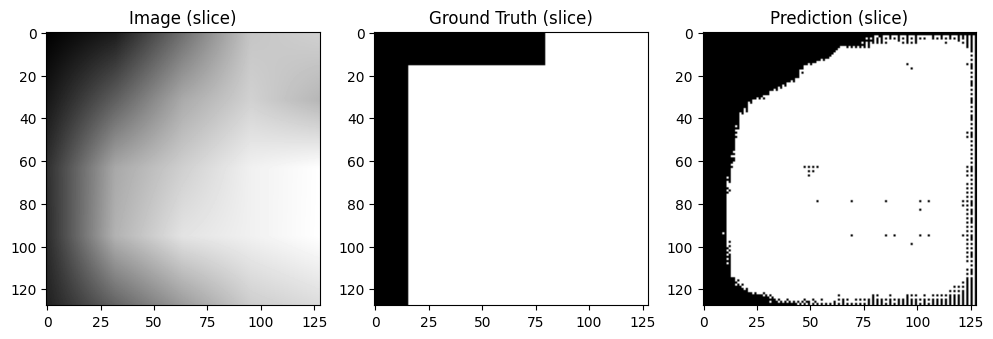

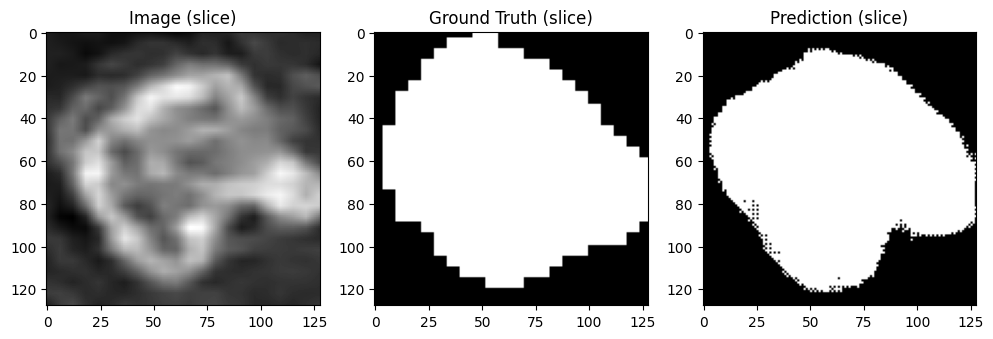

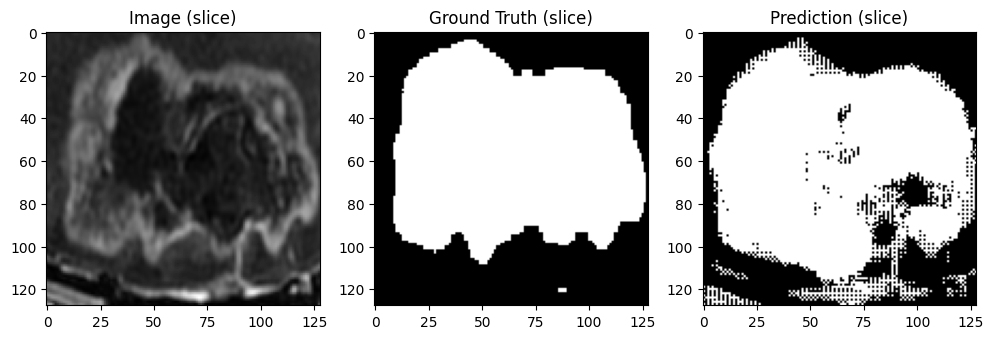

Validation Dice: 0.8070
Epoch 39/100


  0%|          | 0/7 [00:00<?, ?it/s]

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-043/label_nii_resampled/ReMIND-043-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-077/label_nii_resampled/ReMIND-077-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-063/label_nii_resampled/ReMIND-063-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-008/label_nii_resampled/ReMIND-008-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-082/label_nii_resampled/ReMIND-082-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-015/label_nii_resampled/ReMIND-015-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-0

 14%|█▍        | 1/7 [00:20<02:04, 20.70s/it]

training loss : 0.5095259547233582
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-061/label_nii_resampled/ReMIND-061-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


 29%|██▊       | 2/7 [00:21<00:44,  8.87s/it]

training loss : 0.44134360551834106
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-083/label_nii_resampled/ReMIND-083-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-068/label_nii_resampled/ReMIND-068-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-007/label_nii_resampled/ReMIND-007-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-102/label_nii_resampled/ReMIND-102-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-109/label_nii_resampled/ReMIND-109-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-037/label_nii_resampled/ReMIND-037-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/driv

 43%|████▎     | 3/7 [00:32<00:39,  9.75s/it]

training loss : 0.3296603560447693


 57%|█████▋    | 4/7 [00:32<00:18,  6.07s/it]

training loss : 0.39541882276535034
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-090/label_nii_resampled/ReMIND-090-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-110/label_nii_resampled/ReMIND-110-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-013/label_nii_resampled/ReMIND-013-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-060/label_nii_resampled/ReMIND-060-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-089/label_nii_resampled/ReMIND-089-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-073/label_nii_resampled/ReMIND-073-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


 71%|███████▏  | 5/7 [00:36<00:10,  5.41s/it]

training loss : 0.4156567454338074


 86%|████████▌ | 6/7 [00:37<00:03,  3.70s/it]

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-017/label_nii_resampled/ReMIND-017-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
training loss : 0.33479225635528564
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-022/label_nii_resampled/ReMIND-022-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-097/label_nii_resampled/ReMIND-097-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-014/label_nii_resampled/ReMIND-014-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-030/label_nii_resampled/ReMIND-030-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


100%|██████████| 7/7 [00:40<00:00,  5.82s/it]


training loss : 0.32698854804039
Epoch 39 average loss: 0.3933
Epoch 40/100


  0%|          | 0/7 [00:00<?, ?it/s]

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-074/label_nii_resampled/ReMIND-074-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-014/label_nii_resampled/ReMIND-014-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-103/label_nii_resampled/ReMIND-103-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-025/label_nii_resampled/ReMIND-025-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-030/label_nii_resampled/ReMIND-030-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-093/label_nii_resampled/ReMIND-093-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-0

 14%|█▍        | 1/7 [00:13<01:23, 13.89s/it]

training loss : 0.3526093661785126
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-036/label_nii_resampled/ReMIND-036-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-097/label_nii_resampled/ReMIND-097-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


 29%|██▊       | 2/7 [00:15<00:32,  6.46s/it]

training loss : 0.3544672727584839
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-110/label_nii_resampled/ReMIND-110-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-073/label_nii_resampled/ReMIND-073-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-062/label_nii_resampled/ReMIND-062-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-008/label_nii_resampled/ReMIND-008-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-061/label_nii_resampled/ReMIND-061-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-102/label_nii_resampled/ReMIND-102-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive

 43%|████▎     | 3/7 [00:29<00:40, 10.10s/it]

training loss : 0.4730004370212555


 57%|█████▋    | 4/7 [00:30<00:19,  6.35s/it]

training loss : 0.37691158056259155
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-090/label_nii_resampled/ReMIND-090-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-064/label_nii_resampled/ReMIND-064-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-007/label_nii_resampled/ReMIND-007-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-031/label_nii_resampled/ReMIND-031-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-082/label_nii_resampled/ReMIND-082-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-089/label_nii_resampled/ReMIND-089-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


 71%|███████▏  | 5/7 [00:37<00:13,  6.54s/it]

training loss : 0.4191748797893524


 86%|████████▌ | 6/7 [00:37<00:04,  4.47s/it]

training loss : 0.3577185571193695
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-037/label_nii_resampled/ReMIND-037-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-105/label_nii_resampled/ReMIND-105-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-013/label_nii_resampled/ReMIND-013-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-060/label_nii_resampled/ReMIND-060-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-017/label_nii_resampled/ReMIND-017-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


100%|██████████| 7/7 [00:41<00:00,  5.95s/it]

training loss : 0.3660959005355835
Epoch 40 average loss: 0.3857


Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-104/label_nii_resampled/ReMIND-104-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-016/label_nii_resampled/ReMIND-016-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-038/label_nii_resampled/ReMIND-038-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-113/label_nii_resampled/ReMIND-113-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-084/label_nii_resampled/ReMIND-084-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-029/label_nii_resampled/ReMIND-029-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-0

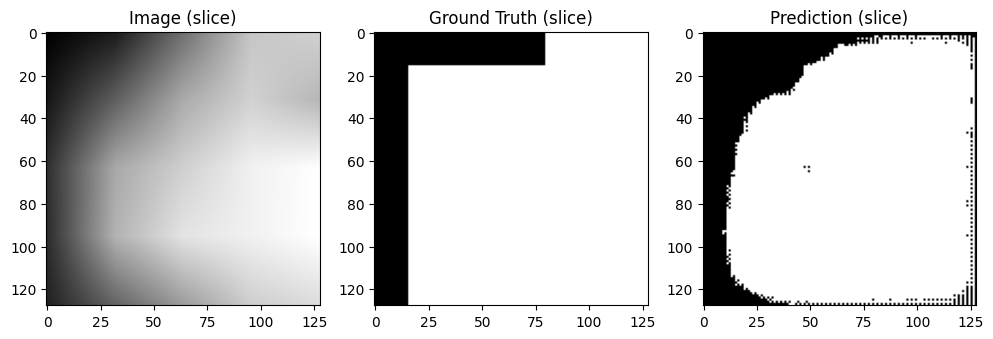

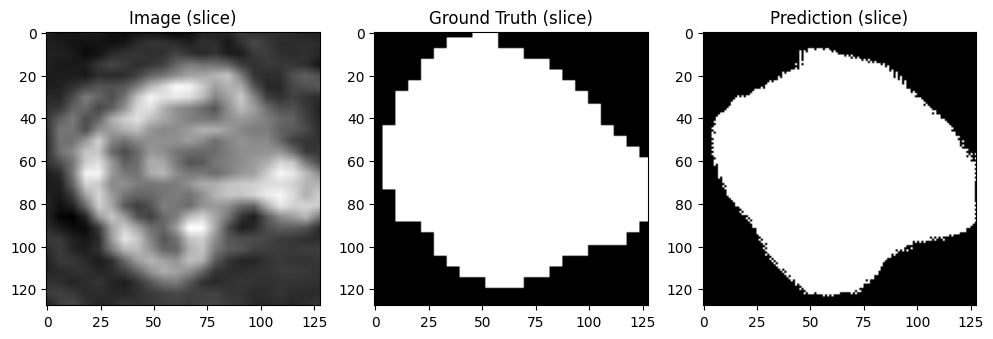

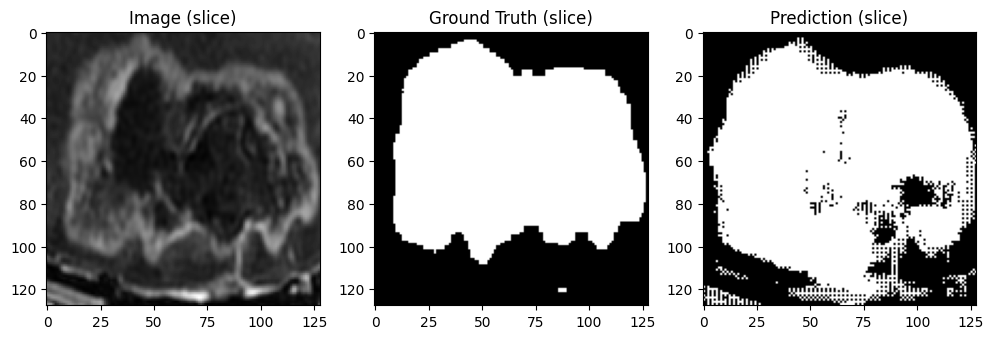

Validation Dice: 0.8096
Epoch 41/100


  0%|          | 0/7 [00:00<?, ?it/s]

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-090/label_nii_resampled/ReMIND-090-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gzMask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-050/label_nii_resampled/ReMIND-050-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-110/label_nii_resampled/ReMIND-110-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-017/label_nii_resampled/ReMIND-017-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-105/label_nii_resampled/ReMIND-105-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-043/label_nii_resampled/ReMIND-043-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-0

 14%|█▍        | 1/7 [00:18<01:48, 18.01s/it]

training loss : 0.4100498557090759


 29%|██▊       | 2/7 [00:18<00:38,  7.74s/it]

training loss : 0.41850218176841736
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-022/label_nii_resampled/ReMIND-022-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-083/label_nii_resampled/ReMIND-083-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-061/label_nii_resampled/ReMIND-061-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-097/label_nii_resampled/ReMIND-097-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-109/label_nii_resampled/ReMIND-109-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-014/label_nii_resampled/ReMIND-014-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/driv

 43%|████▎     | 3/7 [00:29<00:36,  9.18s/it]

training loss : 0.32140958309173584


 57%|█████▋    | 4/7 [00:29<00:17,  5.75s/it]

training loss : 0.3877851963043213
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-060/label_nii_resampled/ReMIND-060-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-030/label_nii_resampled/ReMIND-030-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-102/label_nii_resampled/ReMIND-102-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-103/label_nii_resampled/ReMIND-103-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-015/label_nii_resampled/ReMIND-015-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-071/label_nii_resampled/ReMIND-071-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


 71%|███████▏  | 5/7 [00:36<00:11,  5.94s/it]

training loss : 0.38201186060905457


 86%|████████▌ | 6/7 [00:36<00:04,  4.06s/it]

training loss : 0.3840009272098541
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-089/label_nii_resampled/ReMIND-089-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-045/label_nii_resampled/ReMIND-045-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-073/label_nii_resampled/ReMIND-073-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-031/label_nii_resampled/ReMIND-031-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-063/label_nii_resampled/ReMIND-063-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


100%|██████████| 7/7 [00:41<00:00,  5.92s/it]


training loss : 0.3646751344203949
Epoch 41 average loss: 0.3812
Epoch 42/100


  0%|          | 0/7 [00:00<?, ?it/s]

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-077/label_nii_resampled/ReMIND-077-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gzMask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-034/label_nii_resampled/ReMIND-034-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-017/label_nii_resampled/ReMIND-017-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-073/label_nii_resampled/ReMIND-073-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-050/label_nii_resampled/ReMIND-050-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-059/label_nii_resampled/ReMIND-059-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-1

 14%|█▍        | 1/7 [00:10<01:03, 10.63s/it]

training loss : 0.4411909282207489


 29%|██▊       | 2/7 [00:11<00:23,  4.72s/it]

training loss : 0.3501773476600647
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-093/label_nii_resampled/ReMIND-093-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-030/label_nii_resampled/ReMIND-030-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-068/label_nii_resampled/ReMIND-068-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-071/label_nii_resampled/ReMIND-071-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-036/label_nii_resampled/ReMIND-036-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-062/label_nii_resampled/ReMIND-062-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive

 43%|████▎     | 3/7 [00:23<00:31,  7.99s/it]

training loss : 0.33158665895462036


 57%|█████▋    | 4/7 [00:23<00:15,  5.10s/it]

training loss : 0.3717758059501648
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-045/label_nii_resampled/ReMIND-045-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-064/label_nii_resampled/ReMIND-064-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-013/label_nii_resampled/ReMIND-013-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-035/label_nii_resampled/ReMIND-035-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-061/label_nii_resampled/ReMIND-061-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-020/label_nii_resampled/ReMIND-020-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive

 71%|███████▏  | 5/7 [00:32<00:13,  6.54s/it]

training loss : 0.34018266201019287


 86%|████████▌ | 6/7 [00:33<00:04,  4.47s/it]

training loss : 0.38886329531669617
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-043/label_nii_resampled/ReMIND-043-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-022/label_nii_resampled/ReMIND-022-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-037/label_nii_resampled/ReMIND-037-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-105/label_nii_resampled/ReMIND-105-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-008/label_nii_resampled/ReMIND-008-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


100%|██████████| 7/7 [00:41<00:00,  6.00s/it]

training loss : 0.4303562045097351
Epoch 42 average loss: 0.3792


Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-104/label_nii_resampled/ReMIND-104-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-016/label_nii_resampled/ReMIND-016-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-038/label_nii_resampled/ReMIND-038-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-113/label_nii_resampled/ReMIND-113-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-084/label_nii_resampled/ReMIND-084-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-029/label_nii_resampled/ReMIND-029-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-0

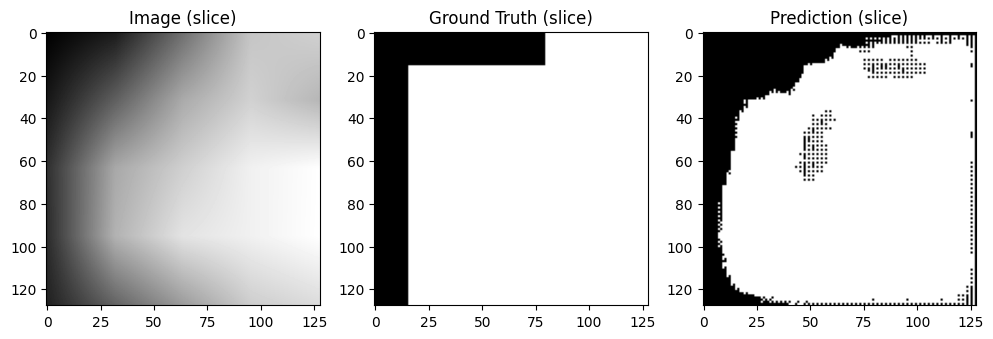

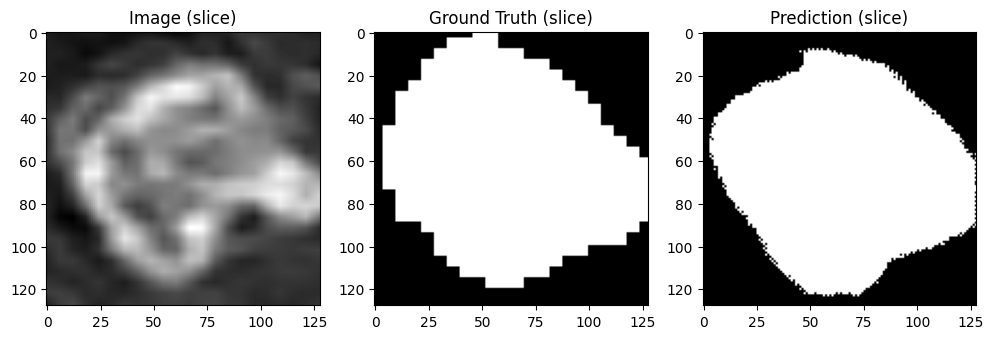

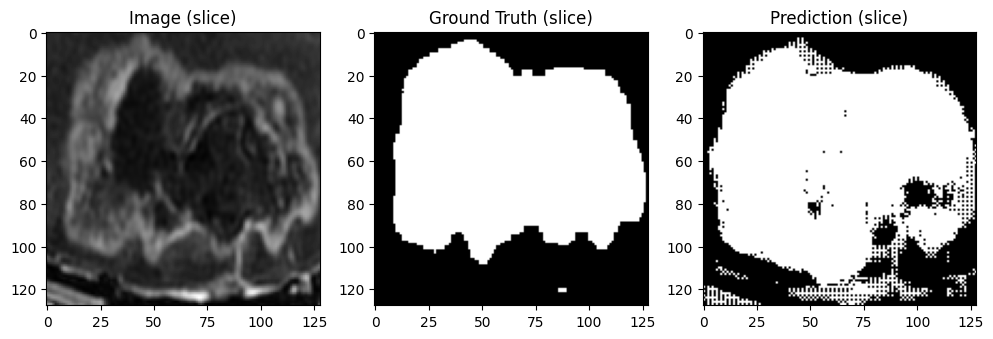

Validation Dice: 0.7983
Epoch 43/100


  0%|          | 0/7 [00:00<?, ?it/s]

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-031/label_nii_resampled/ReMIND-031-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-071/label_nii_resampled/ReMIND-071-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-017/label_nii_resampled/ReMIND-017-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-102/label_nii_resampled/ReMIND-102-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-030/label_nii_resampled/ReMIND-030-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-034/label_nii_resampled/ReMIND-034-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-0

 14%|█▍        | 1/7 [00:07<00:44,  7.49s/it]

training loss : 0.3250992000102997
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-090/label_nii_resampled/ReMIND-090-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-025/label_nii_resampled/ReMIND-025-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-050/label_nii_resampled/ReMIND-050-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-015/label_nii_resampled/ReMIND-015-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-063/label_nii_resampled/ReMIND-063-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-093/label_nii_resampled/ReMIND-093-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive

 29%|██▊       | 2/7 [00:14<00:36,  7.23s/it]

training loss : 0.41865015029907227
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-007/label_nii_resampled/ReMIND-007-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-105/label_nii_resampled/ReMIND-105-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-008/label_nii_resampled/ReMIND-008-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-037/label_nii_resampled/ReMIND-037-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-020/label_nii_resampled/ReMIND-020-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


 43%|████▎     | 3/7 [00:20<00:27,  6.82s/it]

training loss : 0.3583846688270569
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-064/label_nii_resampled/ReMIND-064-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-110/label_nii_resampled/ReMIND-110-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-081/label_nii_resampled/ReMIND-081-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-013/label_nii_resampled/ReMIND-013-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-077/label_nii_resampled/ReMIND-077-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-083/label_nii_resampled/ReMIND-083-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive

 57%|█████▋    | 4/7 [00:30<00:23,  7.95s/it]

training loss : 0.39632660150527954
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-068/label_nii_resampled/ReMIND-068-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


 71%|███████▏  | 5/7 [00:31<00:10,  5.27s/it]

training loss : 0.4289572238922119
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-060/label_nii_resampled/ReMIND-060-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-074/label_nii_resampled/ReMIND-074-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-072/label_nii_resampled/ReMIND-072-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-036/label_nii_resampled/ReMIND-036-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-082/label_nii_resampled/ReMIND-082-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-089/label_nii_resampled/ReMIND-089-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive

 86%|████████▌ | 6/7 [00:38<00:06,  6.01s/it]

training loss : 0.39301788806915283


100%|██████████| 7/7 [00:38<00:00,  5.57s/it]


training loss : 0.31958383321762085
Epoch 43 average loss: 0.3771
Epoch 44/100


  0%|          | 0/7 [00:00<?, ?it/s]

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-093/label_nii_resampled/ReMIND-093-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-097/label_nii_resampled/ReMIND-097-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-083/label_nii_resampled/ReMIND-083-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-037/label_nii_resampled/ReMIND-037-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-110/label_nii_resampled/ReMIND-110-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-043/label_nii_resampled/ReMIND-043-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-0

 14%|█▍        | 1/7 [00:14<01:25, 14.31s/it]

training loss : 0.41695132851600647


 29%|██▊       | 2/7 [00:14<00:31,  6.26s/it]

training loss : 0.3473658263683319
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-059/label_nii_resampled/ReMIND-059-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-061/label_nii_resampled/ReMIND-061-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-050/label_nii_resampled/ReMIND-050-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-034/label_nii_resampled/ReMIND-034-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-071/label_nii_resampled/ReMIND-071-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-082/label_nii_resampled/ReMIND-082-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive

 43%|████▎     | 3/7 [00:24<00:31,  7.82s/it]

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-036/label_nii_resampled/ReMIND-036-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
training loss : 0.40630999207496643


 57%|█████▋    | 4/7 [00:25<00:14,  4.98s/it]

training loss : 0.4337847828865051
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-102/label_nii_resampled/ReMIND-102-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-007/label_nii_resampled/ReMIND-007-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-103/label_nii_resampled/ReMIND-103-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-074/label_nii_resampled/ReMIND-074-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-077/label_nii_resampled/ReMIND-077-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-008/label_nii_resampled/ReMIND-008-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive

 71%|███████▏  | 5/7 [00:35<00:13,  6.91s/it]

training loss : 0.40206506848335266


 86%|████████▌ | 6/7 [00:35<00:04,  4.68s/it]

training loss : 0.3250725269317627
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-022/label_nii_resampled/ReMIND-022-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-014/label_nii_resampled/ReMIND-014-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-072/label_nii_resampled/ReMIND-072-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-073/label_nii_resampled/ReMIND-073-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-035/label_nii_resampled/ReMIND-035-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


100%|██████████| 7/7 [00:40<00:00,  5.85s/it]

training loss : 0.31578850746154785


Epoch 44 average loss: 0.3782
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-104/label_nii_resampled/ReMIND-104-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-016/label_nii_resampled/ReMIND-016-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-038/label_nii_resampled/ReMIND-038-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-113/label_nii_resampled/ReMIND-113-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-084/label_nii_resampled/ReMIND-084-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-029/label_nii_resampled/ReMIND-029-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My D

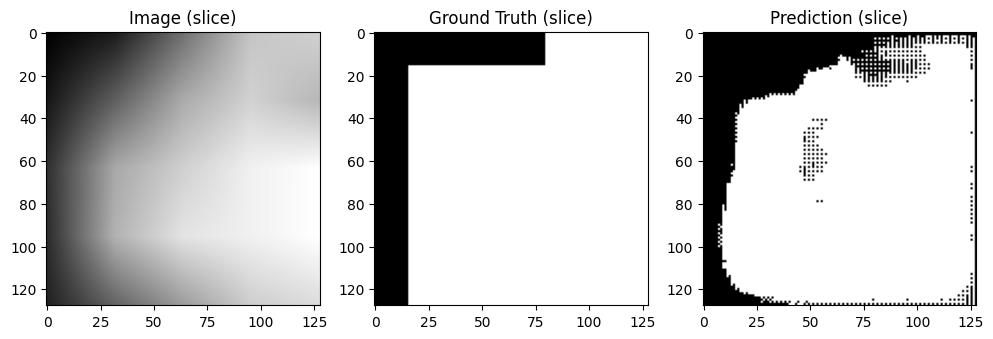

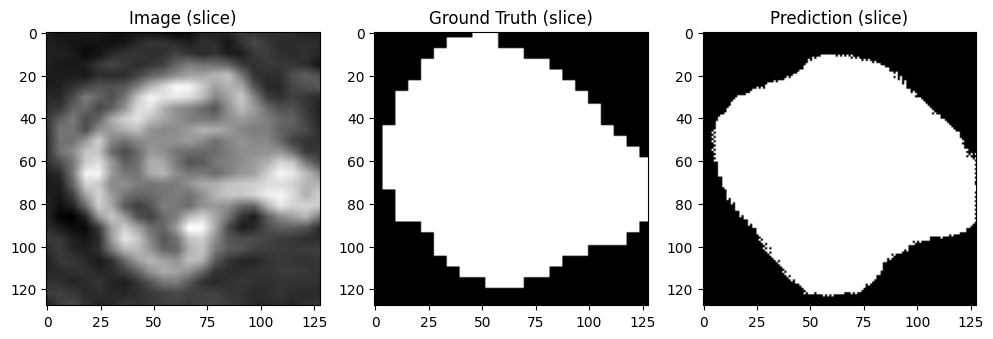

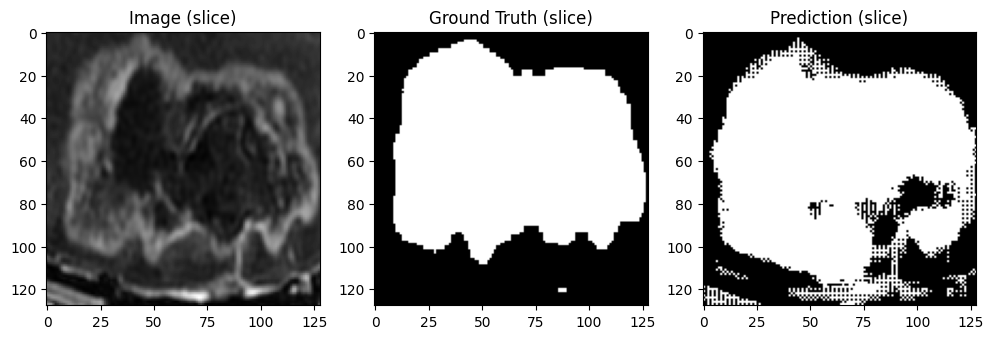

Validation Dice: 0.8058
Epoch 45/100


  0%|          | 0/7 [00:00<?, ?it/s]

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-017/label_nii_resampled/ReMIND-017-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-050/label_nii_resampled/ReMIND-050-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-090/label_nii_resampled/ReMIND-090-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-030/label_nii_resampled/ReMIND-030-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-081/label_nii_resampled/ReMIND-081-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-097/label_nii_resampled/ReMIND-097-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-0

 14%|█▍        | 1/7 [00:10<01:00, 10.08s/it]

training loss : 0.3530787229537964
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-061/label_nii_resampled/ReMIND-061-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-059/label_nii_resampled/ReMIND-059-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-063/label_nii_resampled/ReMIND-063-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-034/label_nii_resampled/ReMIND-034-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-043/label_nii_resampled/ReMIND-043-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


 29%|██▊       | 2/7 [00:14<00:33,  6.65s/it]

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-060/label_nii_resampled/ReMIND-060-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
training loss : 0.33380600810050964
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-083/label_nii_resampled/ReMIND-083-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-013/label_nii_resampled/ReMIND-013-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-082/label_nii_resampled/ReMIND-082-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-015/label_nii_resampled/ReMIND-015-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-077/label_nii_resampled/ReMIND-077-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/driv

 43%|████▎     | 3/7 [00:19<00:23,  5.79s/it]

training loss : 0.3876093029975891
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-022/label_nii_resampled/ReMIND-022-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-037/label_nii_resampled/ReMIND-037-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-008/label_nii_resampled/ReMIND-008-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-014/label_nii_resampled/ReMIND-014-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-072/label_nii_resampled/ReMIND-072-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-093/label_nii_resampled/ReMIND-093-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive

 57%|█████▋    | 4/7 [00:31<00:25,  8.33s/it]

training loss : 0.5268864035606384


 71%|███████▏  | 5/7 [00:31<00:11,  5.54s/it]

training loss : 0.325407475233078
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-025/label_nii_resampled/ReMIND-025-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-045/label_nii_resampled/ReMIND-045-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-031/label_nii_resampled/ReMIND-031-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-035/label_nii_resampled/ReMIND-035-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-020/label_nii_resampled/ReMIND-020-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-071/label_nii_resampled/ReMIND-071-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/

 86%|████████▌ | 6/7 [00:41<00:06,  6.96s/it]

training loss : 0.38359183073043823


100%|██████████| 7/7 [00:42<00:00,  6.00s/it]


training loss : 0.33049139380455017
Epoch 45 average loss: 0.3773
Epoch 46/100


  0%|          | 0/7 [00:00<?, ?it/s]

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-074/label_nii_resampled/ReMIND-074-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-007/label_nii_resampled/ReMIND-007-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-073/label_nii_resampled/ReMIND-073-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-036/label_nii_resampled/ReMIND-036-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-031/label_nii_resampled/ReMIND-031-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-014/label_nii_resampled/ReMIND-014-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-0

 14%|█▍        | 1/7 [00:08<00:50,  8.36s/it]

training loss : 0.3842265009880066
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-082/label_nii_resampled/ReMIND-082-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-063/label_nii_resampled/ReMIND-063-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-090/label_nii_resampled/ReMIND-090-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-030/label_nii_resampled/ReMIND-030-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-050/label_nii_resampled/ReMIND-050-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-045/label_nii_resampled/ReMIND-045-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


 29%|██▊       | 2/7 [00:13<00:32,  6.52s/it]

training loss : 0.35581111907958984
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-008/label_nii_resampled/ReMIND-008-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-072/label_nii_resampled/ReMIND-072-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-068/label_nii_resampled/ReMIND-068-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-060/label_nii_resampled/ReMIND-060-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-064/label_nii_resampled/ReMIND-064-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-102/label_nii_resampled/ReMIND-102-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/driv

 43%|████▎     | 3/7 [00:25<00:36,  9.04s/it]

training loss : 0.3822377622127533


 57%|█████▋    | 4/7 [00:26<00:17,  5.69s/it]

training loss : 0.4366108477115631
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-083/label_nii_resampled/ReMIND-083-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-022/label_nii_resampled/ReMIND-022-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-110/label_nii_resampled/ReMIND-110-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-077/label_nii_resampled/ReMIND-077-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-061/label_nii_resampled/ReMIND-061-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-062/label_nii_resampled/ReMIND-062-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive

 71%|███████▏  | 5/7 [00:33<00:12,  6.42s/it]

training loss : 0.4093520939350128
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-097/label_nii_resampled/ReMIND-097-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-037/label_nii_resampled/ReMIND-037-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


 86%|████████▌ | 6/7 [00:37<00:05,  5.40s/it]

training loss : 0.33351054787635803
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-035/label_nii_resampled/ReMIND-035-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-089/label_nii_resampled/ReMIND-089-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-034/label_nii_resampled/ReMIND-034-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


100%|██████████| 7/7 [00:40<00:00,  5.83s/it]

training loss : 0.29891741275787354


Epoch 46 average loss: 0.3715
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-104/label_nii_resampled/ReMIND-104-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-016/label_nii_resampled/ReMIND-016-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-038/label_nii_resampled/ReMIND-038-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-113/label_nii_resampled/ReMIND-113-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-084/label_nii_resampled/ReMIND-084-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-029/label_nii_resampled/ReMIND-029-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My D

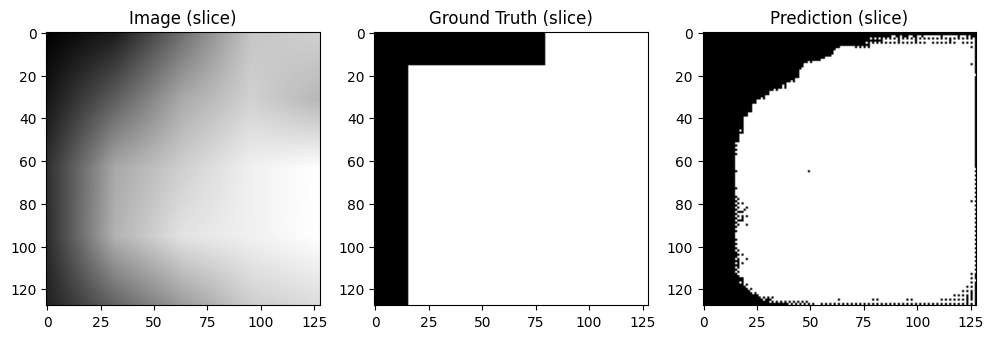

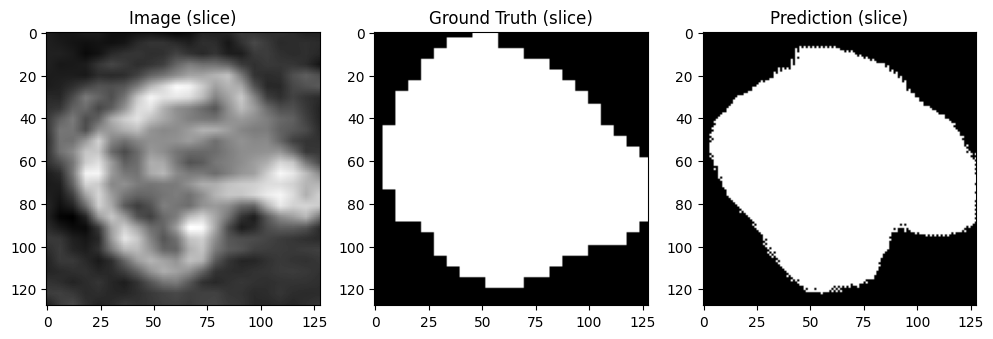

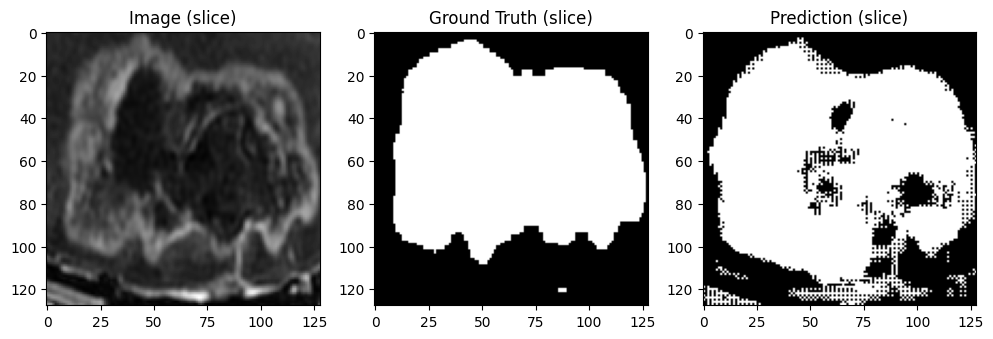

Validation Dice: 0.8082
Epoch 47/100


  0%|          | 0/7 [00:00<?, ?it/s]

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-007/label_nii_resampled/ReMIND-007-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-013/label_nii_resampled/ReMIND-013-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-034/label_nii_resampled/ReMIND-034-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-015/label_nii_resampled/ReMIND-015-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-097/label_nii_resampled/ReMIND-097-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-060/label_nii_resampled/ReMIND-060-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-0

 14%|█▍        | 1/7 [00:13<01:21, 13.51s/it]

training loss : 0.32318392395973206


 29%|██▊       | 2/7 [00:14<00:29,  5.93s/it]

training loss : 0.3770337700843811
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-025/label_nii_resampled/ReMIND-025-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-064/label_nii_resampled/ReMIND-064-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-030/label_nii_resampled/ReMIND-030-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-068/label_nii_resampled/ReMIND-068-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-063/label_nii_resampled/ReMIND-063-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-017/label_nii_resampled/ReMIND-017-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive

 43%|████▎     | 3/7 [00:20<00:24,  6.16s/it]

training loss : 0.3739889860153198
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-110/label_nii_resampled/ReMIND-110-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


 57%|█████▋    | 4/7 [00:22<00:13,  4.34s/it]

training loss : 0.3035946488380432
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-071/label_nii_resampled/ReMIND-071-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-062/label_nii_resampled/ReMIND-062-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-037/label_nii_resampled/ReMIND-037-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-043/label_nii_resampled/ReMIND-043-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-089/label_nii_resampled/ReMIND-089-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-081/label_nii_resampled/ReMIND-081-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive

 71%|███████▏  | 5/7 [00:33<00:13,  6.99s/it]

training loss : 0.46692705154418945


 86%|████████▌ | 6/7 [00:34<00:04,  4.77s/it]

training loss : 0.3244004249572754
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-083/label_nii_resampled/ReMIND-083-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-077/label_nii_resampled/ReMIND-077-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-061/label_nii_resampled/ReMIND-061-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-082/label_nii_resampled/ReMIND-082-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-036/label_nii_resampled/ReMIND-036-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


100%|██████████| 7/7 [00:42<00:00,  6.02s/it]


training loss : 0.4030470848083496
Epoch 47 average loss: 0.3675
Epoch 48/100


  0%|          | 0/7 [00:00<?, ?it/s]

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-037/label_nii_resampled/ReMIND-037-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-071/label_nii_resampled/ReMIND-071-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-031/label_nii_resampled/ReMIND-031-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-073/label_nii_resampled/ReMIND-073-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-014/label_nii_resampled/ReMIND-014-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-061/label_nii_resampled/ReMIND-061-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-0

 14%|█▍        | 1/7 [00:14<01:29, 14.92s/it]

training loss : 0.33905988931655884
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-083/label_nii_resampled/ReMIND-083-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


 29%|██▊       | 2/7 [00:15<00:32,  6.49s/it]

training loss : 0.3240504562854767
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-077/label_nii_resampled/ReMIND-077-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-025/label_nii_resampled/ReMIND-025-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-064/label_nii_resampled/ReMIND-064-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-105/label_nii_resampled/ReMIND-105-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-060/label_nii_resampled/ReMIND-060-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gzMask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-059/label_nii_resampled/ReMIND-059-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz

Mask get path: /content/drive

 43%|████▎     | 3/7 [00:22<00:27,  6.88s/it]

training loss : 0.40771836042404175
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-068/label_nii_resampled/ReMIND-068-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-090/label_nii_resampled/ReMIND-090-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-050/label_nii_resampled/ReMIND-050-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-082/label_nii_resampled/ReMIND-082-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-089/label_nii_resampled/ReMIND-089-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-015/label_nii_resampled/ReMIND-015-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/driv

 57%|█████▋    | 4/7 [00:30<00:21,  7.09s/it]

training loss : 0.42951324582099915


 71%|███████▏  | 5/7 [00:30<00:09,  4.78s/it]

training loss : 0.3970477879047394
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-103/label_nii_resampled/ReMIND-103-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-020/label_nii_resampled/ReMIND-020-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-030/label_nii_resampled/ReMIND-030-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-035/label_nii_resampled/ReMIND-035-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-034/label_nii_resampled/ReMIND-034-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-062/label_nii_resampled/ReMIND-062-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive

 86%|████████▌ | 6/7 [00:41<00:06,  6.78s/it]

training loss : 0.3183574080467224


100%|██████████| 7/7 [00:42<00:00,  6.00s/it]

training loss : 0.33614784479141235
Epoch 48 average loss: 0.3646


Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-104/label_nii_resampled/ReMIND-104-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-016/label_nii_resampled/ReMIND-016-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-038/label_nii_resampled/ReMIND-038-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-113/label_nii_resampled/ReMIND-113-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-084/label_nii_resampled/ReMIND-084-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-029/label_nii_resampled/ReMIND-029-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-0

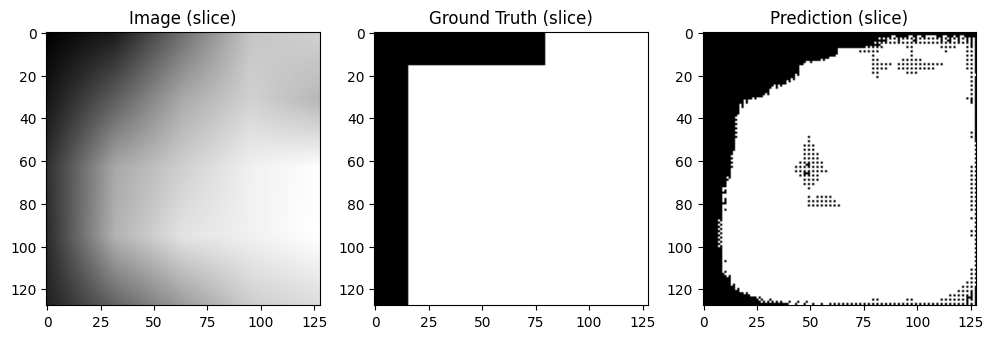

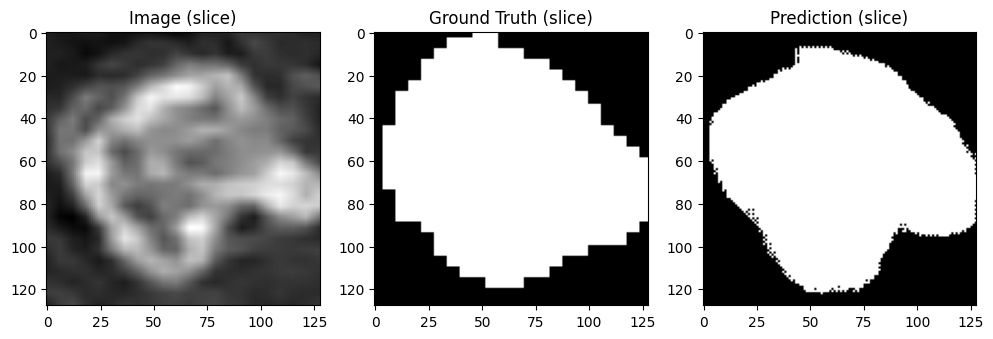

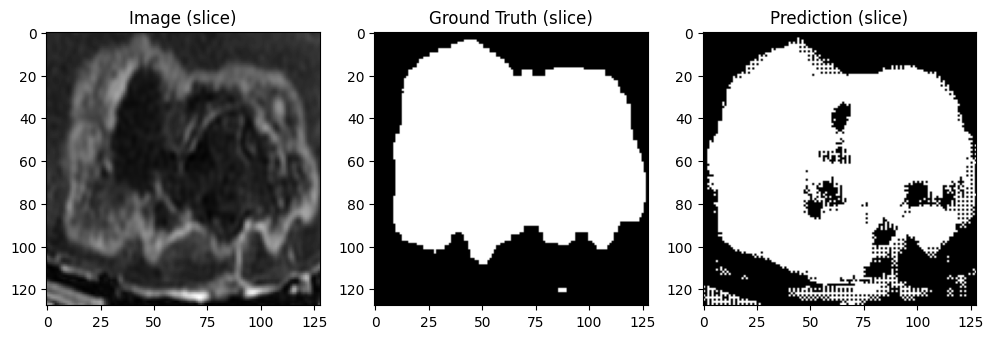

Validation Dice: 0.8012
Epoch 49/100


  0%|          | 0/7 [00:00<?, ?it/s]

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-017/label_nii_resampled/ReMIND-017-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-022/label_nii_resampled/ReMIND-022-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-083/label_nii_resampled/ReMIND-083-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-060/label_nii_resampled/ReMIND-060-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-068/label_nii_resampled/ReMIND-068-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-061/label_nii_resampled/ReMIND-061-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-0

 14%|█▍        | 1/7 [00:10<01:05, 10.97s/it]

training loss : 0.3476608991622925


 29%|██▊       | 2/7 [00:11<00:24,  4.88s/it]

training loss : 0.3294411897659302
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-008/label_nii_resampled/ReMIND-008-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-074/label_nii_resampled/ReMIND-074-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-043/label_nii_resampled/ReMIND-043-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-109/label_nii_resampled/ReMIND-109-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-064/label_nii_resampled/ReMIND-064-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-110/label_nii_resampled/ReMIND-110-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive

 43%|████▎     | 3/7 [00:26<00:38,  9.55s/it]

training loss : 0.3570161461830139
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-059/label_nii_resampled/ReMIND-059-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


 57%|█████▋    | 4/7 [00:27<00:18,  6.00s/it]

training loss : 0.42794883251190186
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-077/label_nii_resampled/ReMIND-077-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-090/label_nii_resampled/ReMIND-090-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-031/label_nii_resampled/ReMIND-031-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-063/label_nii_resampled/ReMIND-063-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-007/label_nii_resampled/ReMIND-007-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-037/label_nii_resampled/ReMIND-037-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/driv

 71%|███████▏  | 5/7 [00:35<00:13,  6.64s/it]

training loss : 0.33295801281929016


 86%|████████▌ | 6/7 [00:35<00:04,  4.55s/it]

training loss : 0.44910764694213867
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-102/label_nii_resampled/ReMIND-102-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-105/label_nii_resampled/ReMIND-105-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-014/label_nii_resampled/ReMIND-014-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-097/label_nii_resampled/ReMIND-097-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-025/label_nii_resampled/ReMIND-025-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


100%|██████████| 7/7 [00:40<00:00,  5.83s/it]


training loss : 0.3023602366447449
Epoch 49 average loss: 0.3638
Epoch 50/100


  0%|          | 0/7 [00:00<?, ?it/s]

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-072/label_nii_resampled/ReMIND-072-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-017/label_nii_resampled/ReMIND-017-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-037/label_nii_resampled/ReMIND-037-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-025/label_nii_resampled/ReMIND-025-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-035/label_nii_resampled/ReMIND-035-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-082/label_nii_resampled/ReMIND-082-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-0

 14%|█▍        | 1/7 [00:13<01:19, 13.24s/it]

training loss : 0.3060334026813507


 29%|██▊       | 2/7 [00:13<00:29,  5.84s/it]

training loss : 0.3225550055503845
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-045/label_nii_resampled/ReMIND-045-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-090/label_nii_resampled/ReMIND-090-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-073/label_nii_resampled/ReMIND-073-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-007/label_nii_resampled/ReMIND-007-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-061/label_nii_resampled/ReMIND-061-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-013/label_nii_resampled/ReMIND-013-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive

 43%|████▎     | 3/7 [00:24<00:31,  7.93s/it]

training loss : 0.3796323537826538


 57%|█████▋    | 4/7 [00:24<00:15,  5.03s/it]

training loss : 0.39313215017318726
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-089/label_nii_resampled/ReMIND-089-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-031/label_nii_resampled/ReMIND-031-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-020/label_nii_resampled/ReMIND-020-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-109/label_nii_resampled/ReMIND-109-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-008/label_nii_resampled/ReMIND-008-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-015/label_nii_resampled/ReMIND-015-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/driv

 71%|███████▏  | 5/7 [00:37<00:15,  7.62s/it]

training loss : 0.3573024272918701


 86%|████████▌ | 6/7 [00:37<00:05,  5.17s/it]

training loss : 0.3379720151424408
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-110/label_nii_resampled/ReMIND-110-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-063/label_nii_resampled/ReMIND-063-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-081/label_nii_resampled/ReMIND-081-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-060/label_nii_resampled/ReMIND-060-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-030/label_nii_resampled/ReMIND-030-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


100%|██████████| 7/7 [00:43<00:00,  6.17s/it]

training loss : 0.4233212471008301
Epoch 50 average loss: 0.3600


Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-104/label_nii_resampled/ReMIND-104-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-016/label_nii_resampled/ReMIND-016-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-038/label_nii_resampled/ReMIND-038-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-113/label_nii_resampled/ReMIND-113-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-084/label_nii_resampled/ReMIND-084-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-029/label_nii_resampled/ReMIND-029-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-0

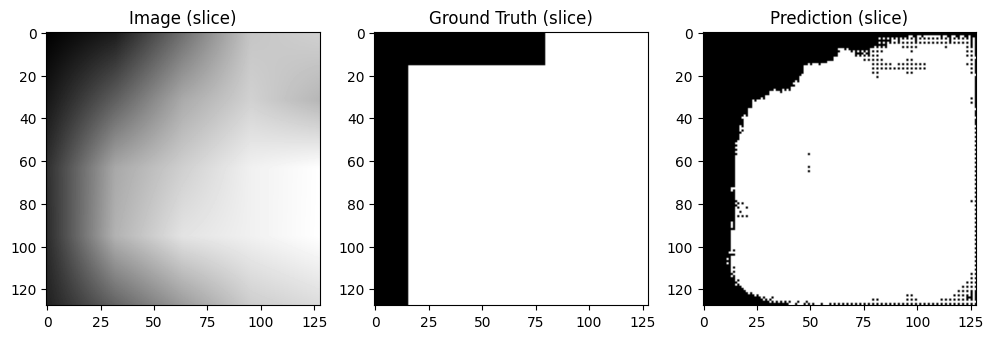

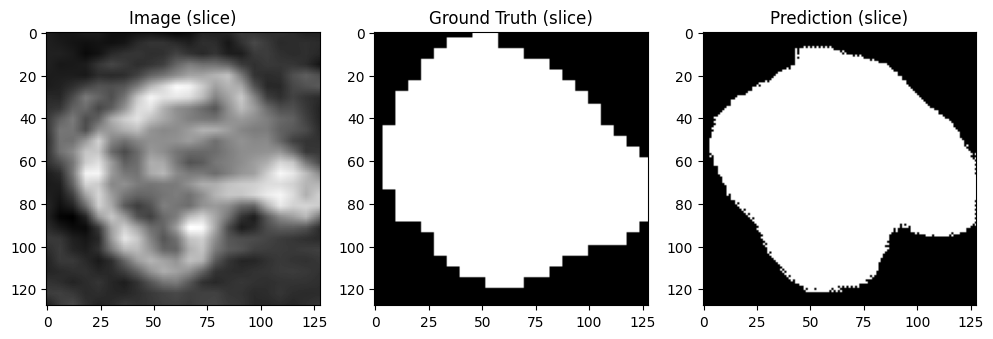

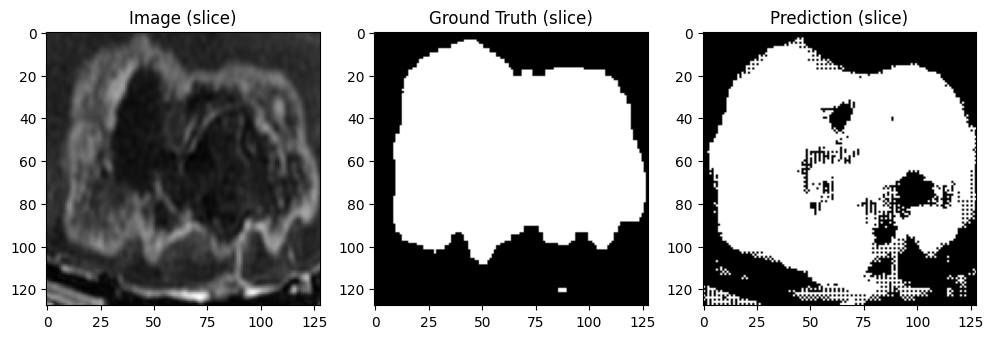

Validation Dice: 0.8069
Epoch 51/100


  0%|          | 0/7 [00:00<?, ?it/s]

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-007/label_nii_resampled/ReMIND-007-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-090/label_nii_resampled/ReMIND-090-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-035/label_nii_resampled/ReMIND-035-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-077/label_nii_resampled/ReMIND-077-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-043/label_nii_resampled/ReMIND-043-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-093/label_nii_resampled/ReMIND-093-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-0

 14%|█▍        | 1/7 [00:12<01:13, 12.18s/it]

training loss : 0.3899739980697632


 29%|██▊       | 2/7 [00:12<00:26,  5.38s/it]

training loss : 0.3235601484775543
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-015/label_nii_resampled/ReMIND-015-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-103/label_nii_resampled/ReMIND-103-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-017/label_nii_resampled/ReMIND-017-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-034/label_nii_resampled/ReMIND-034-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-059/label_nii_resampled/ReMIND-059-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-068/label_nii_resampled/ReMIND-068-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive

 43%|████▎     | 3/7 [00:25<00:35,  8.88s/it]

training loss : 0.3365686535835266


 57%|█████▋    | 4/7 [00:26<00:16,  5.53s/it]

training loss : 0.2830520272254944
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-071/label_nii_resampled/ReMIND-071-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-110/label_nii_resampled/ReMIND-110-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-008/label_nii_resampled/ReMIND-008-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-109/label_nii_resampled/ReMIND-109-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-060/label_nii_resampled/ReMIND-060-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-081/label_nii_resampled/ReMIND-081-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


 71%|███████▏  | 5/7 [00:36<00:14,  7.36s/it]

training loss : 0.42416632175445557


 86%|████████▌ | 6/7 [00:37<00:05,  5.01s/it]

training loss : 0.34961652755737305
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-062/label_nii_resampled/ReMIND-062-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-050/label_nii_resampled/ReMIND-050-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-031/label_nii_resampled/ReMIND-031-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-105/label_nii_resampled/ReMIND-105-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-073/label_nii_resampled/ReMIND-073-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


100%|██████████| 7/7 [00:42<00:00,  6.04s/it]


training loss : 0.4213705360889435
Epoch 51 average loss: 0.3612
Epoch 52/100


  0%|          | 0/7 [00:00<?, ?it/s]

Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-043/label_nii_resampled/ReMIND-043-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-059/label_nii_resampled/ReMIND-059-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-045/label_nii_resampled/ReMIND-045-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-089/label_nii_resampled/ReMIND-089-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-109/label_nii_resampled/ReMIND-109-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-036/label_nii_resampled/ReMIND-036-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-0

 14%|█▍        | 1/7 [00:08<00:50,  8.43s/it]

training loss : 0.34782880544662476
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-083/label_nii_resampled/ReMIND-083-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-105/label_nii_resampled/ReMIND-105-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-074/label_nii_resampled/ReMIND-074-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-090/label_nii_resampled/ReMIND-090-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


 29%|██▊       | 2/7 [00:10<00:24,  4.83s/it]

training loss : 0.33114713430404663
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-030/label_nii_resampled/ReMIND-030-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-073/label_nii_resampled/ReMIND-073-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-061/label_nii_resampled/ReMIND-061-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-077/label_nii_resampled/ReMIND-077-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-037/label_nii_resampled/ReMIND-037-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-022/label_nii_resampled/ReMIND-022-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz
Mask get path: /content/driv

 43%|████▎     | 3/7 [00:17<00:22,  5.71s/it]

training loss : 0.36560022830963135
Mask get path: /content/drive/My Drive/T1&Tumor_updated/ReMIND-031/label_nii_resampled/ReMIND-031-preop-SEG-tumor-MR-3D_AX_T1_postcontrast_resampled.nii.gz


 43%|████▎     | 3/7 [00:18<00:24,  6.03s/it]


KeyboardInterrupt: 

In [ ]:
from torch.utils.data import DataLoader, random_split
from monai.networks.nets import DynUNet,UNet,UNETR
from monai.losses import DiceLoss
from monai.metrics import DiceMetric
import torch.nn as nn
import matplotlib.pyplot as plt
from tqdm import tqdm
import torch
import torch.nn.functional as F
import numpy as np
from monai.data import decollate_batch

# Define dataset path
root_dir = "/content/drive/My Drive/T1&Tumor_updated"

# Create Dataset
dataset = TumorSegmentationDataset(root_dir)
torch.cuda.empty_cache()
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Splitting the dataset into train, validation, and test sets
train_size = int(0.7 * len(dataset))  # 70% for training
val_size = int(0.15 * len(dataset))  # 15% for validation
test_size = len(dataset) - train_size - val_size  # 15% for testing
train_dataset, val_dataset, test_dataset = random_split(dataset, [train_size, val_size, test_size])

# DataLoaders with batch size 6 and multi-threading enabled
train_loader = DataLoader(train_dataset, batch_size=6, shuffle=True, num_workers=2)
val_loader = DataLoader(val_dataset, batch_size=6, shuffle=False, num_workers=2)
test_loader = DataLoader(test_dataset, batch_size=6, shuffle=False, num_workers=2)

# Define model (UNETR)
model = UNet(
    spatial_dims=3,
    in_channels=1,
    out_channels=1,
    channels=(16, 32, 64, 128, 256),
    strides=(2, 2, 2, 2),
    kernel_size=3,
)

model = model.to(device)

# Define the combined loss function (Dice + BCE)
class CombinedLoss(nn.Module):
    def __init__(self, weight_dice=1, weight_ce=1):
        super().__init__()
        self.dice_loss = DiceLoss(to_onehot_y=False, sigmoid=True)
        self.ce_loss = torch.nn.BCEWithLogitsLoss()
        self.weight_dice = weight_dice
        self.weight_ce = weight_ce

    def forward(self, logits, target):
        target = target.float()  # Convert target to float (needed for BCEWithLogitsLoss)
        if target.dtype != torch.float32:
            target = target.float()

        dice = self.dice_loss(logits, target)
        ce = self.ce_loss(logits, target)
        return self.weight_dice * dice + self.weight_ce * ce


class DiceLoss(nn.Module):
    def __init__(self, smooth=1e-6, weight=1.0, background_weight=0.1):
        super(DiceLoss, self).__init__()
        self.smooth = smooth
        self.weight = weight
        self.background_weight = background_weight

    def forward(self, logits, target):
        # Sigmoid the logits to get probabilities
        probs = torch.sigmoid(logits)

        # Calculate intersection and union
        intersection = torch.sum(probs * target)
        union = torch.sum(probs) + torch.sum(target)

        # Calculate Dice score
        dice_score = (2. * intersection + self.smooth) / (union + self.smooth)

        # Apply weights: background gets lower weight, tumor gets higher weight
        foreground_weighted_dice = self.weight * (1 - dice_score)
        background_weighted_dice = self.background_weight * dice_score

        # Weighted Dice Loss (foreground emphasized)
        return foreground_weighted_dice + background_weighted_dice

loss_function = DiceLoss()


# Optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)

# Learning rate scheduler (ReduceLROnPlateau)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', patience=3, factor=0.5, verbose=True)

# Metric
dice_metric = DiceMetric(include_background=False, reduction="mean", get_not_nans=False)

# Training loop
max_epochs = 100
val_interval = 2
best_metric = -1
best_metric_epoch = -1
epoch_loss_values = []
metric_values = []
val_metric_values = []

for epoch in range(max_epochs):
    print(f"Epoch {epoch + 1}/{max_epochs}")
    model.train()
    epoch_loss = 0
    step = 0

    for image, mask in tqdm(train_loader):
        step += 1
        mask = mask.long()
        image, mask = image.to(device), mask.to(device)

        optimizer.zero_grad()
        outputs = model(image)
        loss = loss_function(outputs, mask)
        if torch.isnan(loss).any():
            print("NaN detected in training loss!")
            continue

        loss.backward()
        optimizer.step()
        print(f"training loss : {loss.item()}")
        epoch_loss += loss.item()

    epoch_loss /= step
    epoch_loss_values.append(epoch_loss)
    print(f"Epoch {epoch + 1} average loss: {epoch_loss:.4f}")

    # Validation
    if (epoch + 1) % val_interval == 0:
        model.eval()
        with torch.no_grad():
            val_dice = []
            for val_image, val_mask in val_loader:
                val_image, val_mask = val_image.to(device), val_mask.to(device)
                val_outputs = model(val_image)

                # Apply sigmoid and threshold
                val_outputs = torch.sigmoid(val_outputs)
                val_outputs = torch.where(val_outputs > 0.5, 1.0, 0.0)
                val_outputs = decollate_batch(val_outputs)
                val_mask = decollate_batch(val_mask)

                # Compute Dice
                dice = dice_metric(val_outputs, val_mask)
                val_dice.append(torch.mean(dice).item())

                # Visualize - Show Image, Mask, Prediction
            for i in range(len(val_outputs)):
                plt.figure(figsize=(12, 6))

                mid_slice = val_image.shape[2] // 2  # Middle slice along Z-axis

                # Plot the input image (middle slice)
                plt.subplot(1, 3, 1)
                plt.title("Image (slice)")
                plt.imshow(val_image[i, 0, :, :, mid_slice].cpu(), cmap='gray')

                # Plot the ground truth mask (middle slice)
                plt.subplot(1, 3, 2)
                plt.title("Ground Truth (slice)")
                plt.imshow(val_mask[i][0, :, :, mid_slice].cpu(), cmap='gray')

                # Plot the predicted mask (middle slice)
                plt.subplot(1, 3, 3)
                plt.title("Prediction (slice)")
                plt.imshow(val_outputs[i][0, :, :, mid_slice].cpu(), cmap='gray')

                plt.show()

            # Log Dice score
            if val_dice:
                val_mean_dice = np.mean(val_dice)
                val_metric_values.append(val_mean_dice)
                print(f"Validation Dice: {val_mean_dice:.4f}")

                if val_mean_dice > best_metric:
                    best_metric = val_mean_dice
                    best_metric_epoch = epoch + 1
                    torch.save(model.state_dict(), "best_metric_model.pth")
                    print("Saved new best model!")

        scheduler.step(epoch_loss)

# Test the model after training
model.eval()
with torch.no_grad():
    test_dice = []
    for test_image, test_mask in test_loader:
        test_image, test_mask = test_image.to(device), test_mask.to(device)
        test_outputs = model(test_image)

        # Apply sigmoid and threshold
        test_outputs = torch.sigmoid(test_outputs)
        test_outputs = torch.where(test_outputs > 0.5, 1.0, 0.0)
        test_outputs = decollate_batch(test_outputs)
        test_mask = decollate_batch(test_mask)

        # Compute Dice for test set
        dice = dice_metric(test_outputs, test_mask)
        test_dice.append(torch.mean(dice).item())

    # Log Test Dice score
    if test_dice:
        test_mean_dice = np.mean(test_dice)
        print(f"Test Dice: {test_mean_dice:.4f}")
